In [32]:
from pathlib import Path #Allows for easy path conversion to any OS

In [33]:
from XSpect_EW_class import *
from XSpect_EW_func import *
import time

In [34]:
sun_harps = Path('../spectra_sample/Solar/HARPS_2018_DUMUSQUE_SUN.fits')

In [35]:
sun_fits = fits.open(sun_harps)

In [36]:
sun_fits[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
DATE    = '2018-09-13T18:30:47.873'     / UT date when this file was written    
INSTRUME= 'HARPS   '                    / Instrument used.                      
RA      =           199.236539          / 13:16:56.7 RA (J2000) pointing (deg)  
DEC     =            -29.30071          / -29:18:02.5 DEC (J2000) pointing (deg)
EQUINOX =                2000.          / Standard FK5 (years)                  
RADECSYS= 'FK5     '                    / Coordinate reference frame            
EXPTIME =              39.99

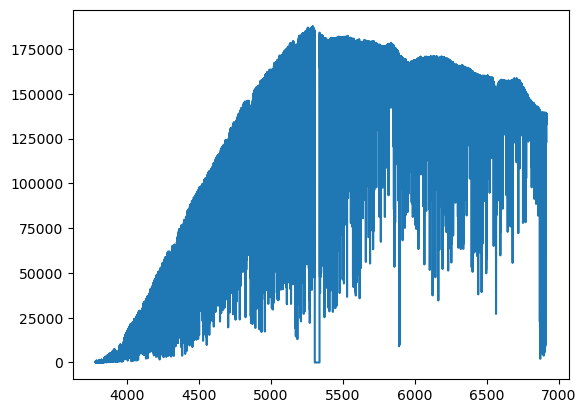

In [37]:
sun_wave = sun_fits[1].data[0][0]
sun_flux = sun_fits[1].data[0][1]

plt.plot(sun_wave, sun_flux)
plt.show()

## Spectrum_Data object assumes data is split into many orders
 - Format for arrays should be one large array holding arrays of each order within [[order0][order1][order2]...]
 - When all data is in a single array, place it inside another array [[data]] this way all data will be assumed to be within the first order
 - This is done below

In [38]:
window_width = 1.6 
depth = 90
#Load data
Test = Spectrum_Data('HARPS SOLAR', KECK_file=False, spectx=sun_wave, specty=sun_flux, order_split=(True,3500))
#replace zeros with median
replace_w(Test.flux, 0, replace_with='med')
#normalize
Test.normalize_all(window_width=window_width, continuum_depth = depth)

If values need to be replaced, use replace_w() function


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:115: RuntimeWarning: divide by zero encountered in true_divide
  err_est = self.obs_err[i]/self.pred_all[i]
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:115: RuntimeWarning: invalid value encountered in true_divide
  err_est = self.obs_err[i]/self.pred_all[i]


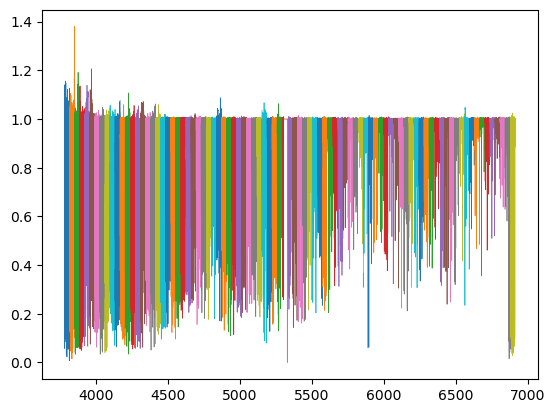

In [42]:
Test.check_spectra()

## Test time for varying order sizes (ignore this)

In [21]:
tests = 10
times = np.zeros(tests)
#order_sizes = np.linspace(65,110,tests, dtype=int)
order_sizes = np.array([90]*tests, dtype=int)
times, order_sizes

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([90, 90, 90, 90, 90, 90, 90, 90, 90, 90]))

In [22]:
test_array = np.array([None]*tests)

In [23]:
for i in range(len(test_array)):
    test_array[i] = (np.array_split(sun_wave,order_sizes[i]),np.array_split(sun_flux,order_sizes[i]))
    #print(test_array[i][1])
    #clean data
    for j in range(len(test_array[i][1])):
        gd_0 = np.where(test_array[i][1][j] == 0)
        gd = np.where(test_array[i][1][j] > 0)
        for k in gd_0:
            test_array[i][1][j][k] = np.median(test_array[i][1][j][gd])

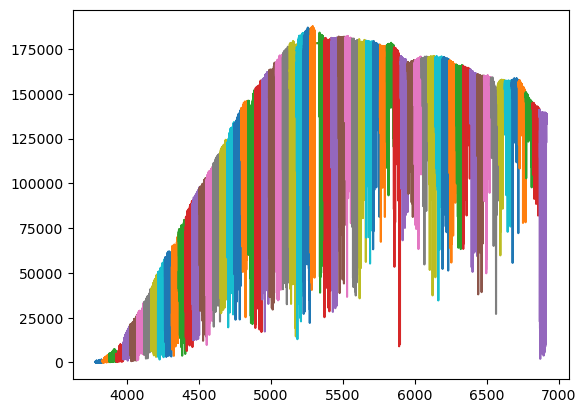

In [16]:
split = 0
order = 48
for i in range(len(test_array[split][0])):
    plt.plot(test_array[split][0][i],test_array[split][1][i])
plt.show()

In [24]:
window_width = 1.6 
depth = 90
for i in range(len(times)):
    print(i)
    t_start = time.time()
    #Load data
    Test = Spectrum_Data('HARPS SOLAR', KECK_file=False, spectx=test_array[i][0], specty=test_array[i][1])
    #normalize
    
    Test.normalize_all(window_width=window_width, continuum_depth = depth)
    t_end = time.time()
    t_diff = t_end - t_start
    print(t_diff)
    times[i] = t_diff

0
43.295814990997314
1
41.78364086151123
2
40.48871684074402
3
60.70660090446472
4
56.96202874183655
5
48.508358001708984
6
57.796095848083496
7
57.25584626197815
8
50.49822521209717
9
50.94594717025757


3479
3479
3479
3479
3479
3479
3479
3479
3479
3479


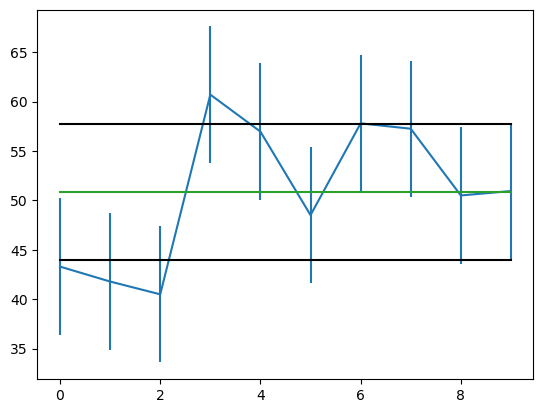

In [28]:
for i in test_array:
    print(len(i[0][0]))
plt.plot(np.arange(len(times)), times)
plt.errorbar(np.arange(len(times)), times, yerr=times.std(), fmt='None')
plt.plot([0,9],[times.mean()+times.std(), times.mean()+times.std()], c='k')
plt.plot([0,9],[times.mean(), times.mean()], c='tab:green')
plt.plot([0,9],[times.mean()-times.std(), times.mean()-times.std()], c = 'k')
plt.show()

4817
4473
4175
3914
3684
3479
3296
3132
2982
2847


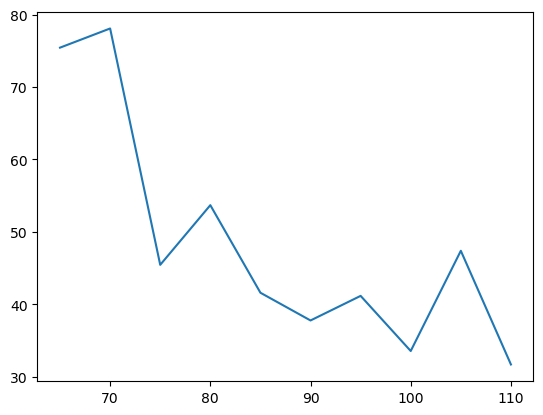

In [18]:
for i in test_array:
    print(len(i[0][0]))
plt.plot(order_sizes, times)
plt.show()

3131


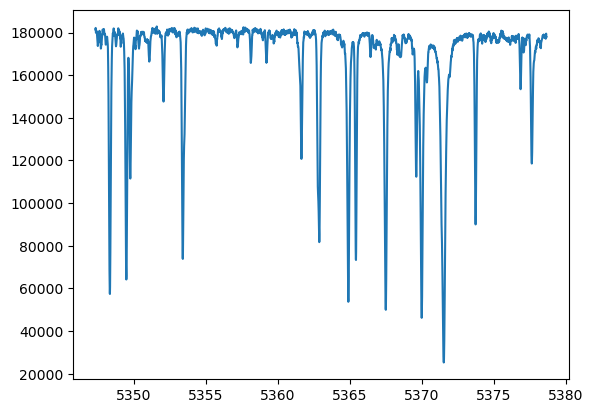

In [15]:
print(len(test_array[9][0][50]))
plt.plot(test_array[9][0][50], test_array[9][1][50])
plt.show()

In [51]:
%%time
#Load data
Test = Spectrum_Data('HARPS SOLAR', KECK_file=False, spectx=test_array[0][0], specty=test_array[0][1])
#normalize
window_width = 1.6 
depth = 90
Test.normalize_all(window_width=window_width, continuum_depth = depth)

CPU times: user 56.3 s, sys: 1.65 s, total: 57.9 s
Wall time: 30.9 s


In [7]:
sun_wave = np.array([sun_wave])
sun_flux = np.array([sun_flux])

In [8]:
all_orders_wave = np.array_split(sun_wave[0],42) #50
all_orders_flux = np.array_split(sun_flux[0],42) #50

In [9]:
gd_0 = np.where(all_orders_flux[20] == 0) #24
gd = np.where(all_orders_flux[20] > 0)    #24

In [10]:
print(np.median(all_orders_flux[20][gd])) #24
for i in gd_0[0]:
    all_orders_flux[20][i] = np.median(all_orders_flux[20][gd])

180269.47


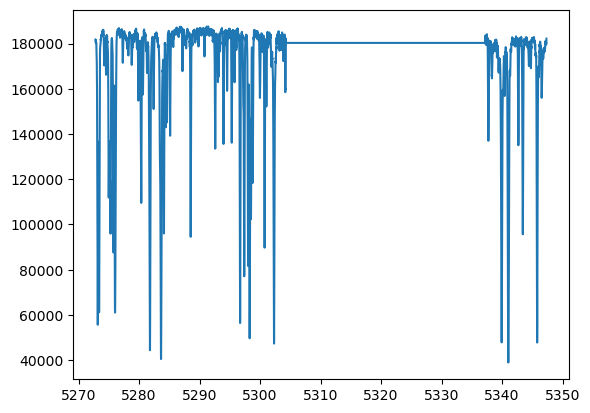

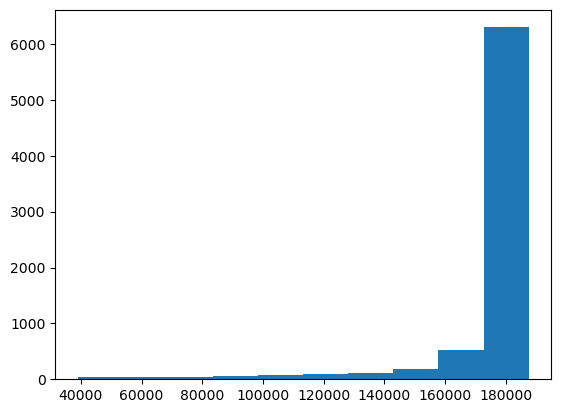

180269.47


In [11]:
order = 20
plt.plot(all_orders_wave[order], all_orders_flux[order])
#plt.plot([all_orders_wave[order].min(), all_orders_wave[order].max()],[np.median(all_orders_flux[24][gd]),np.median(all_orders_flux[24][gd])], 'y--')
plt.show()

plt.hist(all_orders_flux[order])
plt.show()

print(np.median(all_orders_flux[order]))

In [12]:
#Load into spectrum object
Sun = Spectrum_Data('HARPS SOLAR', KECK_file=False, spectx=all_orders_wave, specty=all_orders_flux)

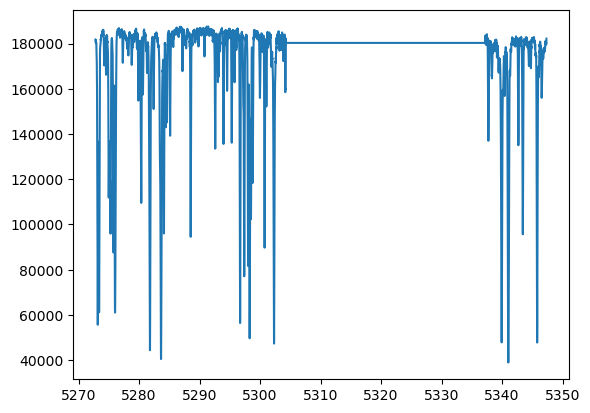

In [13]:
plt.plot(Sun.shifted_wavelength[20], Sun.flux[20])
#plt.xlim([6002.75,6003.25])
plt.show()

In [14]:
%%time
window_width = 1.6 
depth = 90
Sun.normalize_all(window_width=window_width, continuum_depth = depth)

CPU times: user 5min 39s, sys: 11 s, total: 5min 50s
Wall time: 3min 19s


In [40]:
Sun.check_spectra()

NameError: name 'Sun' is not defined

## Measure lines in Harps data

In [43]:
%%time
#linelist_path = '/Users/georgevejar/Documents/GitHub/Spectrum_project/Sun_ew_test1.txt'
linelist_path = Path('../Line_list_sample/HARPS_fe_sample.txt')

lines = np.genfromtxt(linelist_path, skip_header = 1, usecols = 0)
elmnt = np.genfromtxt(linelist_path, skip_header = 1, usecols = 1)
EP = np.genfromtxt(linelist_path, skip_header = 1, usecols = 2)
OS = np.genfromtxt(linelist_path, skip_header = 1, usecols = 3)
ex = np.genfromtxt(linelist_path, skip_header = 1, usecols = 4)
ews = np.genfromtxt(linelist_path, skip_header = 1, usecols = 5)

#Load lines into class
Test.load_lines(linelist_path)

CPU times: user 7.33 ms, sys: 3.76 ms, total: 11.1 ms
Wall time: 15.1 ms


line to measure: Fe II 4620.521 - Line found: 4620.52
EW: 54.01 ± 0.3 simps-int: 54.01 ± 0.3


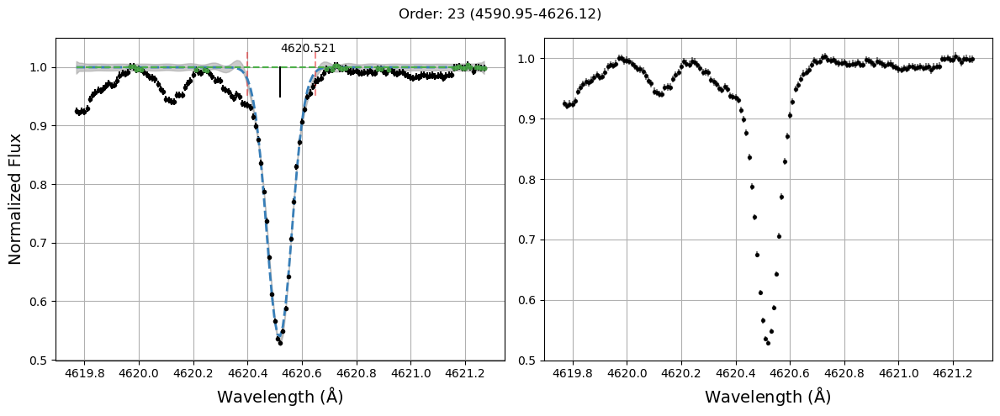

#-----------------------#
line to measure: Fe I 4779.439 - Line found: 4779.4400000000005
EW: 41.74 ± 0.26 simps-int: 41.74 ± 0.26


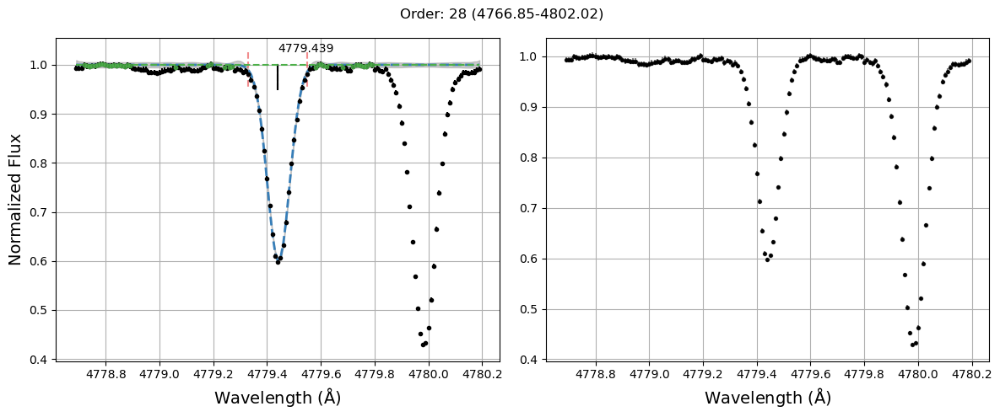

#-----------------------#
line to measure: Fe I 4788.757 - Line found: 4788.76
EW: 67.22 ± 0.25 simps-int: 67.21 ± 0.25


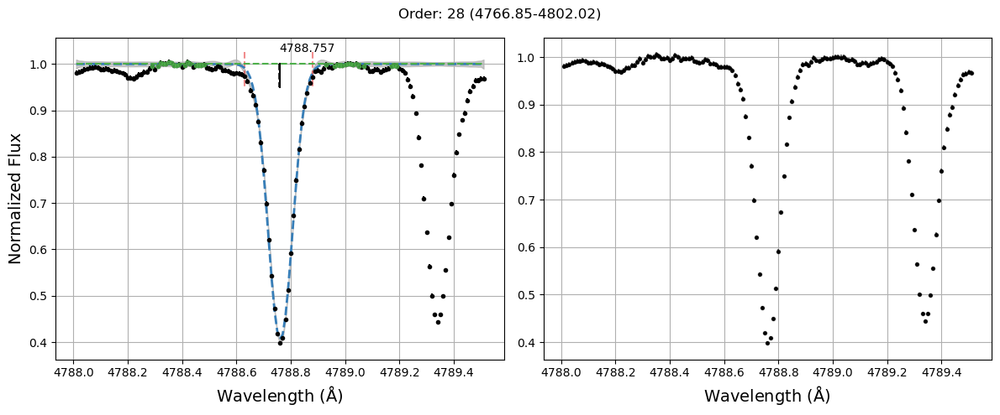

#-----------------------#
line to measure: Fe I 5054.643 - Line found: 5054.650000000001
EW: 39.78 ± 0.25 simps-int: 39.78 ± 0.25


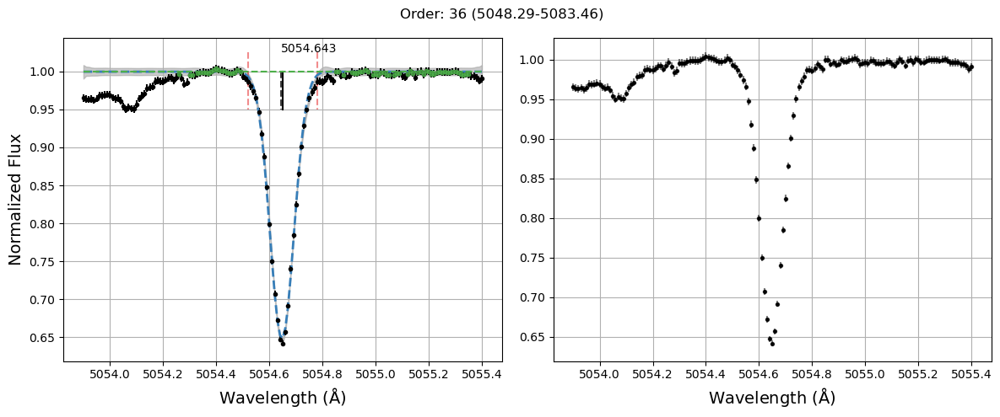

#-----------------------#
line to measure: Fe II 5197.577 - Line found: 5197.58
EW: 80.81 ± 0.24 simps-int: 80.8 ± 0.24


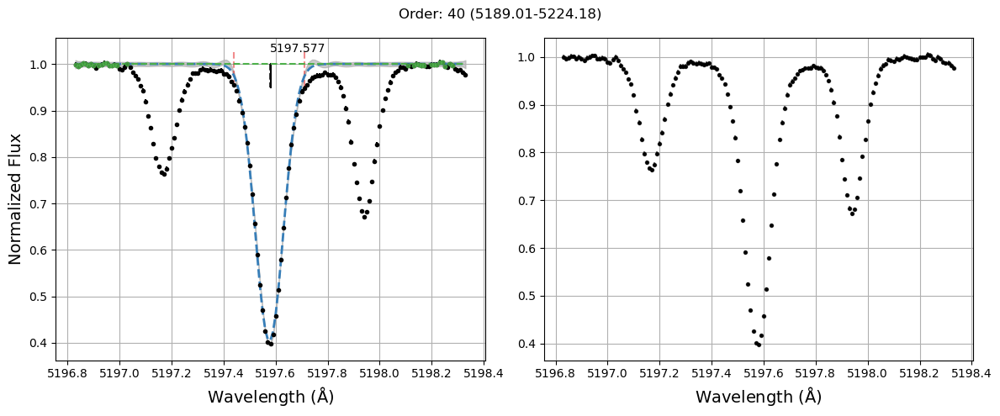

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe II 5234.625 - Line found: 5234.63
EW: 82.63 ± 0.24 simps-int: 82.62 ± 0.24


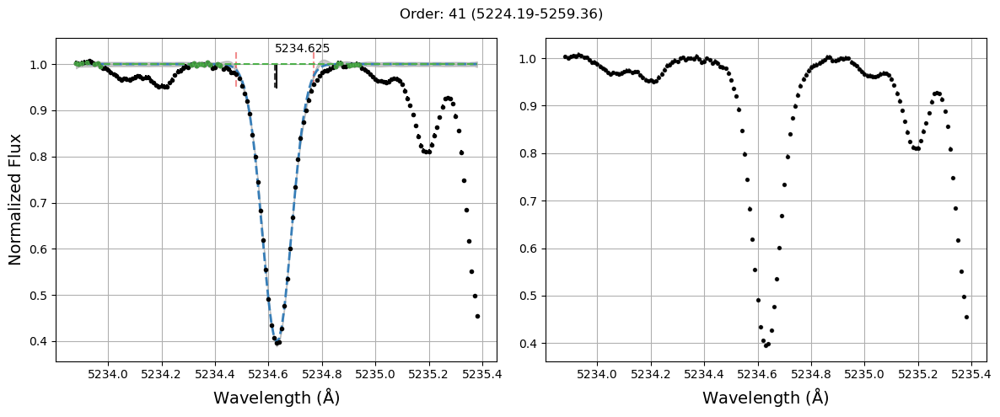

#-----------------------#
line to measure: Fe II 5264.812 - Line found: 5264.81
EW: 44.87 ± 0.22 simps-int: 44.87 ± 0.22


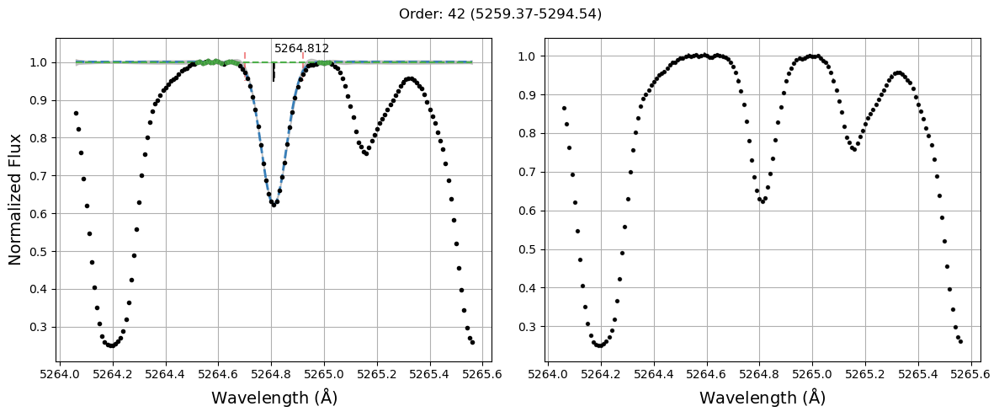

#-----------------------#
line to measure: Fe I 5379.574 - Line found: 5379.58
EW: 61.97 ± 0.23 simps-int: 61.97 ± 0.23


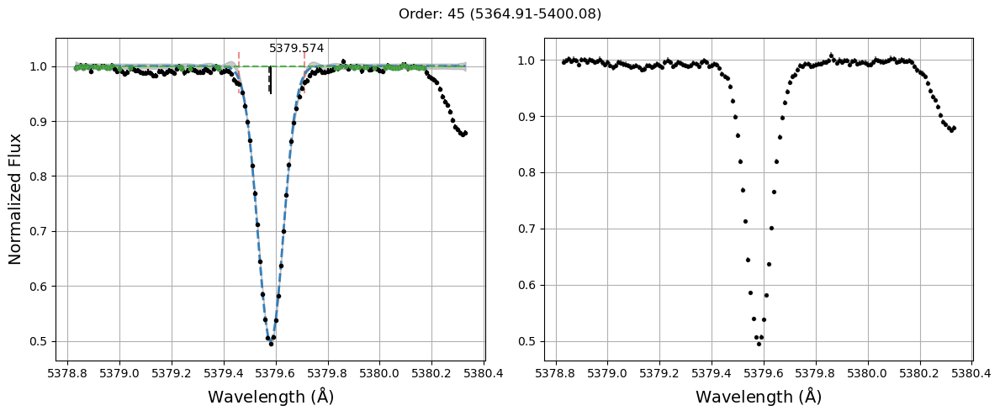

#-----------------------#
line to measure: Fe II 5414.073 - Line found: 5414.07
EW: 27.34 ± 0.24 simps-int: 27.34 ± 0.24


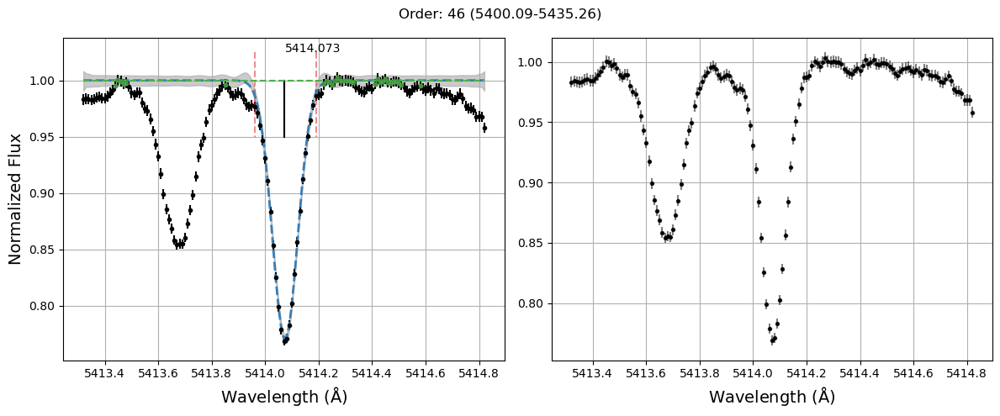

#-----------------------#
line to measure: Fe II 5425.257 - Line found: 5425.25
EW: 41.51 ± 0.26 simps-int: 41.5 ± 0.26


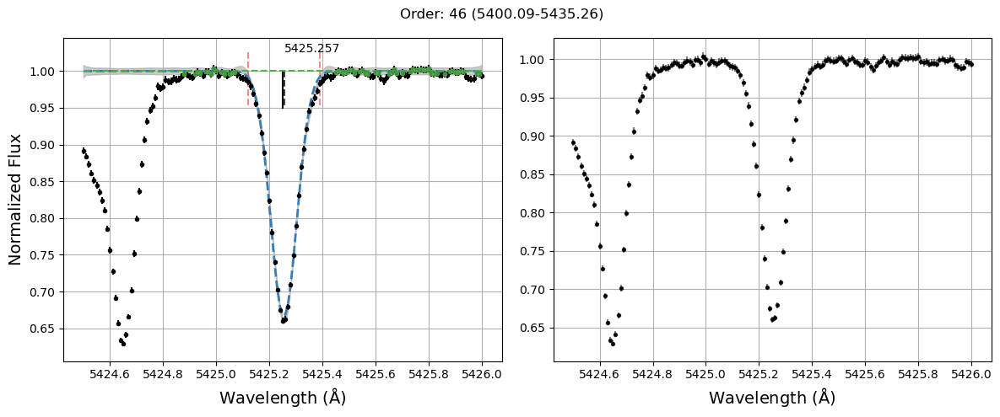

#-----------------------#
line to measure: Fe I 5522.447 - Line found: 5522.450000000001
EW: 44.55 ± 0.27 simps-int: 44.55 ± 0.27


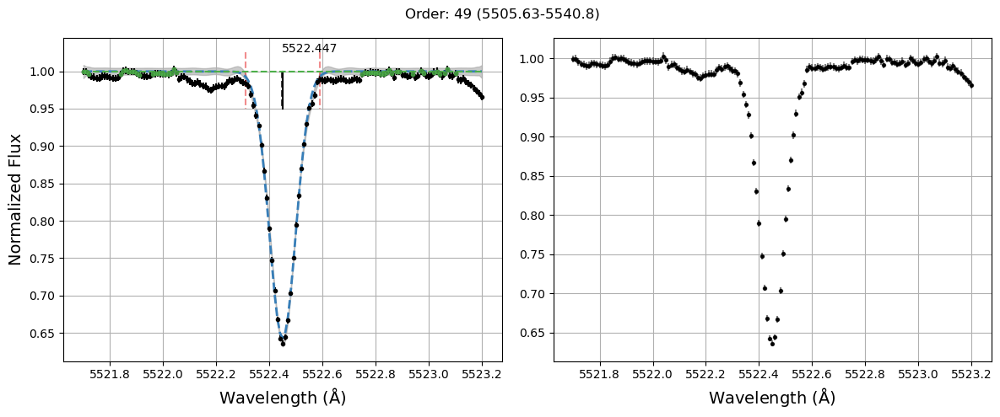

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5543.936 - Line found: 5543.9400000000005
EW: 63.43 ± 0.27 simps-int: 63.42 ± 0.27


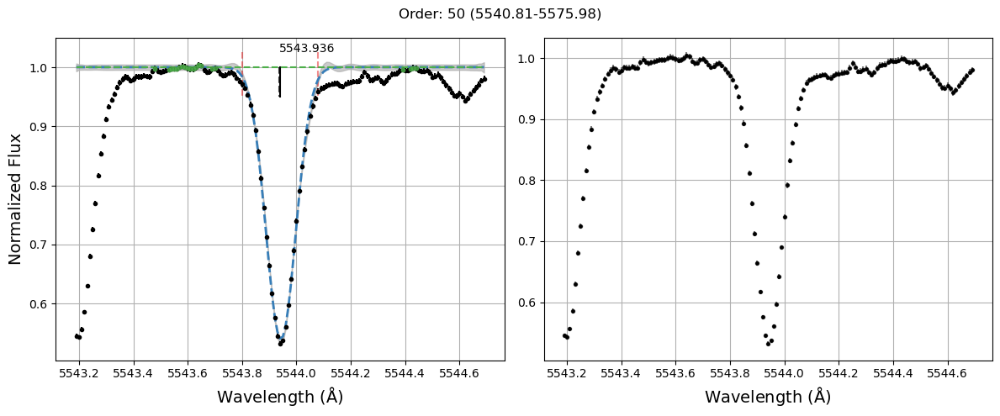

#-----------------------#
line to measure: Fe I 5546.5 - Line found: 5546.51
EW: 52.61 ± 0.23 simps-int: 52.6 ± 0.23


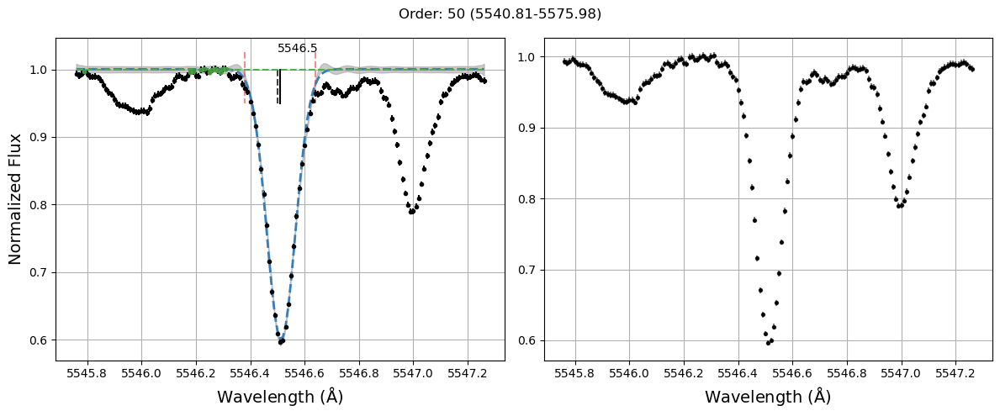

#-----------------------#
line to measure: Fe I 5546.991 - Line found: 5546.99
EW: 27.59 ± 0.26 simps-int: 27.59 ± 0.26


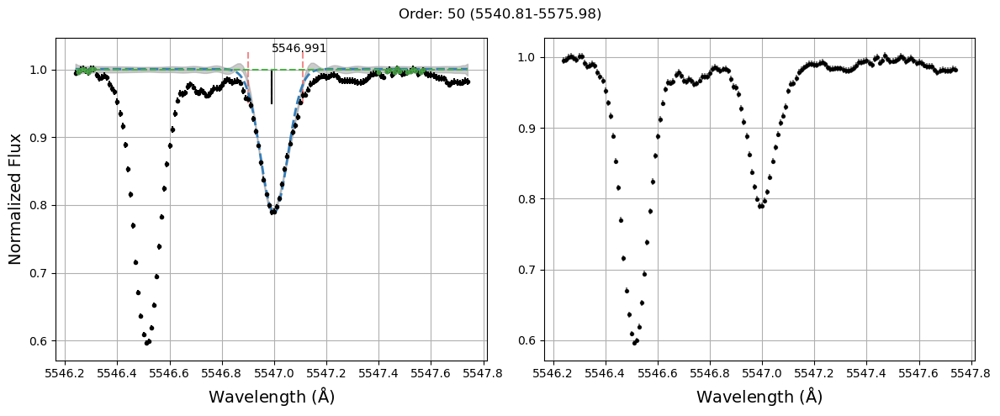

#-----------------------#
line to measure: Fe I 5560.207 - Line found: 5560.22
EW: 52.73 ± 0.25 simps-int: 52.72 ± 0.25


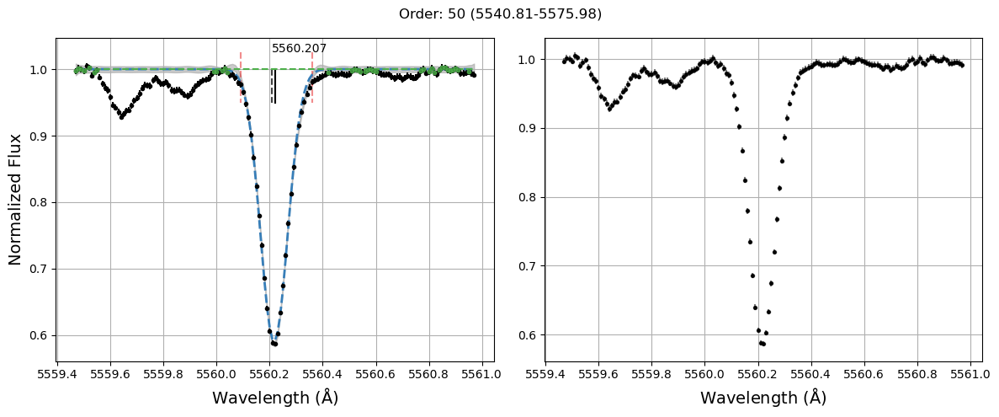

#-----------------------#
line to measure: Fe I 5577.03 - Line found: 5577.030000000001
EW: 11.82 ± 0.25 simps-int: 11.82 ± 0.25


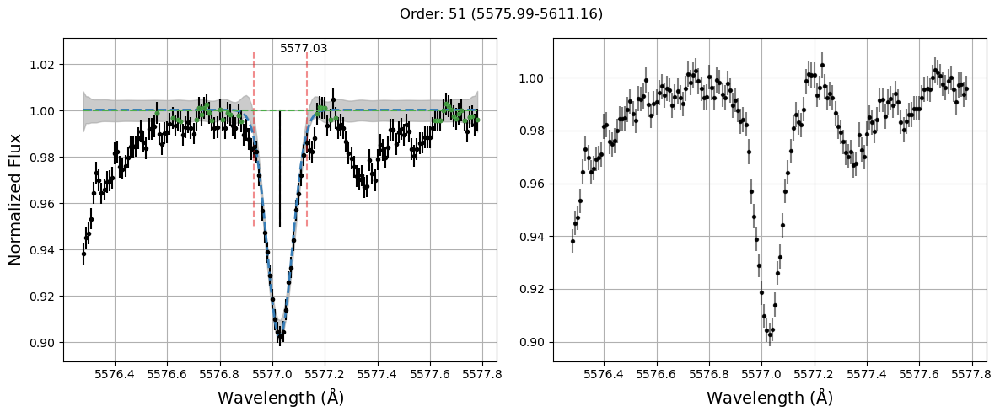

#-----------------------#
line to measure: Fe I 5579.335 - Line found: 5579.33
EW: 7.17 ± 0.19 simps-int: 7.17 ± 0.19


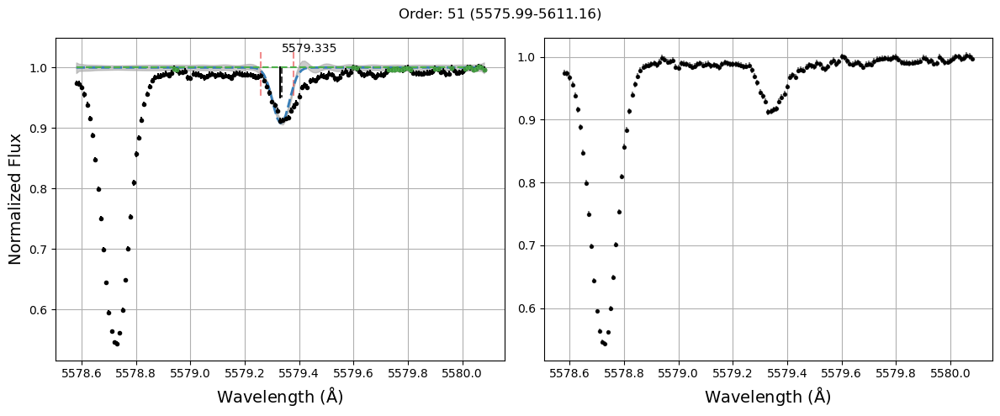

#-----------------------#
line to measure: Fe I 5587.574 - Line found: 5587.58
EW: 35.52 ± 0.25 simps-int: 35.52 ± 0.25


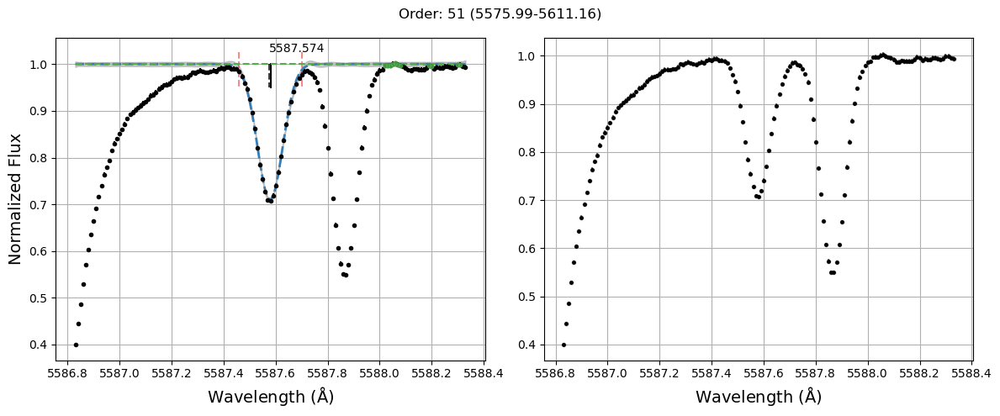

#-----------------------#
line to measure: Fe I 5646.684 - Line found: 5646.68
EW: 8.0 ± 0.57 simps-int: -4.29 ± 6.78


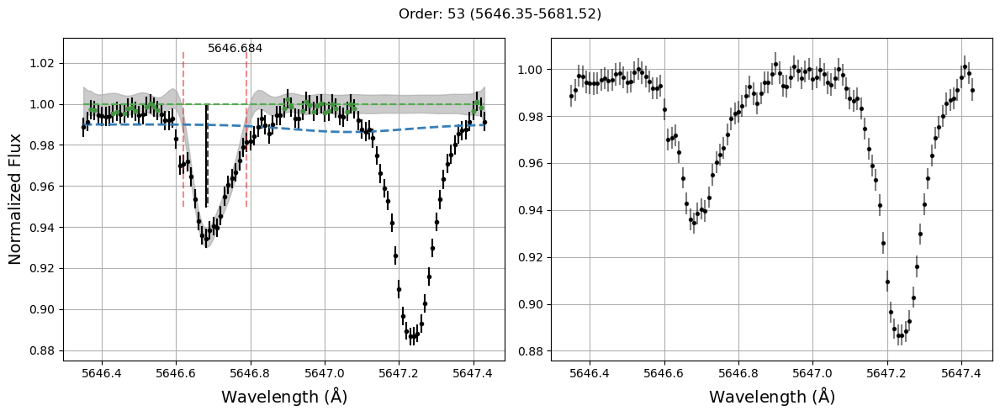

#-----------------------#
line to measure: Fe I 5651.469 - Line found: 5651.47
EW: 19.29 ± 0.27 simps-int: 19.29 ± 0.27


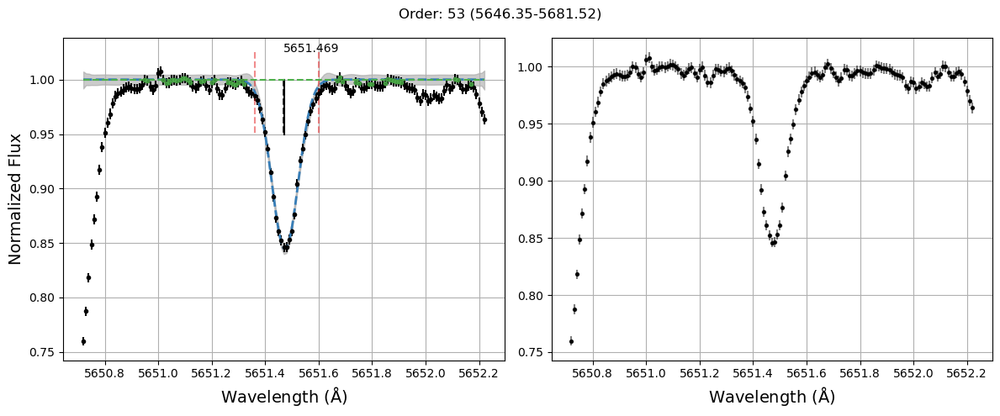

#-----------------------#
line to measure: Fe I 5652.318 - Line found: 5652.32
EW: 27.65 ± 0.28 simps-int: 27.65 ± 0.28


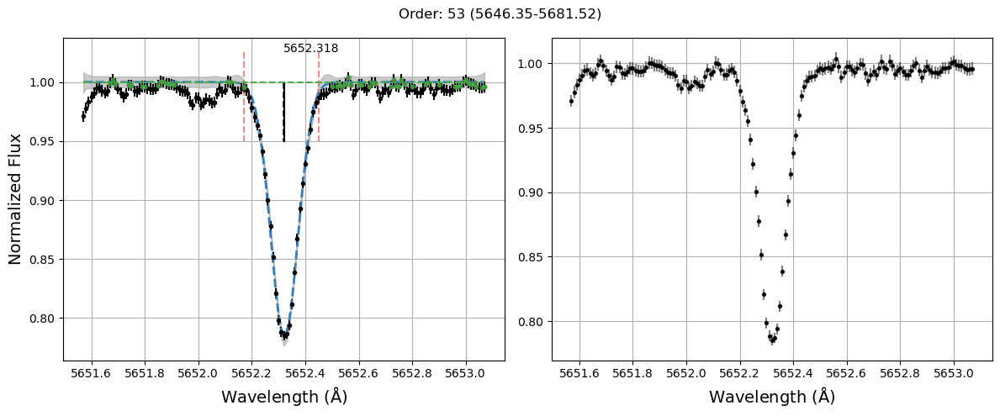

#-----------------------#
line to measure: Fe I 5661.346 - Line found: 5661.34
EW: 23.43 ± 0.25 simps-int: 23.43 ± 0.25


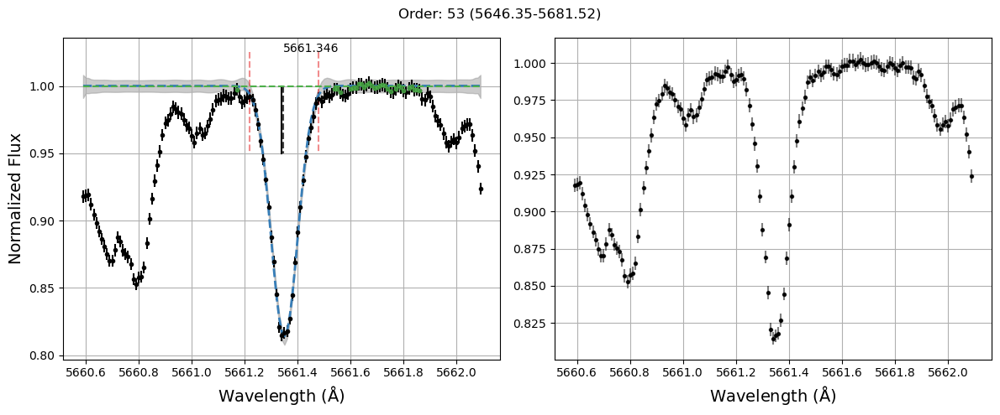

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5667.518 - Line found: 5667.52
EW: 53.12 ± 0.29 simps-int: 53.12 ± 0.29


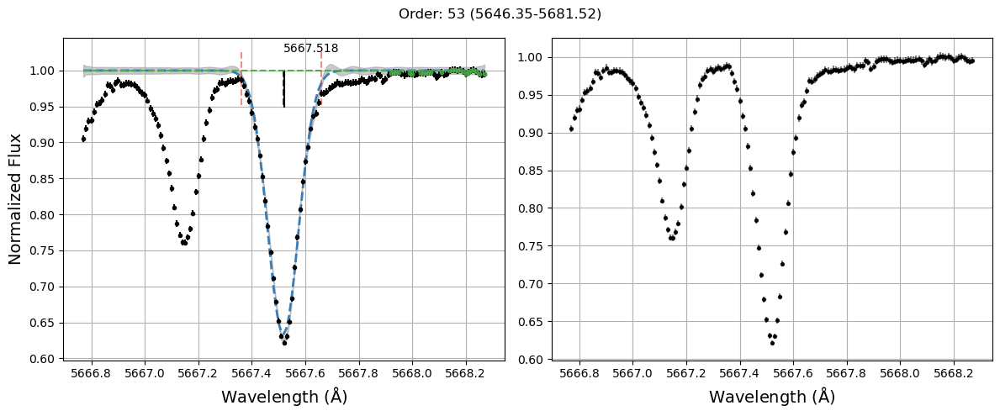

#-----------------------#
line to measure: Fe I 5677.684 - Line found: 5677.700000000001
EW: 7.48 ± 0.27 simps-int: 7.48 ± 0.27


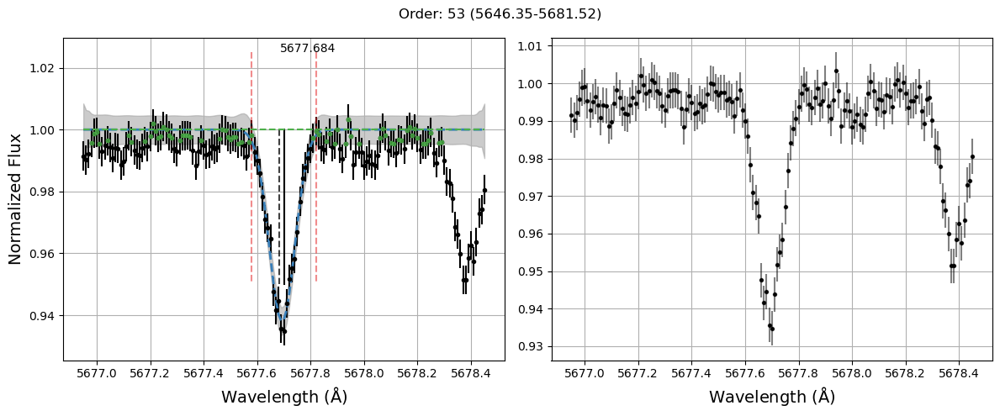

#-----------------------#
line to measure: Fe I 5679.023 - Line found: 5679.030000000001
EW: 59.79 ± 0.26 simps-int: 59.78 ± 0.26


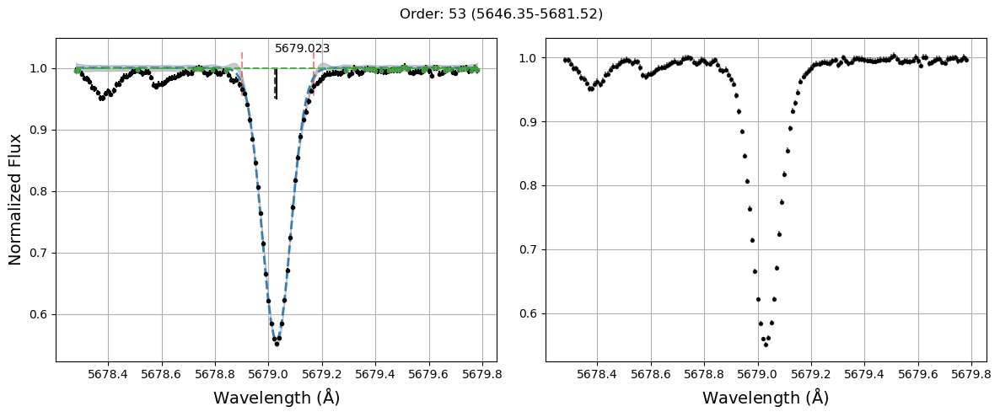

#-----------------------#
line to measure: Fe I 5680.24 - Line found: 5680.24
EW: 11.18 ± 0.25 simps-int: 11.18 ± 0.25


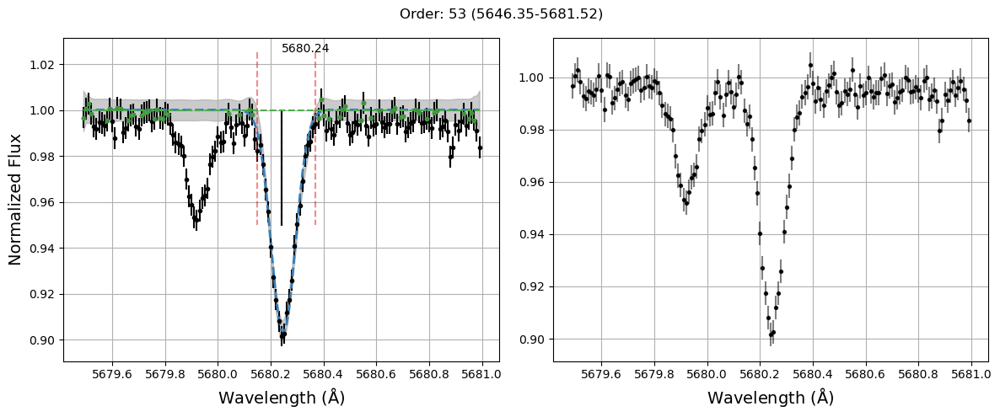

#-----------------------#
line to measure: Fe I 5731.762 - Line found: 5731.77
EW: 58.33 ± 0.25 simps-int: 58.33 ± 0.25


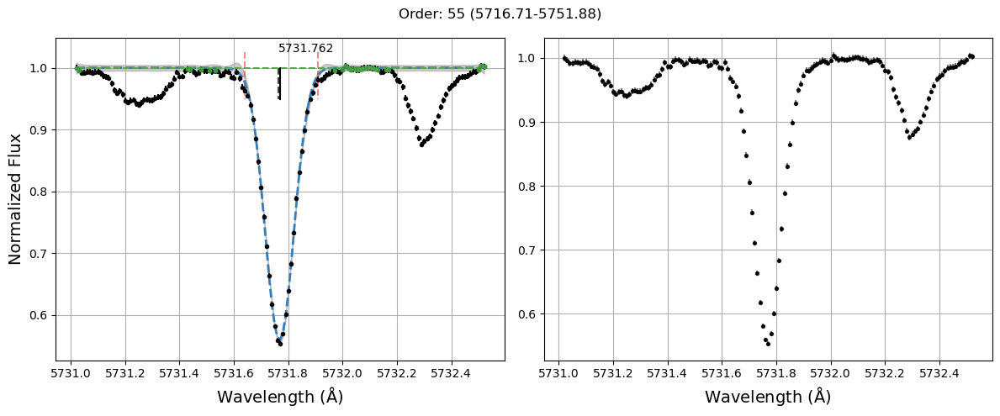

#-----------------------#
line to measure: Fe I 5732.275 - Line found: 5732.29
EW: 14.57 ± 0.23 simps-int: 14.57 ± 0.23


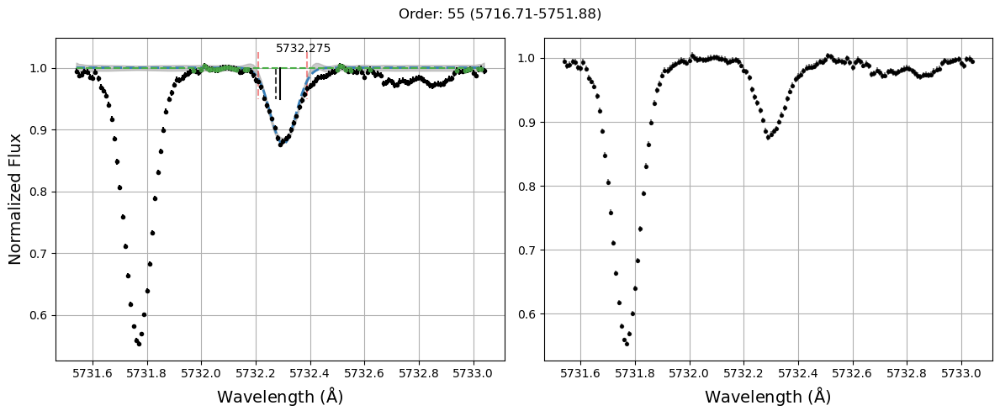

#-----------------------#
line to measure: Fe I 5741.846 - Line found: 5741.85
EW: 32.76 ± 0.26 simps-int: 32.76 ± 0.26


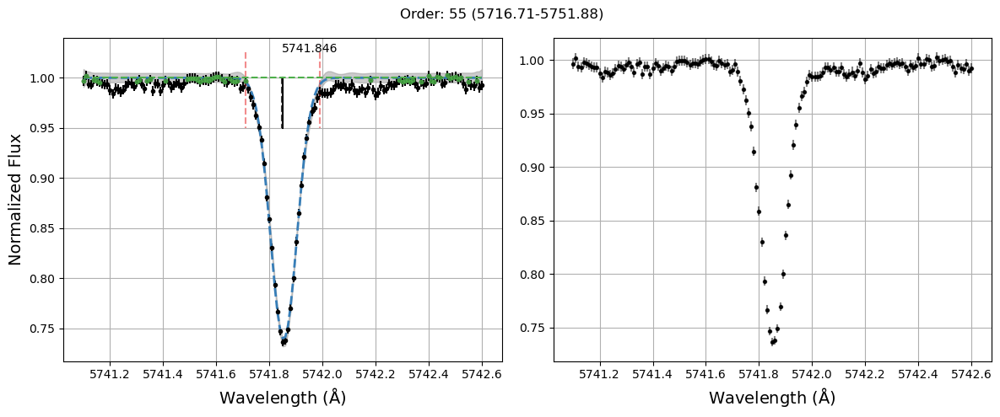

#-----------------------#
line to measure: Fe I 5752.032 - Line found: 5752.04
EW: 55.23 ± 0.29 simps-int: 55.22 ± 0.29


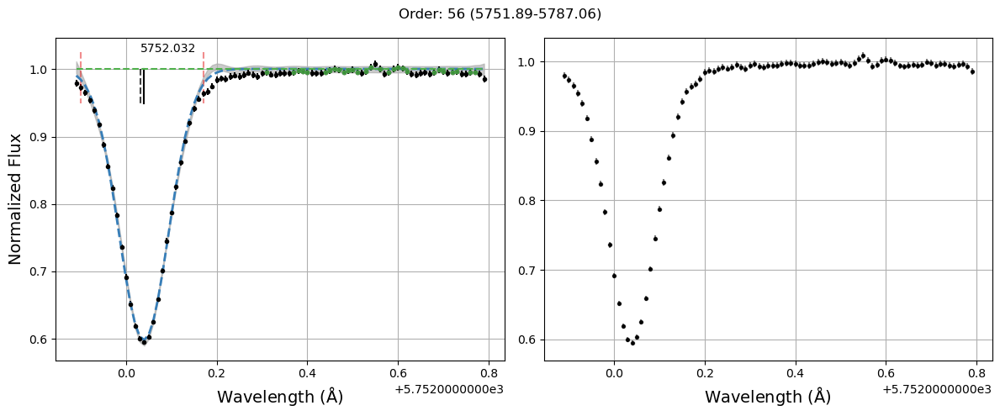

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5775.081 - Line found: 5775.08
EW: 60.09 ± 0.28 simps-int: 60.08 ± 0.28


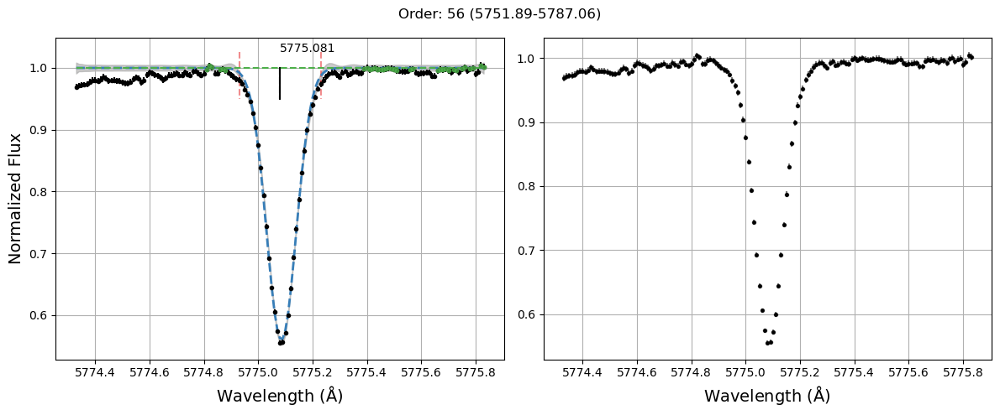

#-----------------------#
line to measure: Fe I 5778.45 - Line found: 5778.47
EW: 22.9 ± 0.26 simps-int: 22.9 ± 0.26


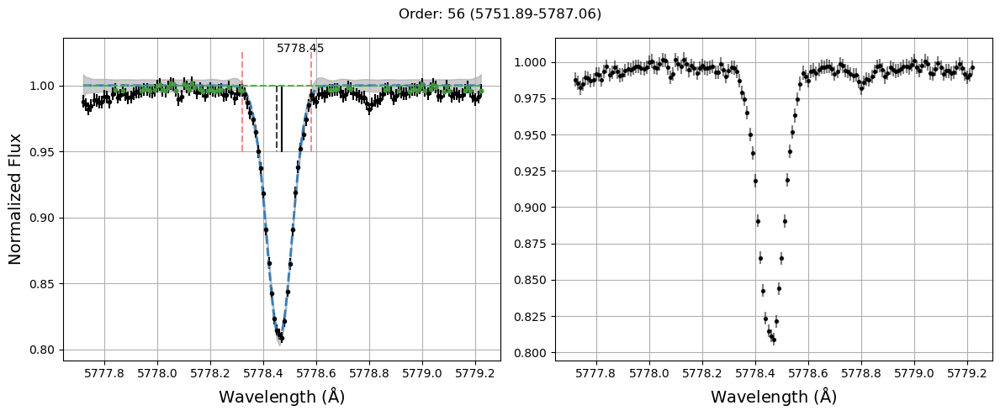

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5809.218 - Line found: 5809.2300000000005
EW: 51.06 ± 0.27 simps-int: 51.05 ± 0.27


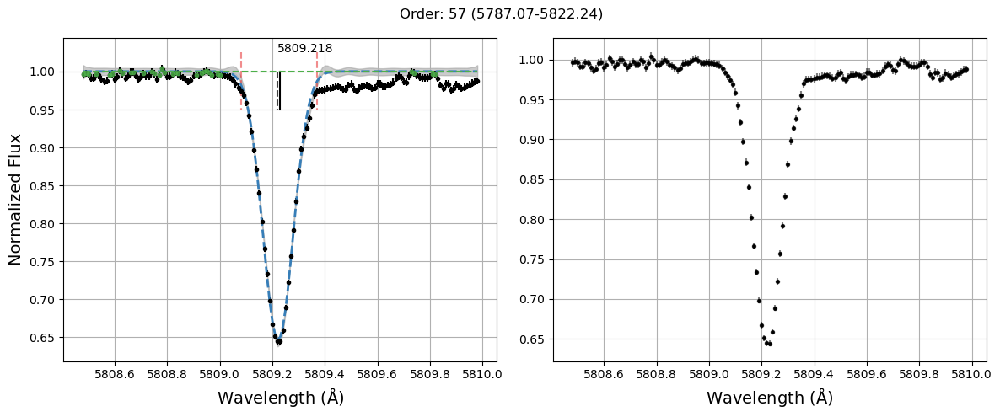

#-----------------------#
line to measure: Fe I 5934.655 - Line found: 5934.66
EW: 76.5 ± 0.28 simps-int: 76.49 ± 0.28


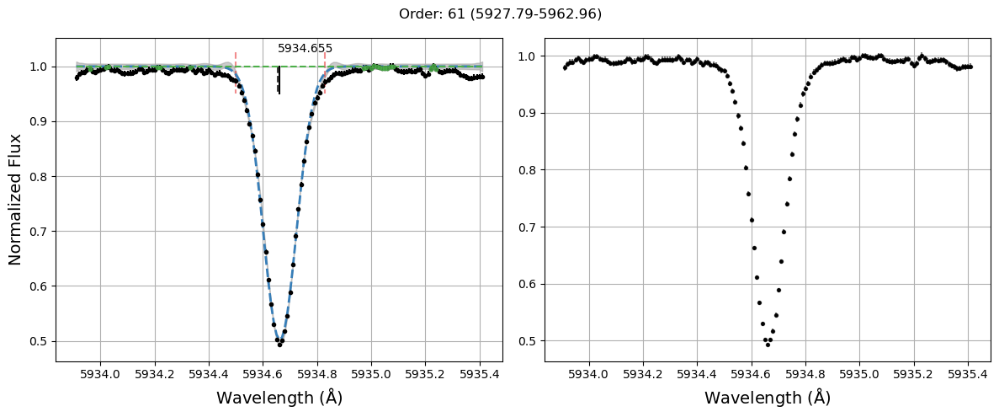

#-----------------------#
line to measure: Fe I 6078.999 - Line found: 6079.01
EW: 46.03 ± 0.26 simps-int: 46.03 ± 0.26


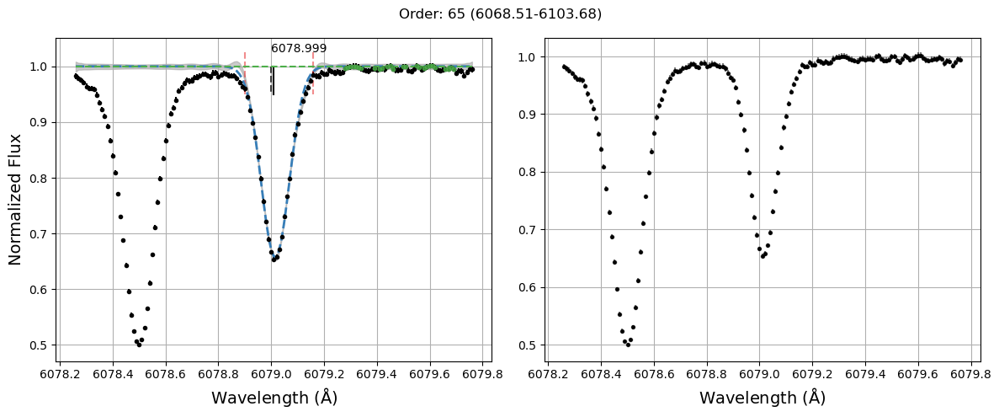

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 6085.259 - Line found: 6085.26
EW: 44.4 ± 0.28 simps-int: 44.39 ± 0.28


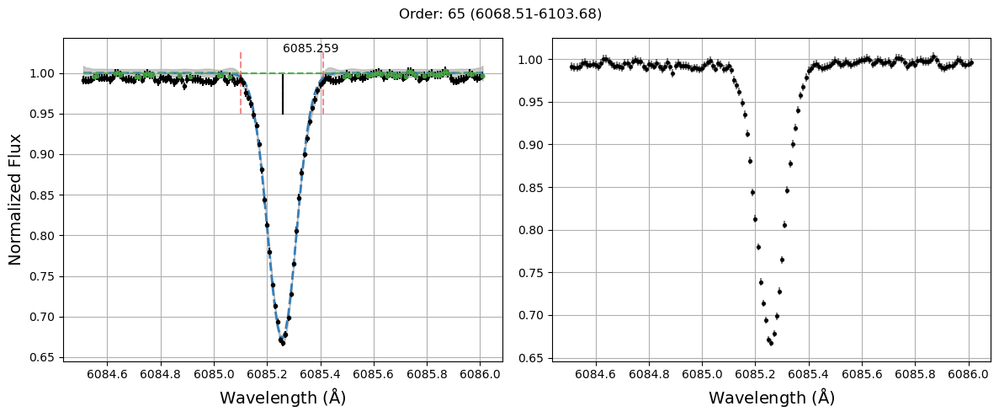

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6098.245 - Line found: 6098.24
EW: 17.62 ± 0.29 simps-int: 17.62 ± 0.29


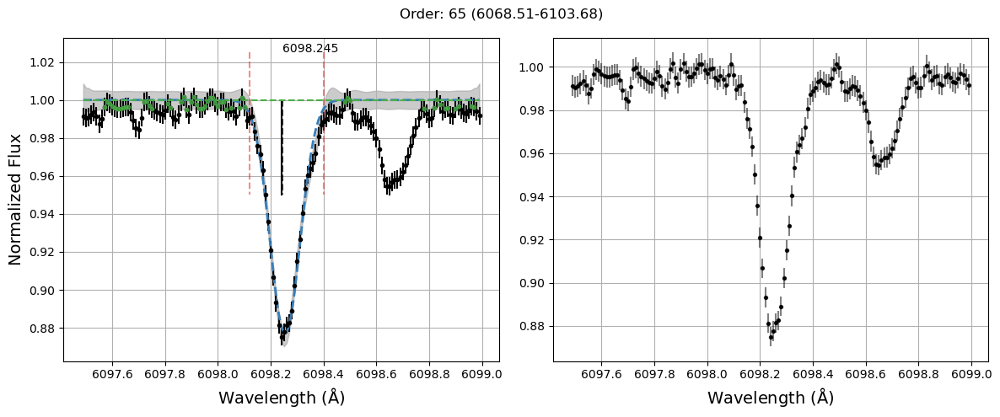

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 6084.111 - Line found: 6084.120000000001
EW: 22.06 ± 0.29 simps-int: 22.06 ± 0.29


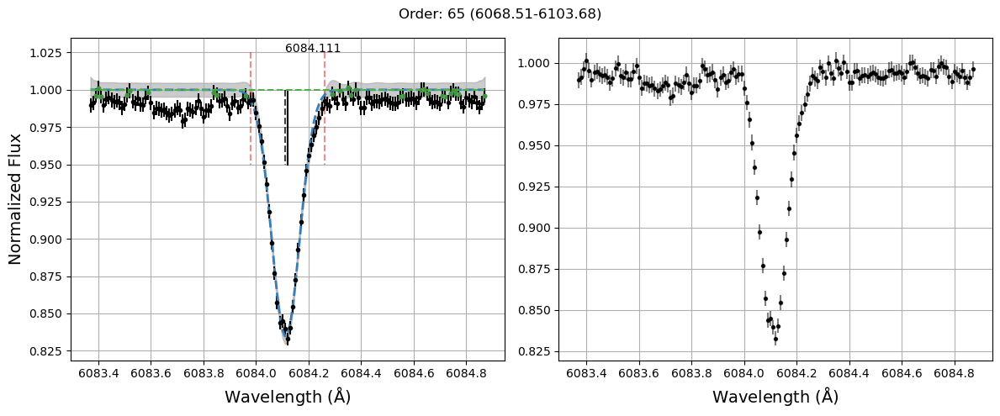

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 6113.322 - Line found: 6113.32
EW: 12.7 ± 0.3 simps-int: 12.7 ± 0.3


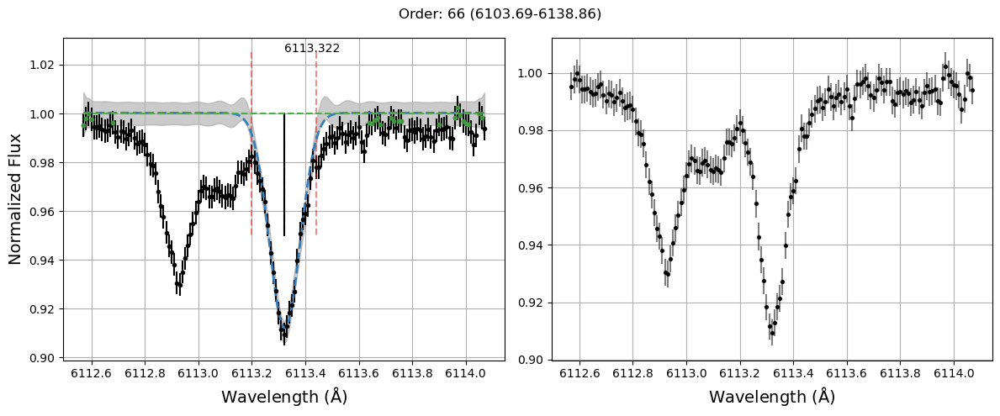

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6151.617 - Line found: 6151.620000000001
EW: 51.03 ± 0.27 simps-int: 51.03 ± 0.27


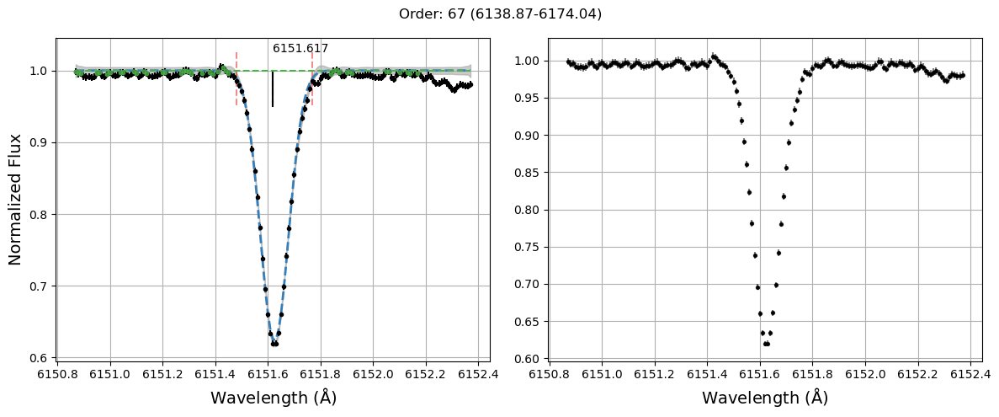

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6159.368 - Line found: 6159.38
EW: 12.93 ± 0.29 simps-int: 12.93 ± 0.29


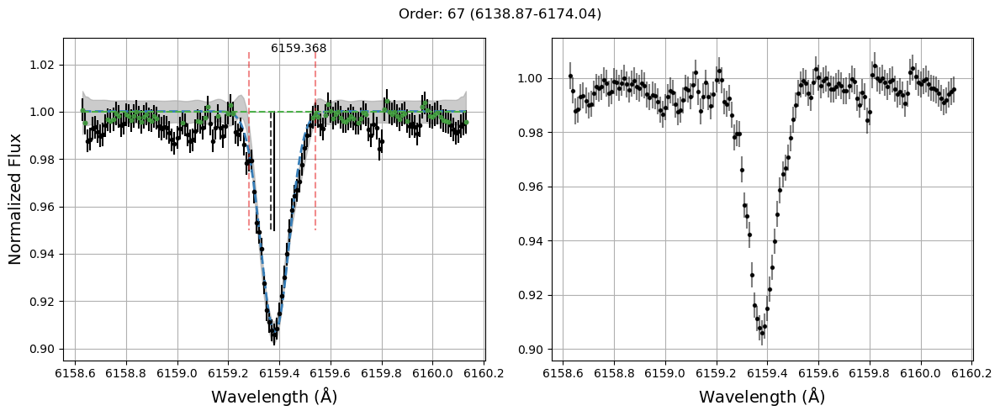

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6165.36 - Line found: 6165.360000000001
EW: 45.78 ± 0.28 simps-int: 45.77 ± 0.28


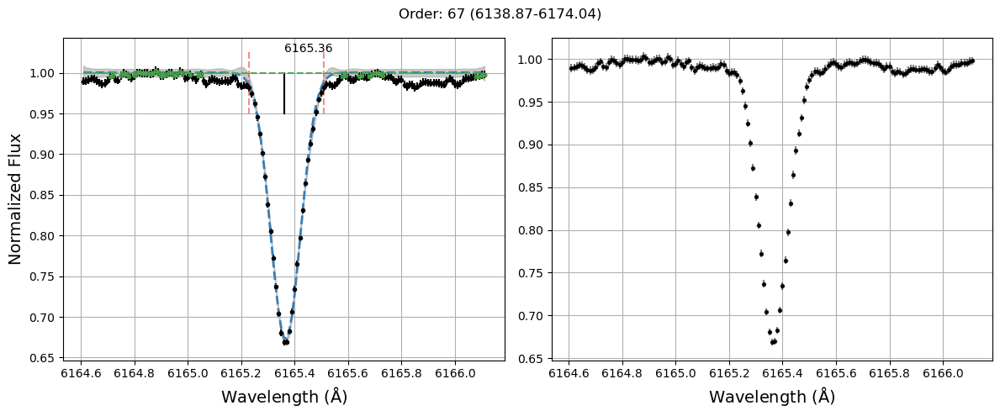

#-----------------------#
SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:529: RuntimeWarning: Mean of empty slice.
  best_bf = np.array([a_values[np.w

line to measure: Fe I 6173.336 - Line found: 6173.34
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


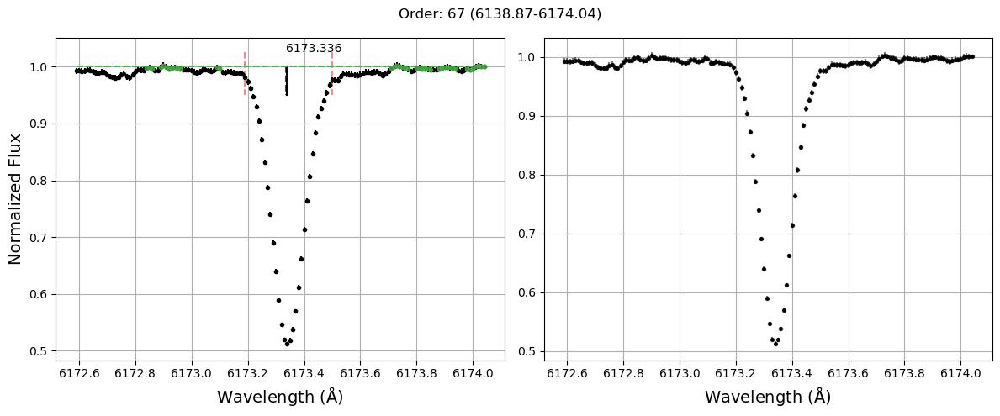

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 6149.258 - Line found: 6149.25
EW: 36.96 ± 0.29 simps-int: 36.96 ± 0.29


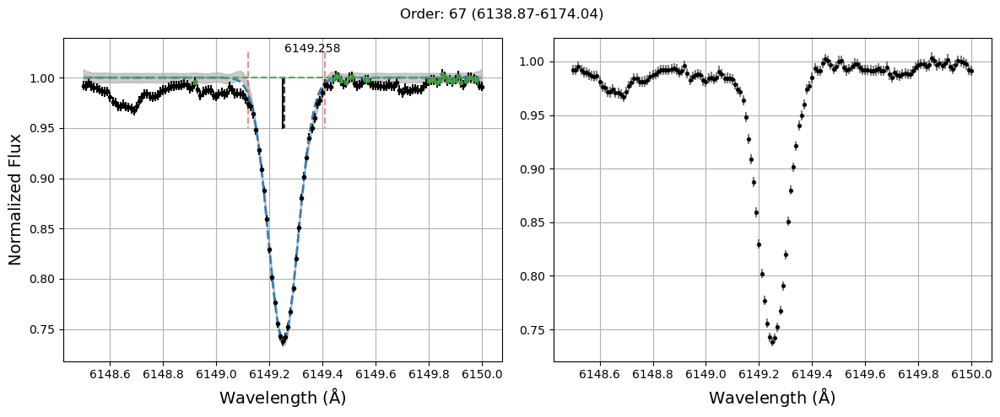

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 6187.987 - Line found: 6188.0
EW: 48.35 ± 0.27 simps-int: 48.34 ± 0.27


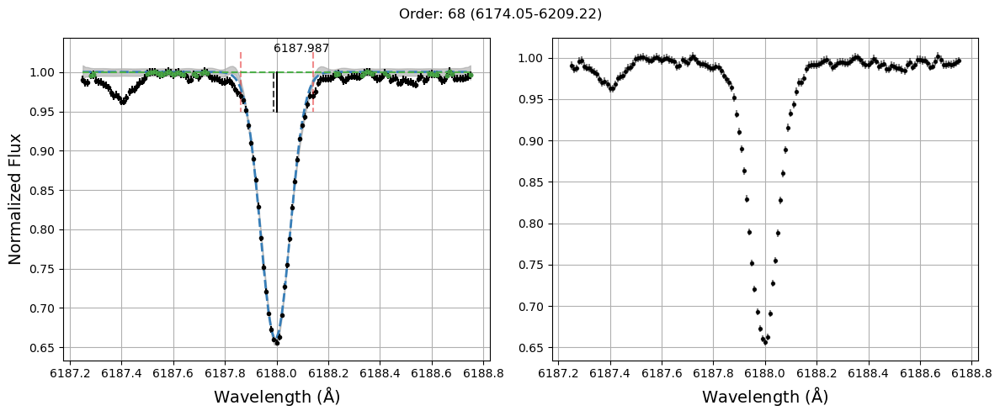

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6220.776 - Line found: 6220.790000000001
EW: 20.29 ± 0.29 simps-int: 20.29 ± 0.29


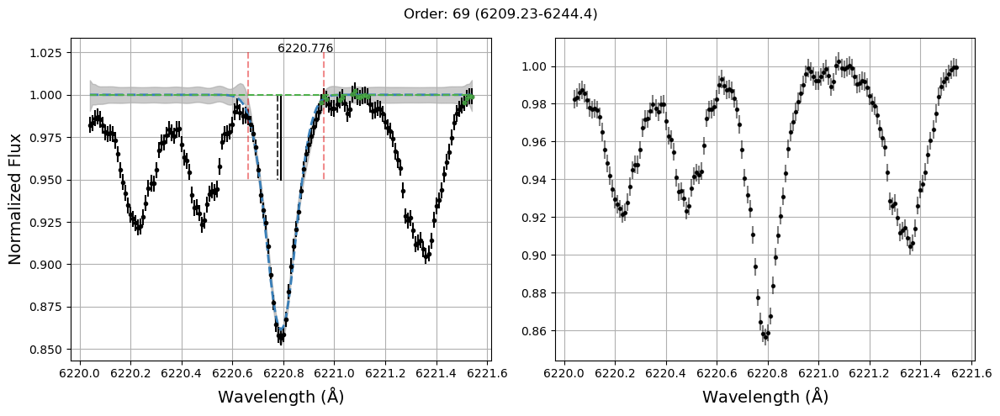

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6226.73 - Line found: 6226.74
EW: 30.05 ± 0.28 simps-int: 30.05 ± 0.28


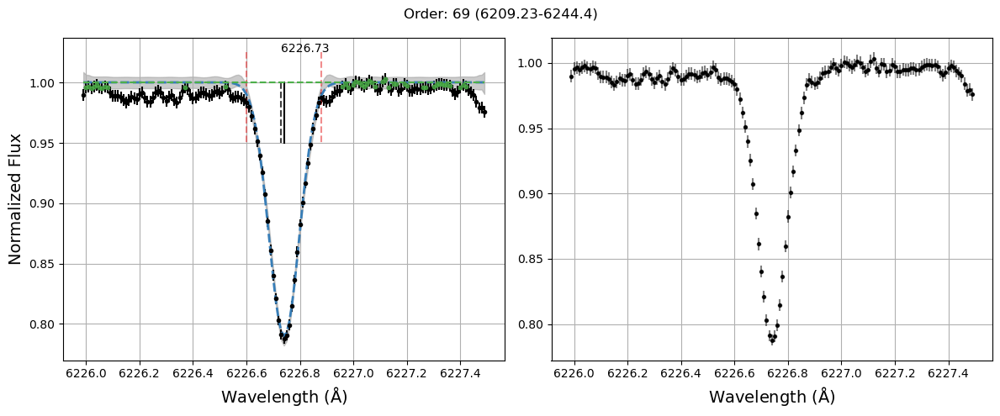

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6229.228 - Line found: 6229.24
EW: 39.06 ± 0.29 simps-int: 39.05 ± 0.29


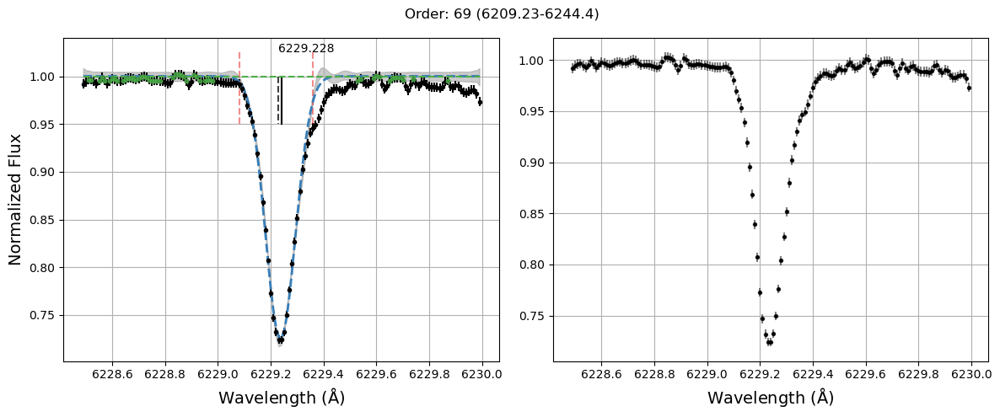

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6240.645 - Line found: 6240.66
EW: 49.74 ± 0.27 simps-int: 49.74 ± 0.27


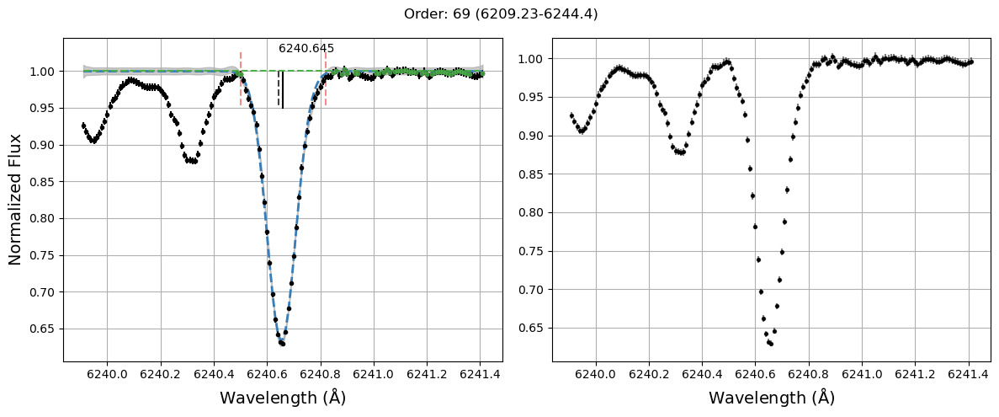

#-----------------------#
line to measure: Fe II 6247.557 - Line found: 6247.57
EW: 53.44 ± 0.3 simps-int: 53.44 ± 0.3


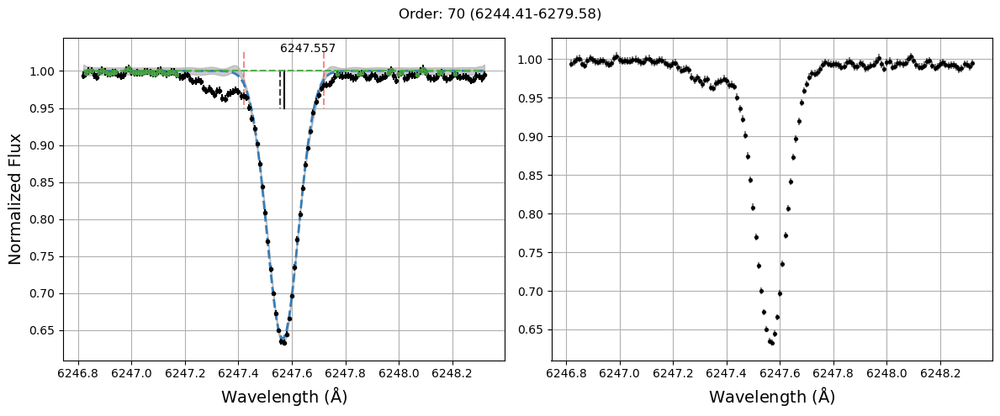

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 6293.924 - Line found: 6293.92
EW: 13.92 ± 0.3 simps-int: 13.91 ± 0.3


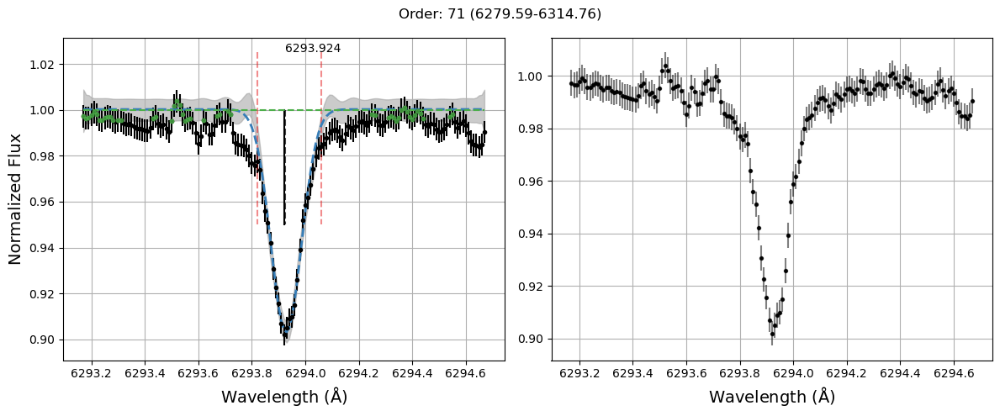

#-----------------------#
line to measure: Fe I 6297.793 - Line found: 6297.8
EW: 74.63 ± 0.29 simps-int: 74.63 ± 0.29


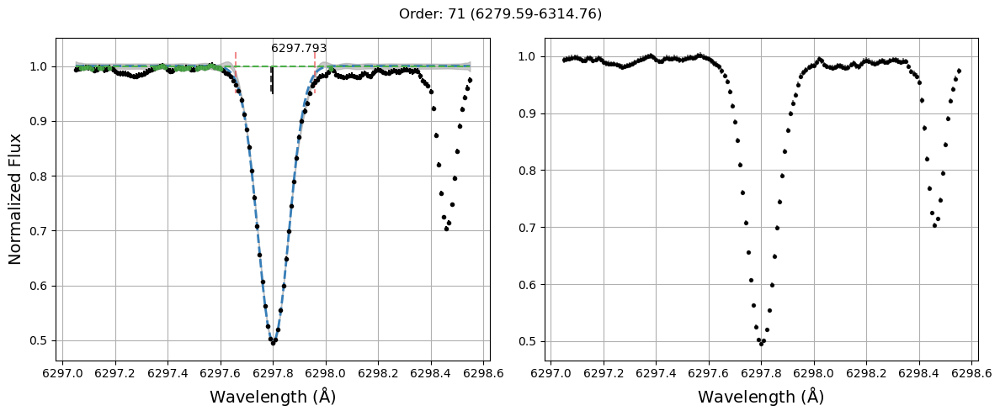

#-----------------------#
line to measure: Fe I 6322.685 - Line found: 6322.6900000000005
EW: 76.94 ± 0.28 simps-int: 76.94 ± 0.28


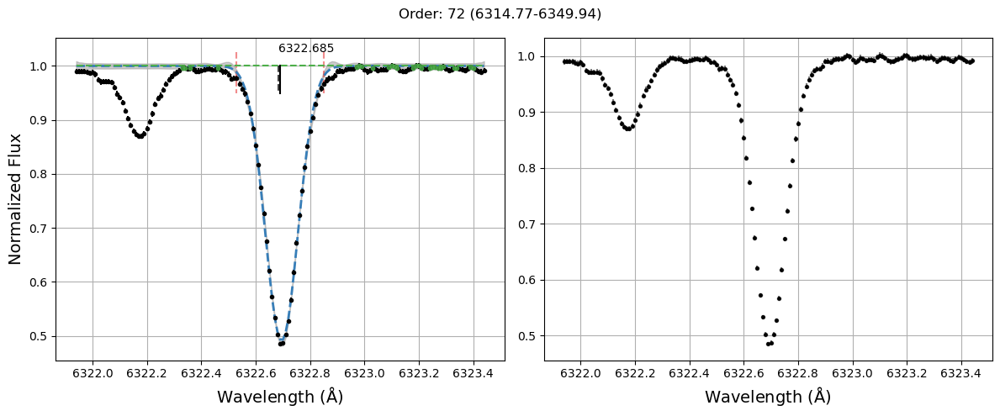

#-----------------------#
line to measure: Fe I 6380.743 - Line found: 6380.75
EW: 53.2 ± 0.3 simps-int: 53.19 ± 0.3


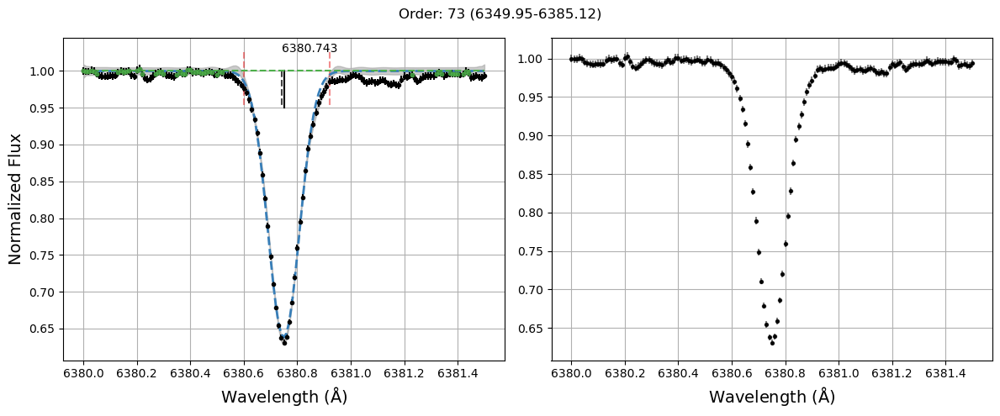

#-----------------------#
line to measure: Fe I 6392.538 - Line found: 6392.540000000001
EW: 18.36 ± 0.27 simps-int: 18.36 ± 0.27


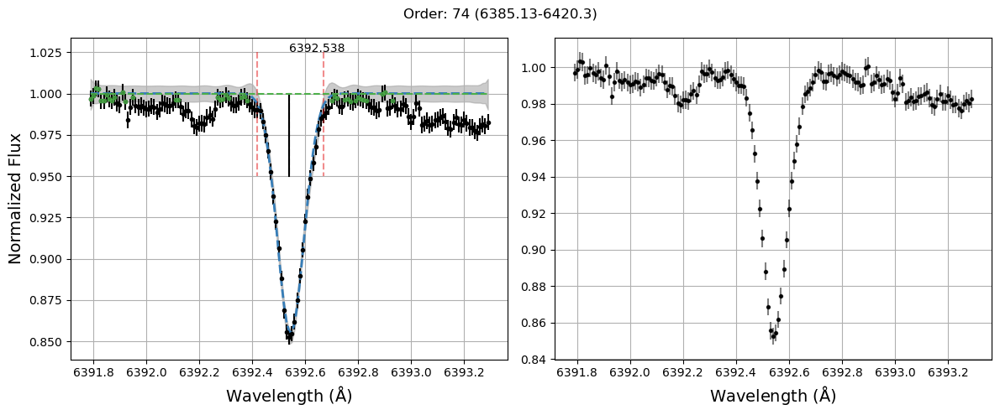

#-----------------------#
line to measure: Fe I 6597.557 - Line found: 6597.56
EW: 44.76 ± 0.31 simps-int: 44.76 ± 0.31


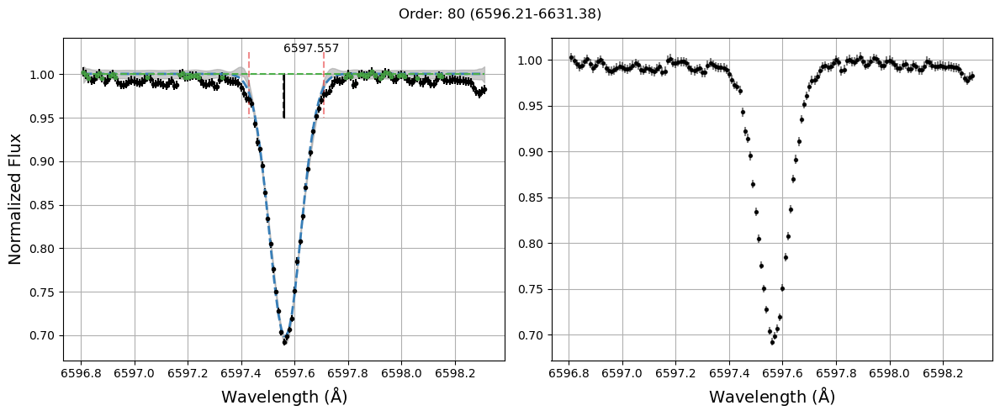

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6608.024 - Line found: 6608.040000000001
EW: 18.14 ± 0.27 simps-int: 18.14 ± 0.27


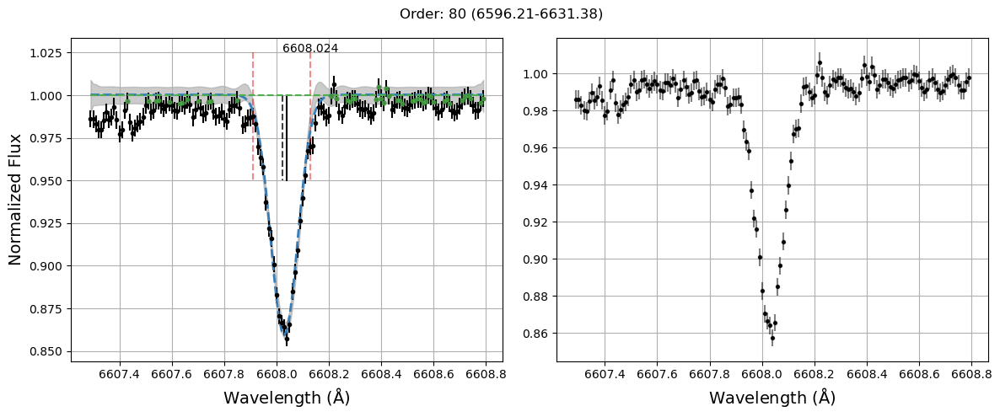

#-----------------------#
line to measure: Fe I 6609.11 - Line found: 6609.120000000001
EW: 67.04 ± 0.29 simps-int: 67.03 ± 0.29


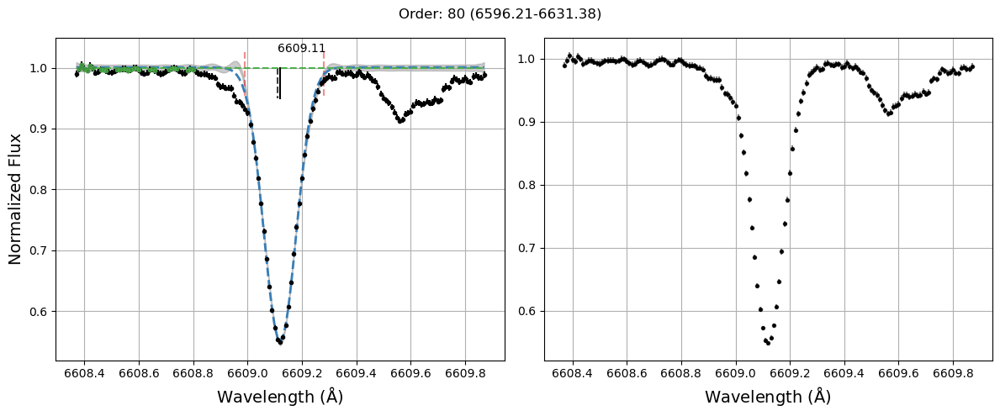

#-----------------------#
line to measure: Fe I 6627.54 - Line found: 6627.55
EW: 29.81 ± 0.31 simps-int: 29.8 ± 0.3


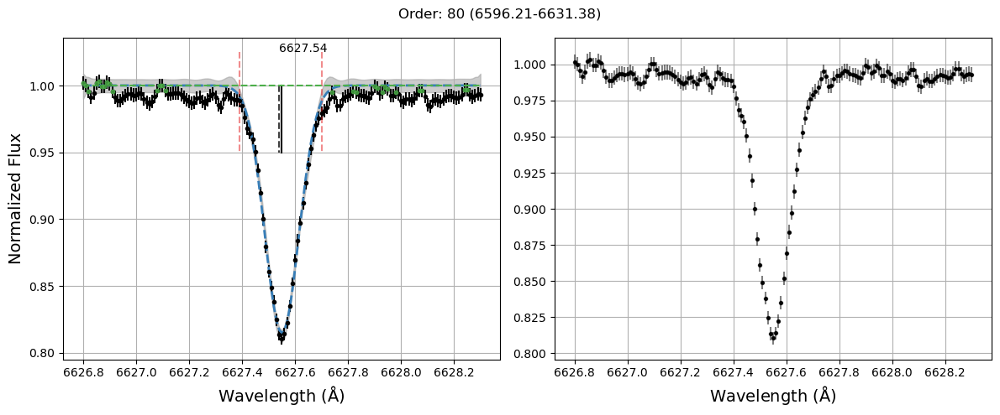

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6653.85 - Line found: 6653.860000000001
EW: 11.67 ± 0.31 simps-int: 11.67 ± 0.31


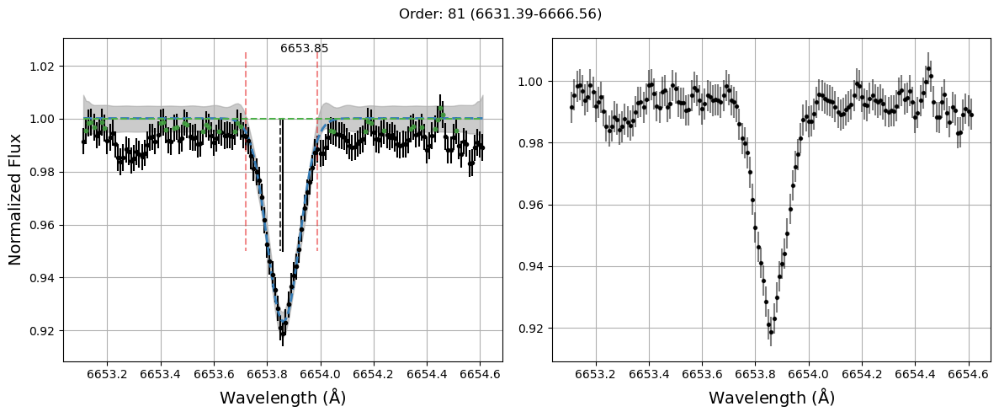

#-----------------------#
line to measure: Fe I 6703.567 - Line found: 6703.57
EW: 38.85 ± 0.31 simps-int: 38.85 ± 0.31


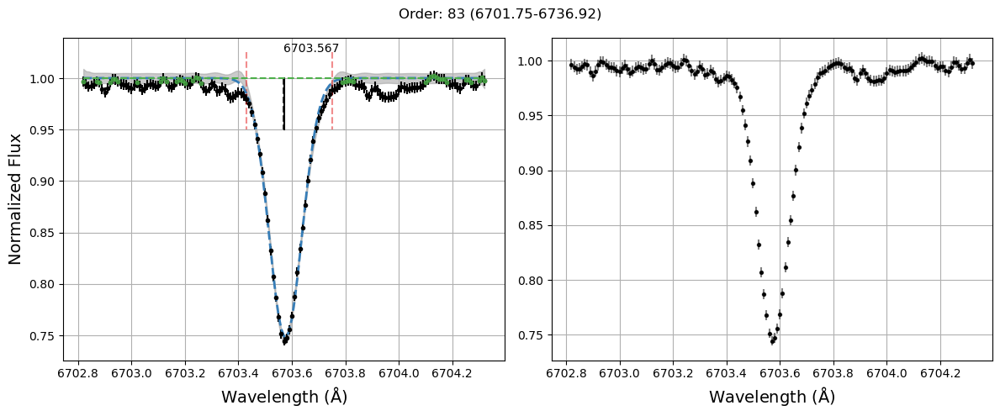

#-----------------------#
line to measure: Fe I 6710.316 - Line found: 6710.32
EW: 17.31 ± 0.3 simps-int: 17.31 ± 0.3


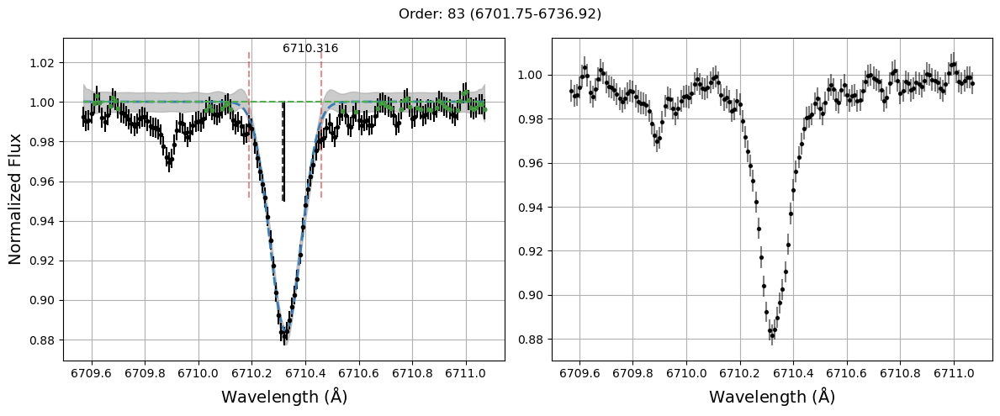

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6713.745 - Line found: 6713.75
EW: 22.36 ± 0.31 simps-int: 22.36 ± 0.31


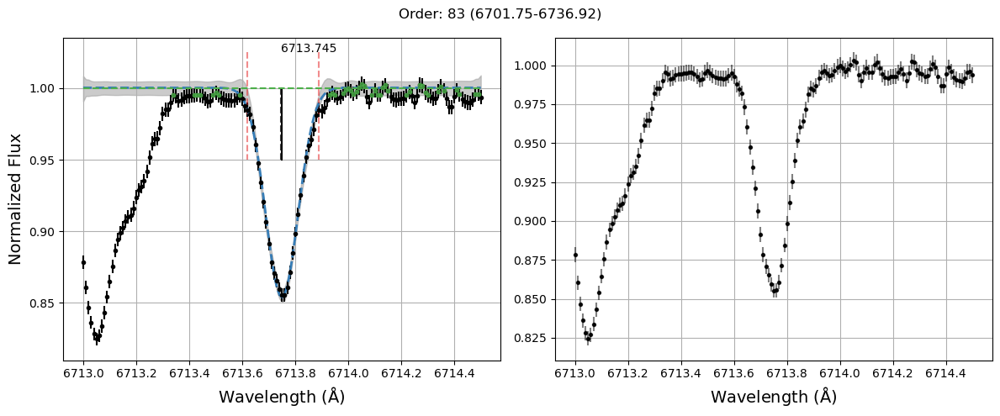

#-----------------------#
line to measure: Fe I 6716.222 - Line found: 6716.23
EW: 15.92 ± 0.3 simps-int: 15.91 ± 0.3


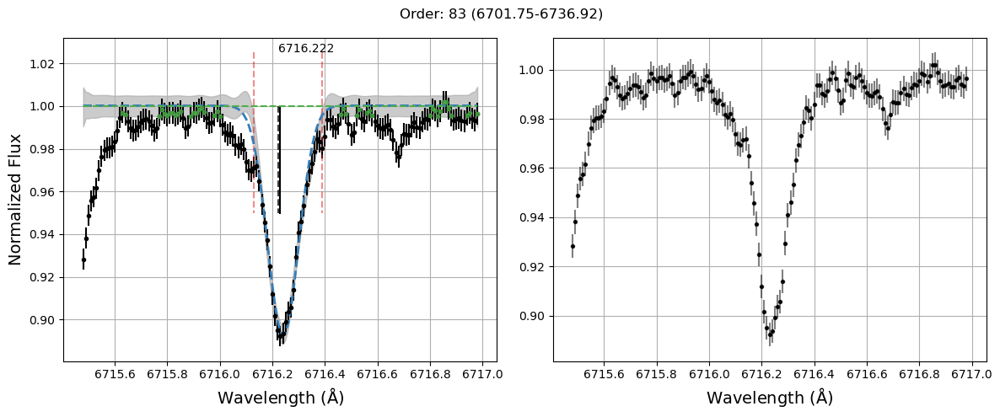

#-----------------------#
line to measure: Fe I 6725.353 - Line found: 6725.360000000001
EW: 18.43 ± 0.31 simps-int: 18.43 ± 0.31


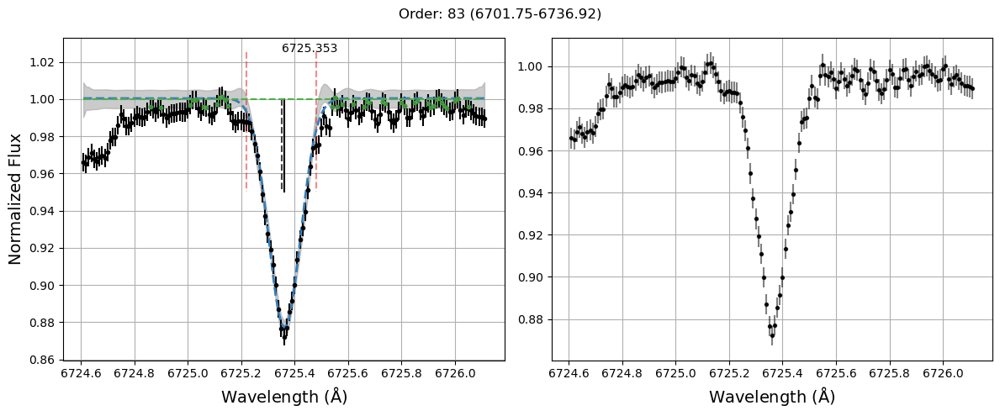

#-----------------------#
line to measure: Fe I 6726.666 - Line found: 6726.67
EW: 47.97 ± 0.31 simps-int: 47.97 ± 0.31


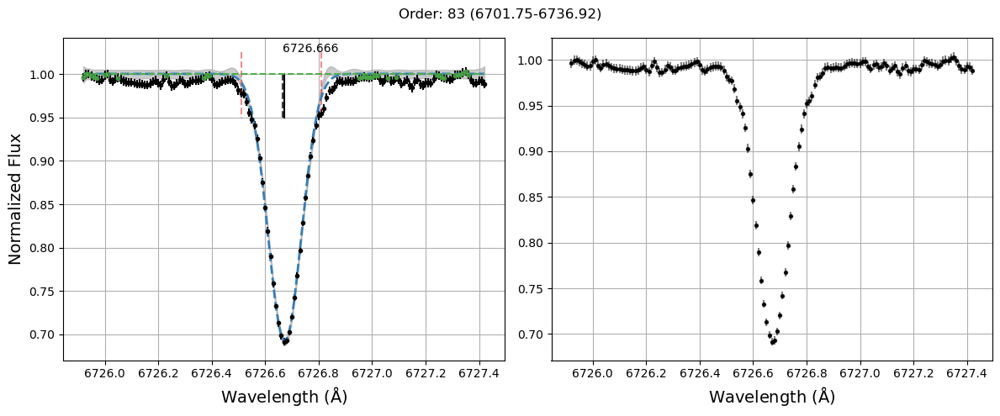

#-----------------------#
line to measure: Fe I 6733.151 - Line found: 6733.15
EW: 27.95 ± 0.32 simps-int: 27.95 ± 0.32


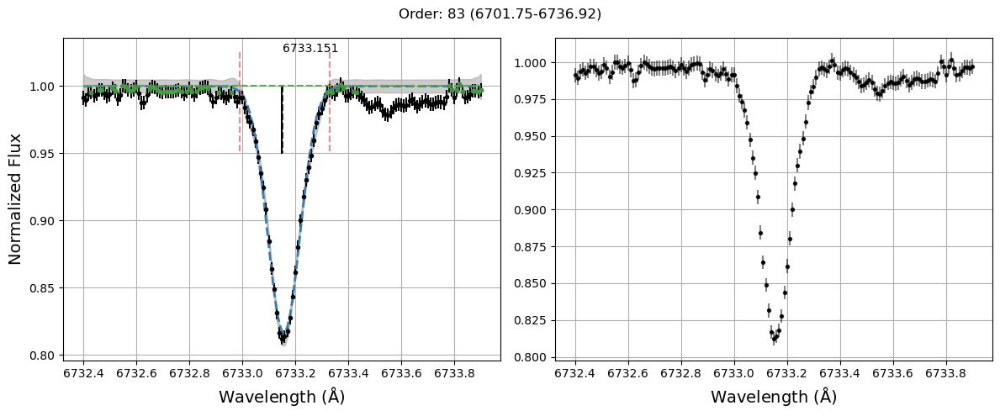

#-----------------------#
line to measure: Fe I 6739.52 - Line found: 6739.540000000001
EW: 13.18 ± 0.31 simps-int: 13.18 ± 0.31


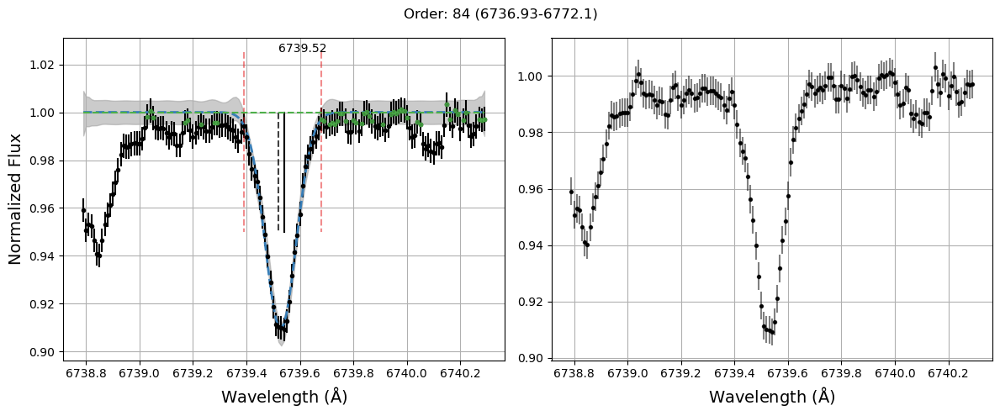

#-----------------------#
line to measure: Fe I 6745.09 - Line found: 6745.1
EW: 8.38 ± 0.27 simps-int: 8.38 ± 0.27


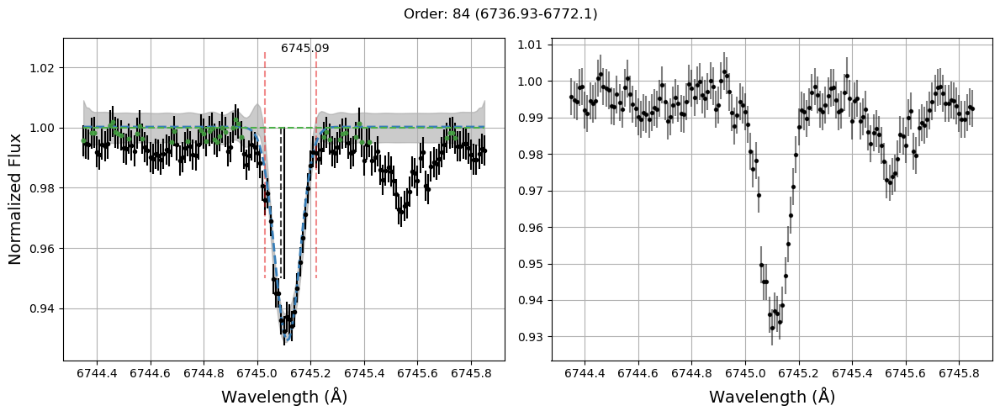

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6745.957 - Line found: 6745.9400000000005
EW: 7.38 ± 0.31 simps-int: 7.38 ± 0.31


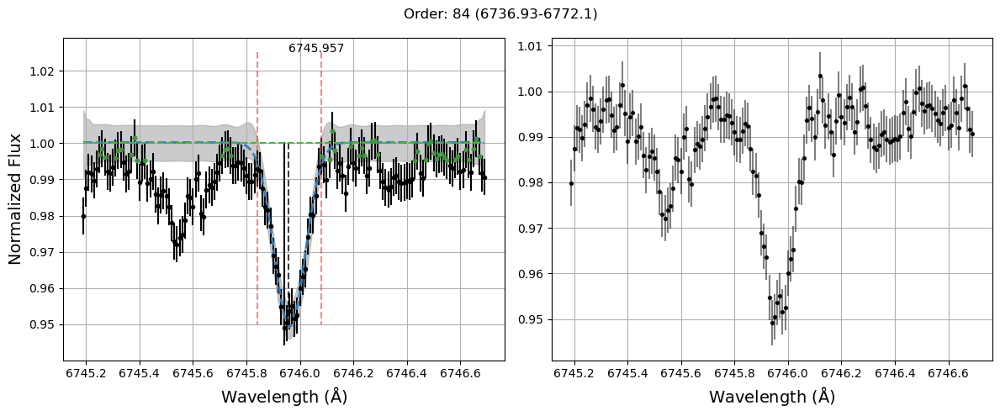

#-----------------------#
line to measure: Fe I 6750.15 - Line found: 6750.16
EW: 75.41 ± 0.3 simps-int: 75.4 ± 0.3


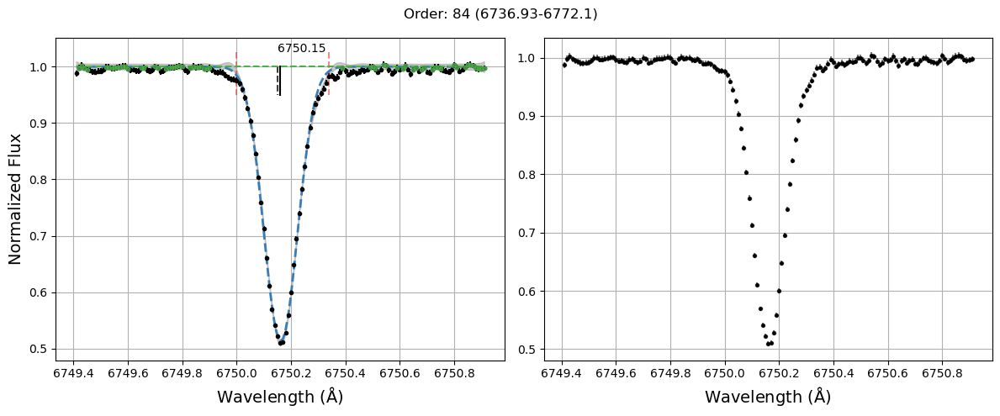

#-----------------------#
line to measure: Fe I 6752.716 - Line found: 6752.71
EW: 37.48 ± 0.31 simps-int: 37.48 ± 0.31


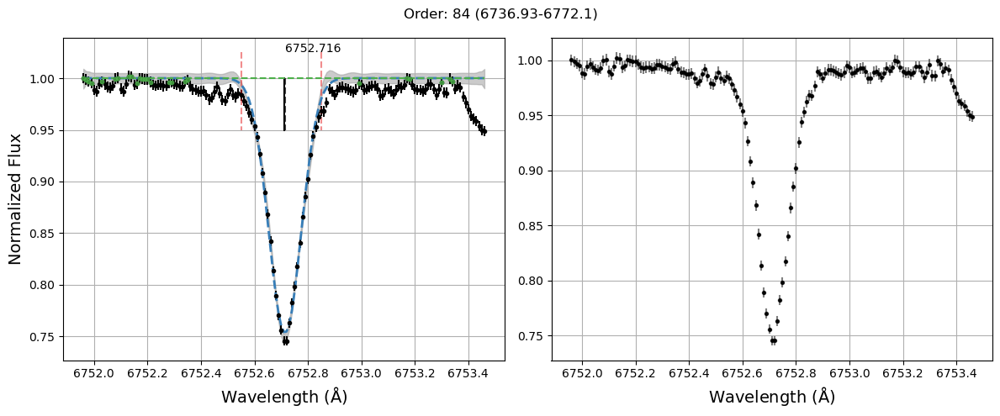

#-----------------------#


In [44]:
plot_lines = Test.lines
# ex_params = {6098.245:[0,6097.9,6098.3,0],
#              6113.322:[0,0,6113.45,0],
#              6293.924:[0,6293.6,6294.2,0],
#              6716.222:[0,6716.02,6716.35,6716.15],
#              7449.335:[0,0,7449.4,0],
#              5546.991:[0.005,0,0,0],
#              5579.335:[0.01,5579.15,5579.4,0],
#              6078.999:[0,6078.75,6079.15,0],
#              6085.259:[-0.005,6084.95,6085.4,0],
#              6297.793:[-0.005,6297.4,6298.1,0],
#              6609.11:[0,6608.8,6609.25,0],
#              6084.111:[0,0,6084.3,0],
#              7711.723:[-0.005,0,0,0]}

#ex_params = {}

exclude_lines = np.array([]) #this line was too close to an edge and broke the code
                                     #We measure it individually below with a smaller window size and rerun the
                                     #code here and skip this line so it won't break again (this can also be fixed)
                                     #by changing to number of split orders or size of orders
Test.measure_all_ew(exclude_lines=exclude_lines, plot_lines = plot_lines)

In [45]:
Test.check_for_flags()

4788.757 might have a bad fit 0.003932127207762914
5543.936 might have a bad fit 0.0034470730102039012
5546.991 might have a bad fit 0.0045958316345500495
5646.684 might have a bad fit 0.03750622916643163
5667.518 might have a bad fit 0.003844607001649907
5934.655 might have a bad fit 0.004300667151118473
6078.999 might have a bad fit 0.0034144799927117
6173.336 might be too shallow 0.0
6297.793 might have a bad fit 0.0034282493025044776
6322.685 might have a bad fit 0.003277147313087972
6609.11 might have a bad fit 0.004681083116465234
4620.521 might have a bad fit 0.006314359237023736
5197.577 might have a bad fit 0.005131395760760552
5234.625 might have a bad fit 0.0038787051317994295


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:669: RuntimeWarning: invalid value encountered in double_scalars
  if self.lines_ew_err[i]/self.lines_ew[i] >= .1:


line to measure: Fe I 6173.336 - Line found: 6173.34
EW: 66.78 ± 0.33 simps-int: 66.77 ± 0.33


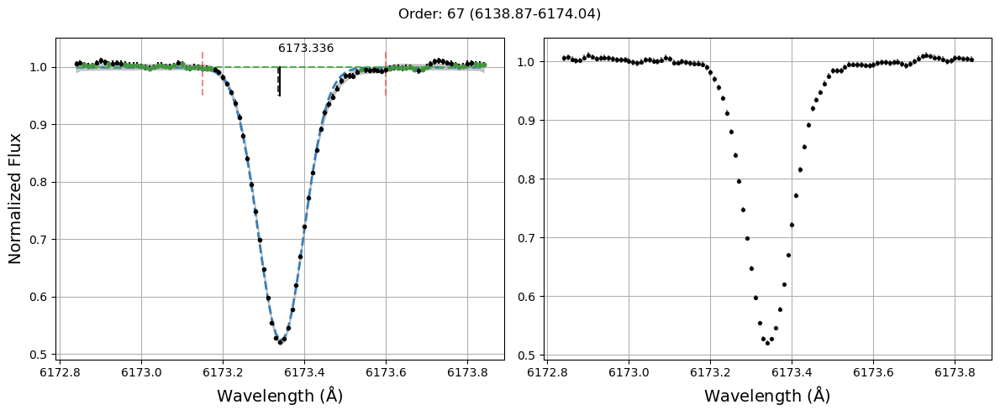

#-----------------------#
extra params: [0.008, 6173.15, 6173.6, 0]


In [46]:
Test.measure_line_ew(6173.336, ex_params=[0.008,6173.15,6173.6,0], window_size=1.0)

[54.18084328 54.59868747 53.80513491 53.82394513 54.52316972 54.22786697
 53.81514687 53.89350773 54.29351519 54.29592506 53.9006247  53.33677859
 54.08385123 53.75411639 53.68864847 53.52747654 53.82107995 53.45743858
 53.82533522 53.93057008 53.64402304 53.89222368 53.73626224 53.53942809
 54.19400876 53.69350594 54.46945425 53.7944798  53.70109953 54.01567609
 54.17102495 54.42291642 54.39746022 54.02642005 53.48351903 54.75929459
 53.44728371 53.76971745 54.04626388 53.55705799 53.92242978 53.72794809
 54.12226149 54.30207792 54.02112242 53.74184003 54.6392666  54.17213766
 54.19776248 53.86877636 54.28266837 54.43568663 53.59430072 54.09897381
 53.90355543 54.08949171 54.15522157 54.22748474 53.68715755 54.52396513
 53.4323938  54.21323542 53.88670765 53.96175166 53.62603946 53.78957727
 53.6658152  53.9524409  53.83244085 54.25778915 54.03814029 53.77506636
 54.14436228 54.17943791 53.93280335 53.3853395  54.01034947 54.25726061
 54.31960796 53.85672266 54.05085348 53.92024209 53

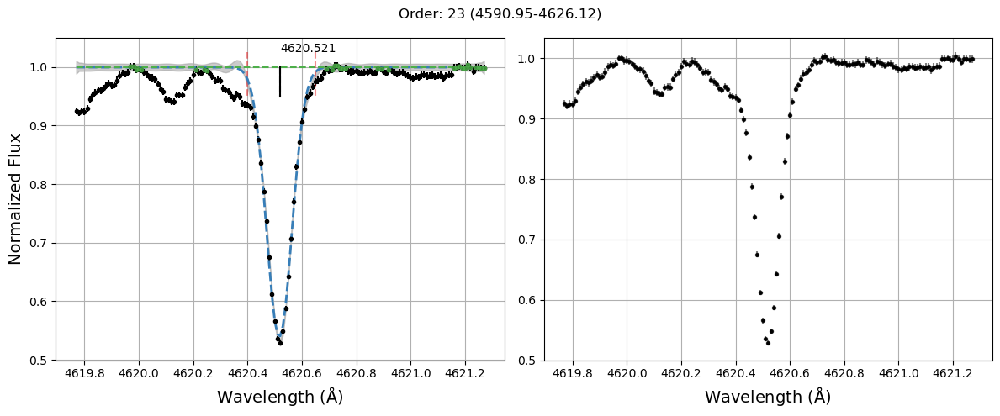

#-----------------------#


In [22]:
Test.measure_line_ew(4620.521)

In [23]:
for i in range(len(Test.lines)):
    print("{0:10} {1:6} {2:5}".format(Test.lines[i], np.round(Test.lines_ew[i],2), np.round(Test.lines_ew_err[i],2)))

  4779.439  41.72  0.25
  4788.757  67.21  0.24
  5054.643  39.79  0.24
  5379.574  61.97  0.23
  5522.447  44.56  0.24
  5543.936  63.44  0.26
    5546.5  52.59  0.25
  5546.991  27.58  0.25
  5560.207  52.72  0.25
   5577.03  11.84  0.24
  5579.335   7.18  0.19
  5587.574  35.55  0.25
  5646.684   7.75  0.23
  5651.469  19.27  0.26
  5652.318  27.64  0.26
  5661.346  23.45  0.25
  5667.518  53.13  0.29
  5677.684   7.49  0.25
  5679.023  59.79  0.26
   5680.24  11.19  0.24
  5731.762  58.33  0.25
  5732.275  14.56  0.23
  5741.846  32.76  0.25
  5752.032  55.21  0.29
  5775.081  60.07  0.25
   5778.45   22.9  0.25
  5809.218  51.04  0.27
  5934.655  76.51  0.28
  6078.999  46.04  0.26
  6085.259   44.4  0.28
  6098.245  17.66  0.29
  6151.617  51.01  0.27
  6159.368  12.92  0.27
   6165.36  45.75  0.29
  6173.336  69.33   0.3
  6187.987  48.37  0.28
  6220.776  20.29  0.31
   6226.73  30.03  0.29
  6229.228  39.06  0.29
  6240.645  49.77  0.27
  6293.924   13.9  0.27
  6297.793  74.6

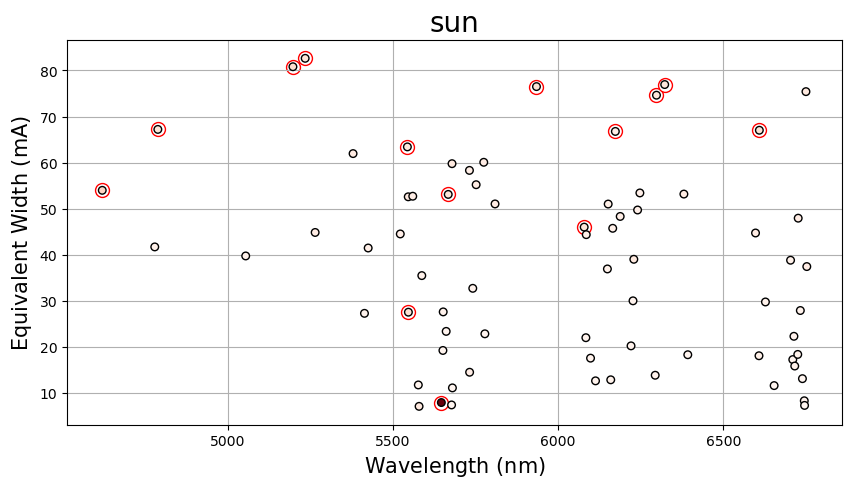

In [47]:
plot_line_info(Test, "sun")

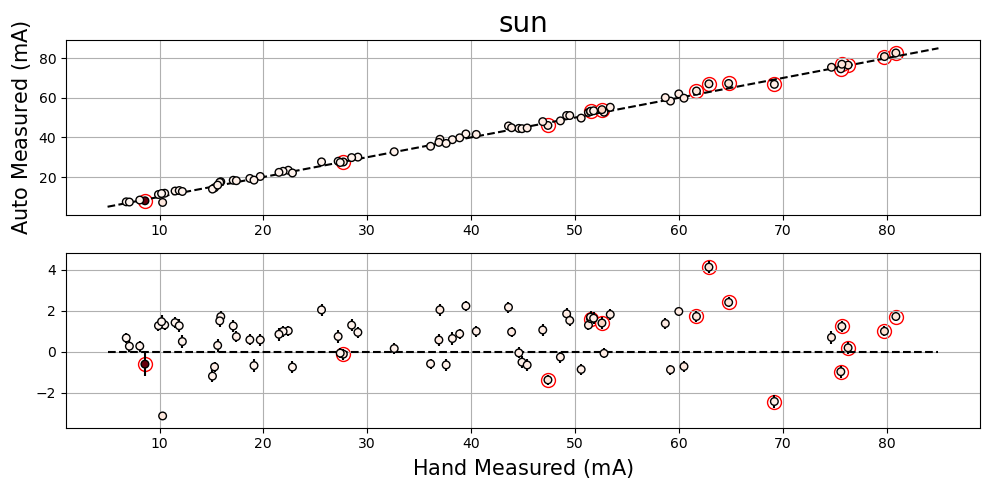

In [48]:
plot_comparison_res(Test, ews, 'sun', xy = [5,85])

In [86]:
Test.make_ew_doc('HARPS_fe_ew.txt', doc_title='Sun, XSpect Test, Jan 7 2022')

array([], dtype=float64)

In [49]:
linelist_path = Path('../Line_list_sample/HARPS_ele_sample.txt')
lines = np.genfromtxt(linelist_path, skip_header = 1, usecols = 0)
elmnt = np.genfromtxt(linelist_path, skip_header = 1, usecols = 1)
EP = np.genfromtxt(linelist_path, skip_header = 1, usecols = 2)
OS = np.genfromtxt(linelist_path, skip_header = 1, usecols = 3)
ex = np.genfromtxt(linelist_path, skip_header = 1, usecols = 4)
ews = np.genfromtxt(linelist_path, skip_header = 1, usecols = 5)

#Load lines into class
Test.load_lines(linelist_path)

line to measure: S I 4694.113 - Line found: 4694.110000000001
EW: 9.75 ± 0.26 simps-int: 9.75 ± 0.26


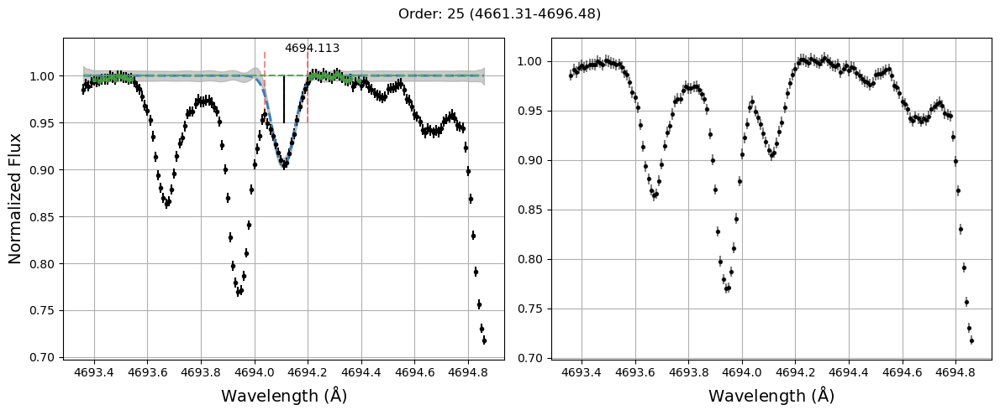

#-----------------------#
line to measure: S I 4695.443 - Line found: 4695.45
EW: 5.55 ± 0.26 simps-int: 5.55 ± 0.26


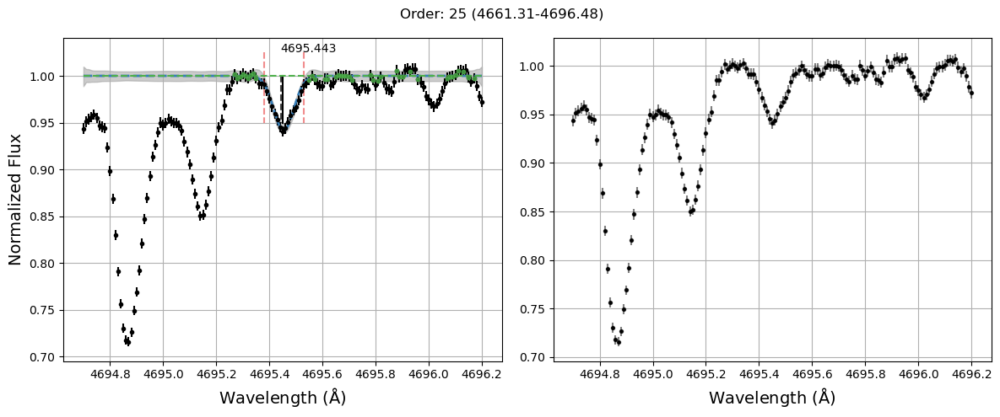

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Mg I 4730.029 - Line found: 4730.030000000001
EW: 67.4 ± 0.29 simps-int: 67.4 ± 0.29


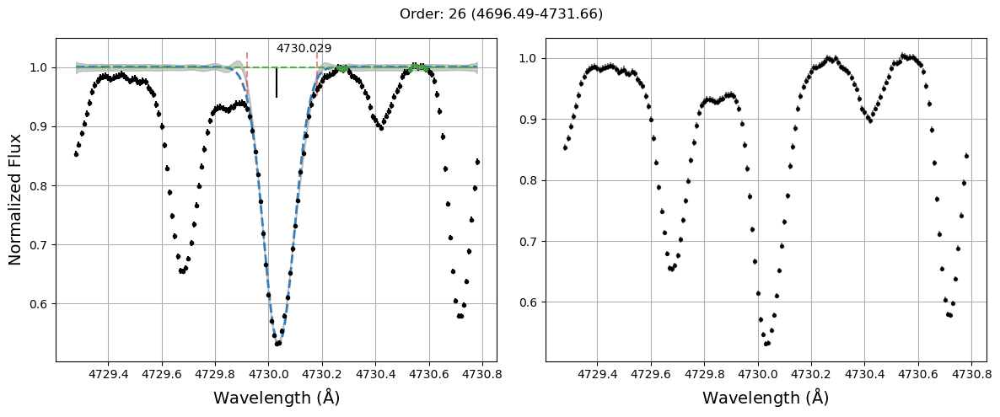

#-----------------------#
line to measure: Zn I 4722.153 - Line found: 4722.16
EW: 69.53 ± 0.29 simps-int: 69.52 ± 0.29


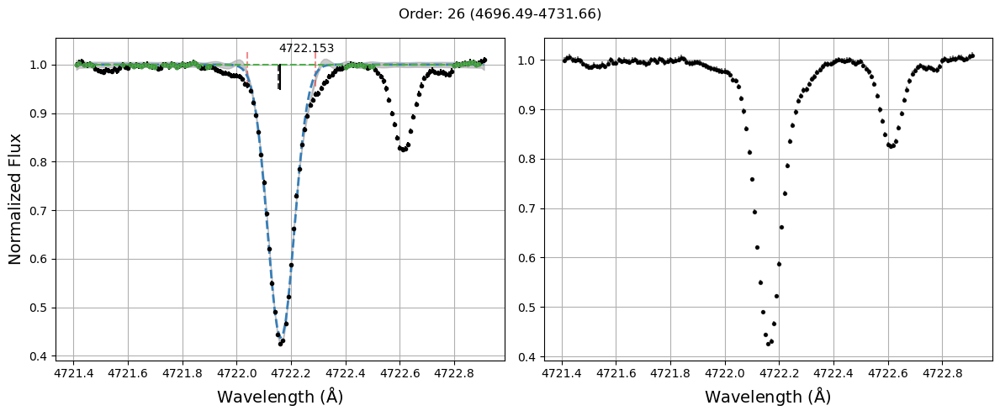

#-----------------------#
line to measure: Ti II 4779.985 - Line found: 4779.9800000000005
EW: 65.77 ± 0.26 simps-int: 65.76 ± 0.26


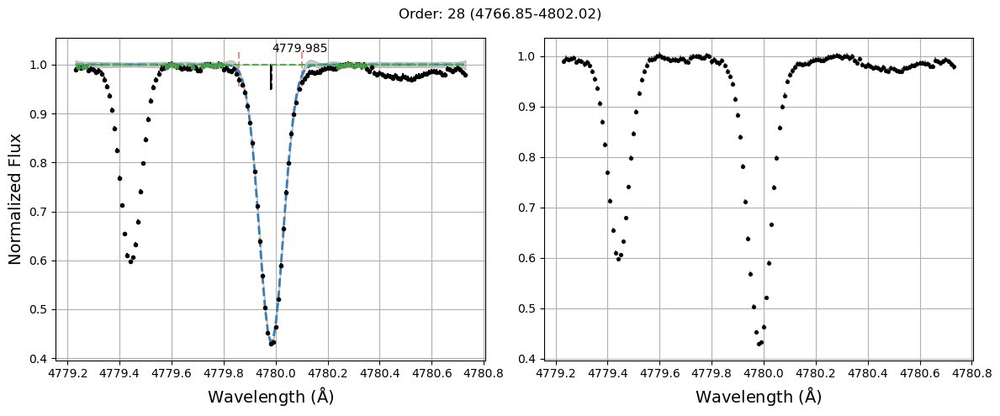

#-----------------------#
line to measure: Ti I 5039.957 - Line found: 5039.96
EW: 75.89 ± 0.23 simps-int: 75.88 ± 0.23


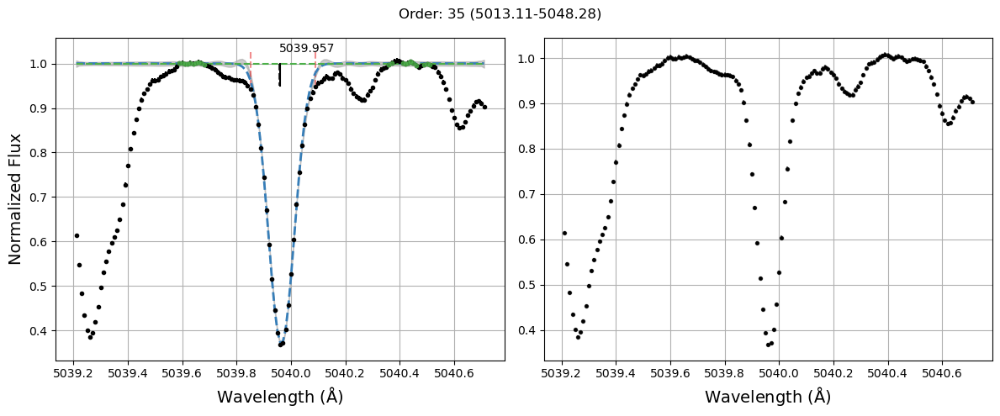

#-----------------------#
line to measure: Ti I 5024.844 - Line found: 5024.85
EW: 71.89 ± 0.22 simps-int: 71.89 ± 0.22


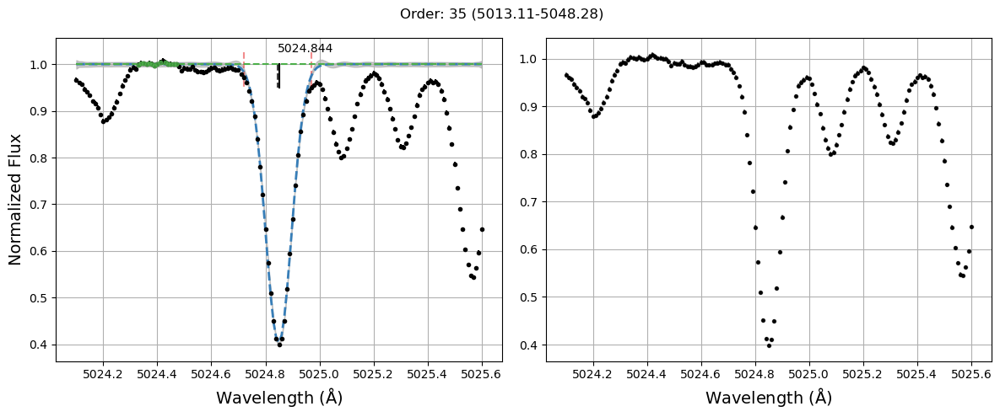

#-----------------------#
line to measure: Ti I 5022.868 - Line found: 5022.87
EW: 71.68 ± 0.22 simps-int: 71.68 ± 0.22


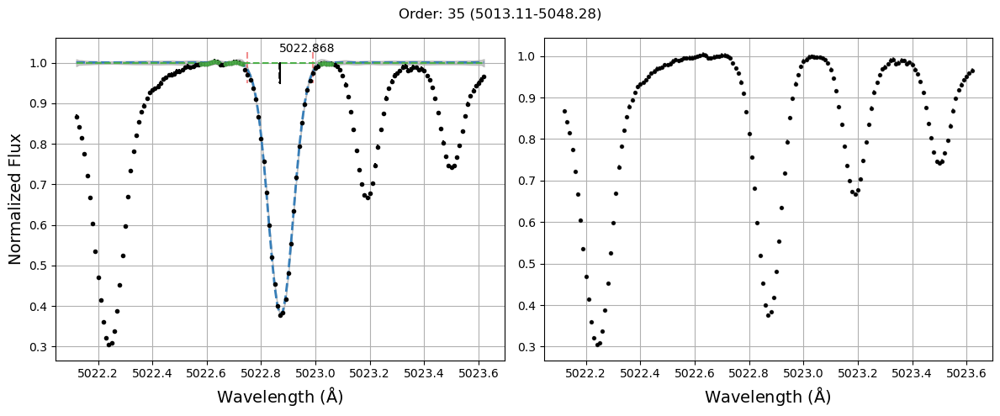

#-----------------------#
line to measure: C I 5052.167 - Line found: 5052.16
EW: 24.92 ± 0.25 simps-int: 24.92 ± 0.25


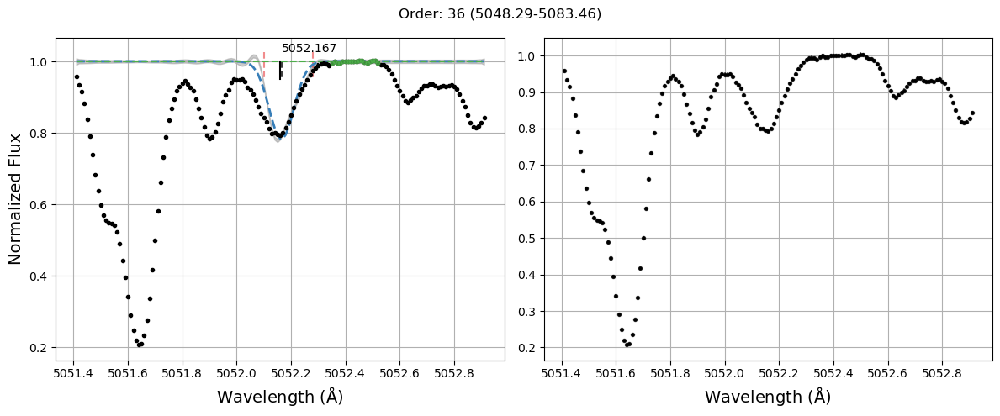

#-----------------------#
line to measure: Ti I 5064.653 - Line found: 5064.66
EW: 87.66 ± 0.23 simps-int: 87.66 ± 0.23


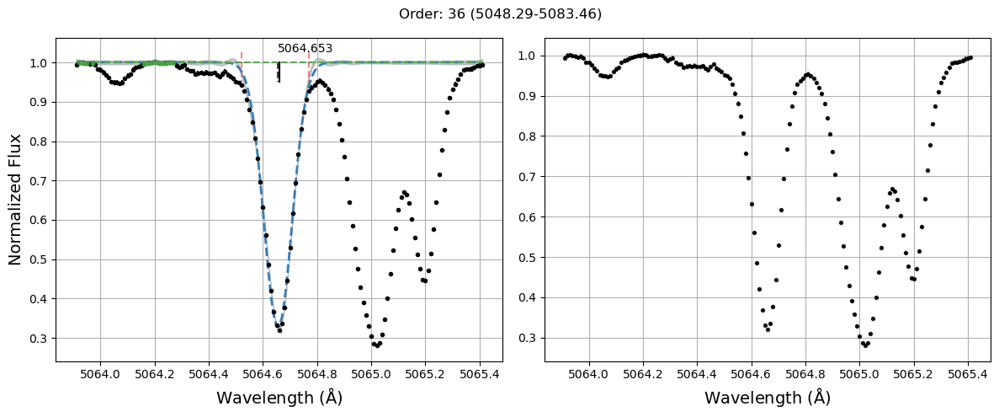

#-----------------------#
line to measure: Ti II 5154.068 - Line found: 5154.07
EW: 106.59 ± 0.78 simps-int: -106.58 ± 0.78


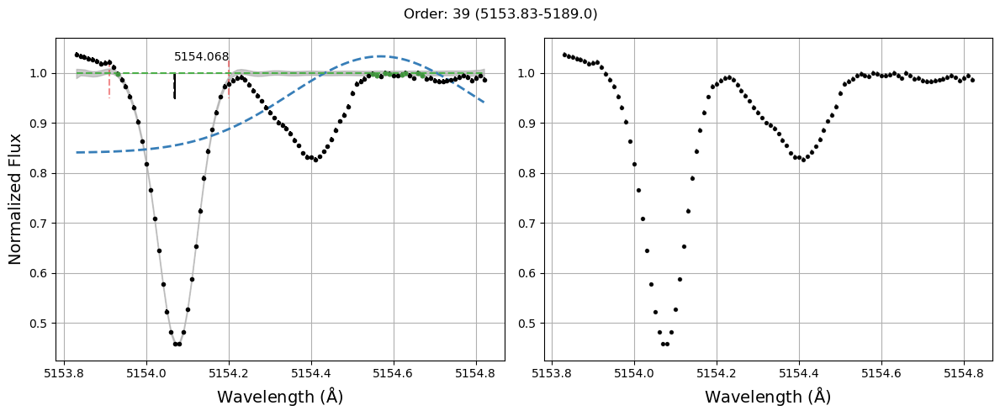

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ti I 5210.385 - Line found: 5210.39
EW: 89.29 ± 0.24 simps-int: 89.28 ± 0.24


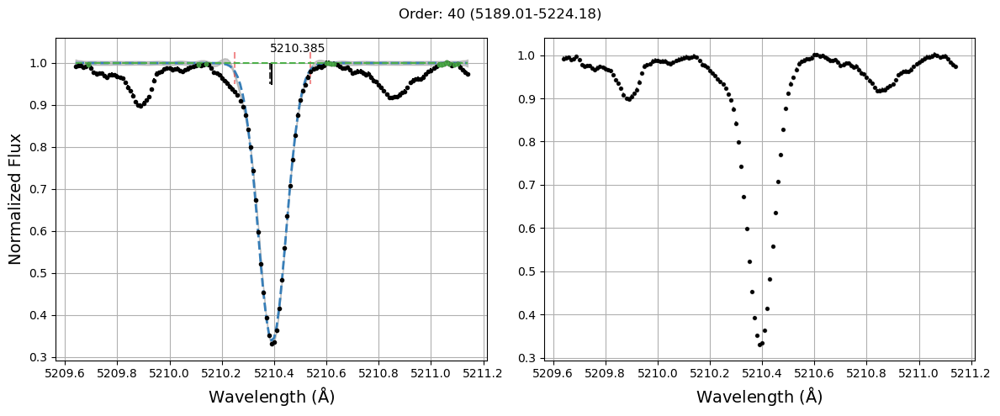

#-----------------------#
line to measure: Co I 5301.039 - Line found: 5301.04
EW: 20.44 ± 0.23 simps-int: 20.43 ± 0.23


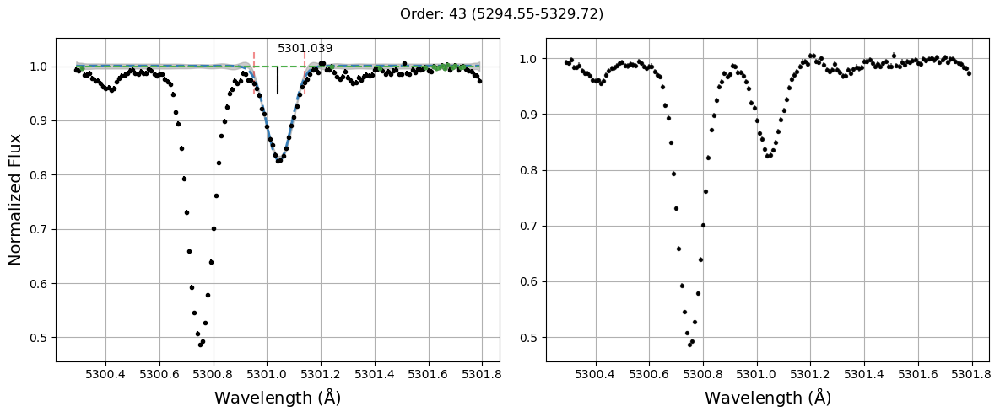

#-----------------------#
line to measure: C I 5380.337 - Line found: 5380.32
EW: 12.51 ± 0.19 simps-int: 12.51 ± 0.19


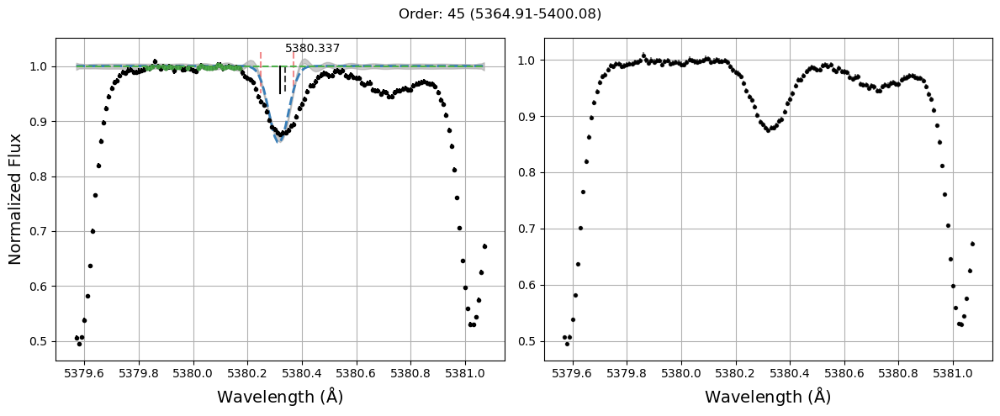

#-----------------------#
line to measure: Ti II 5381.021 - Line found: 5381.030000000001
EW: 60.45 ± 0.26 simps-int: 60.45 ± 0.26


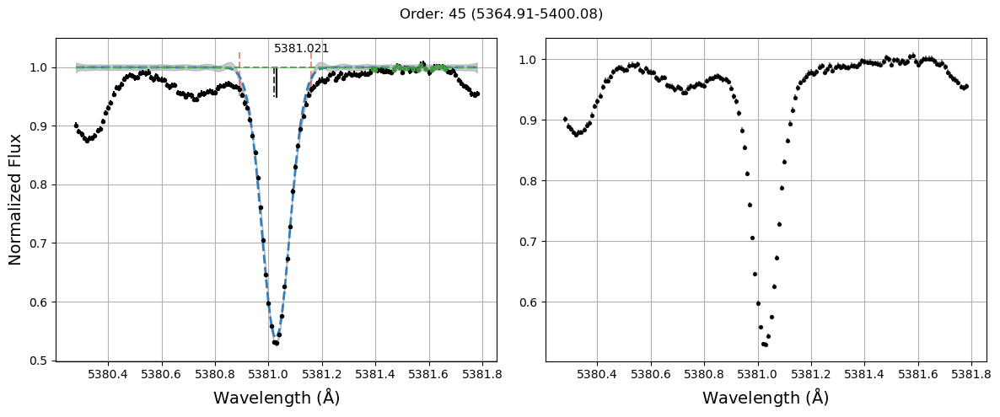

#-----------------------#
SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:529: RuntimeWarning: Mean of empty slice.
  best_bf = np.array([a_values[np.w

line to measure: Mn I 5399.499 - Line found: 5399.4800000000005
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


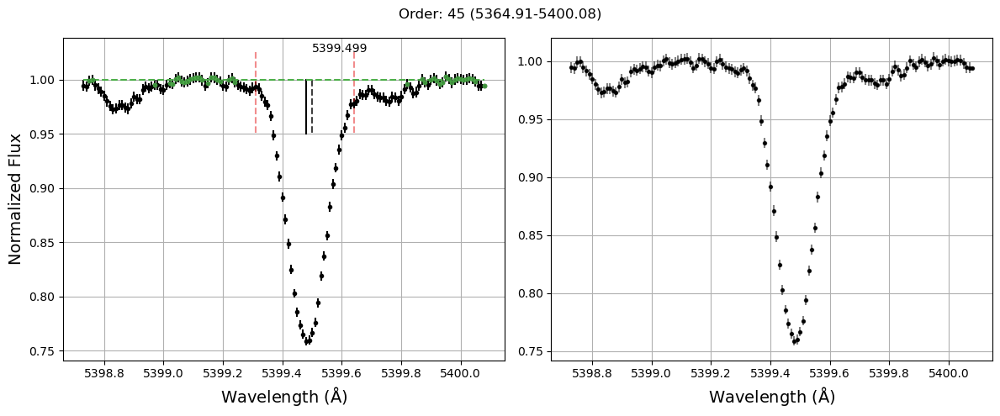

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Mn I 5432.546 - Line found: 5432.55
EW: 51.92 ± 0.27 simps-int: 51.91 ± 0.27


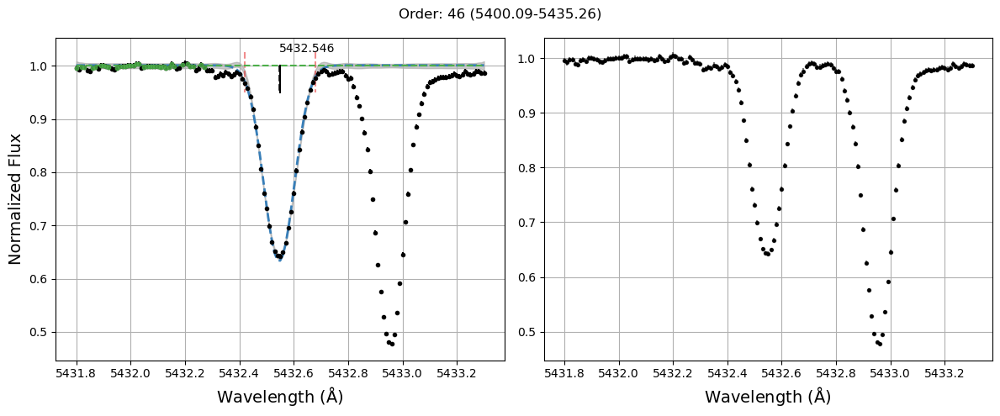

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Co I 5647.234 - Line found: 5647.2300000000005
EW: 15.48 ± 0.26 simps-int: 15.48 ± 0.26


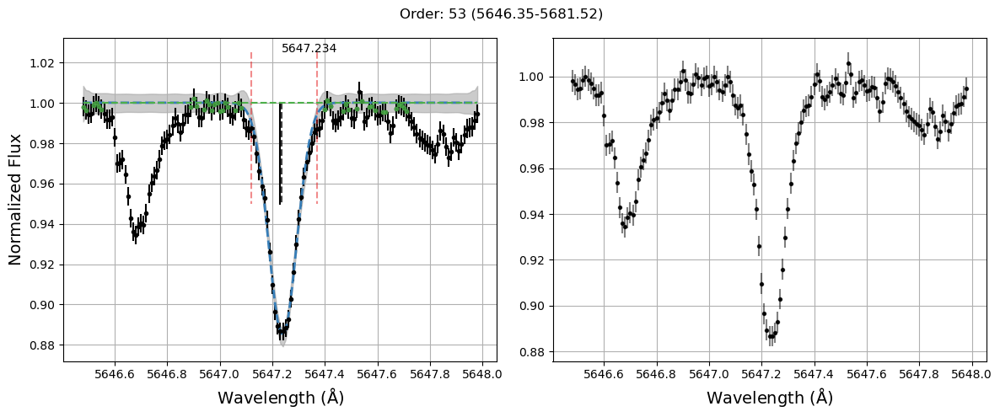

#-----------------------#
line to measure: Na I 5682.633 - Line found: 5682.650000000001
EW: 101.91 ± 0.29 simps-int: 101.9 ± 0.29


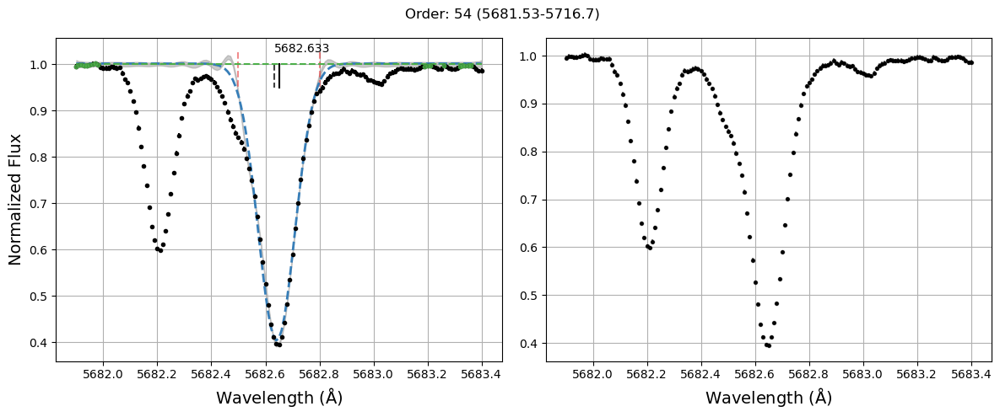

#-----------------------#
line to measure: Mg I 5711.088 - Line found: 5711.1
EW: 105.21 ± 0.28 simps-int: 105.2 ± 0.28


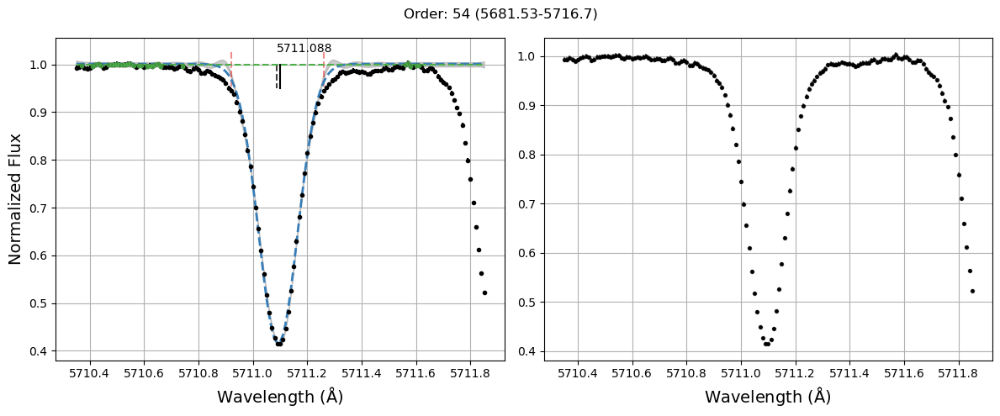

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Si I 5701.104 - Line found: 5701.1
EW: 38.68 ± 0.26 simps-int: 38.67 ± 0.26


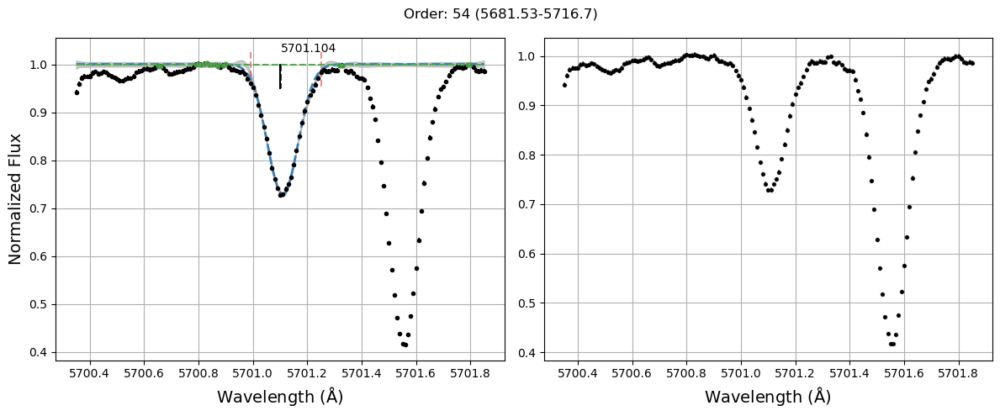

#-----------------------#
line to measure: Si I 5690.425 - Line found: 5690.43
EW: 51.05 ± 0.27 simps-int: 51.05 ± 0.27


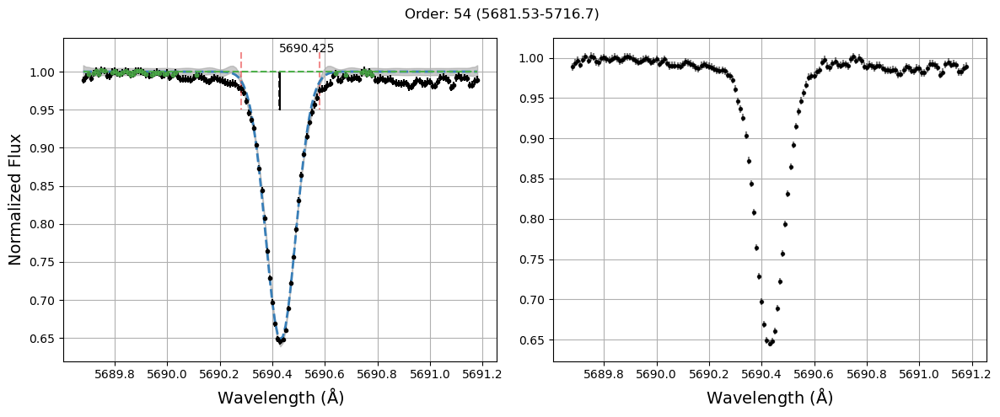

#-----------------------#
line to measure: Si I 5708.4 - Line found: 5708.400000000001
EW: 76.35 ± 0.29 simps-int: 76.35 ± 0.29


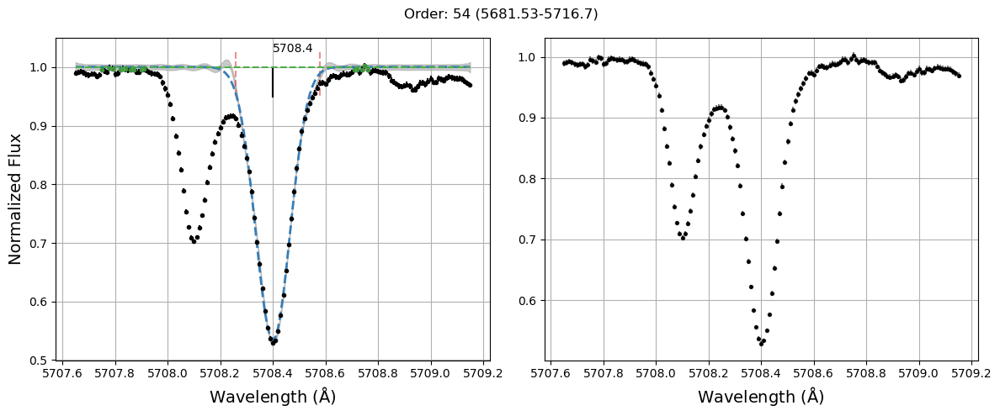

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Cr I 5702.306 - Line found: 5702.32
EW: 25.04 ± 0.27 simps-int: 25.04 ± 0.27


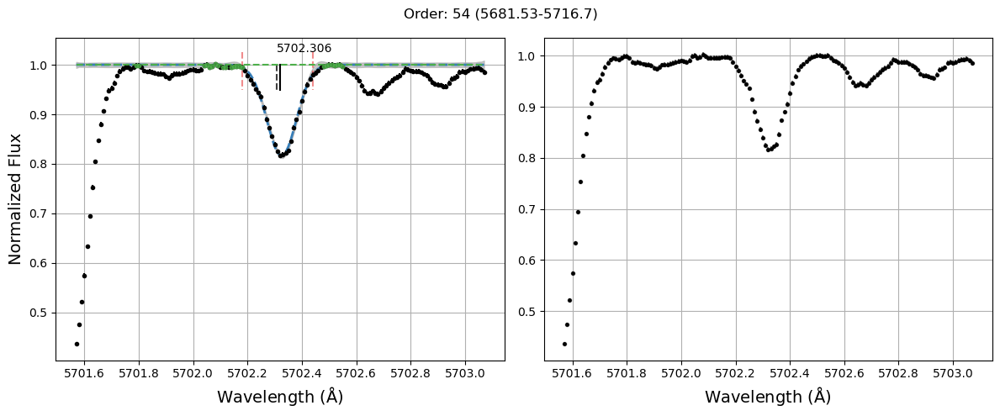

#-----------------------#
line to measure: Ti I 5739.469 - Line found: 5739.4800000000005
EW: 8.12 ± 0.22 simps-int: 8.12 ± 0.22


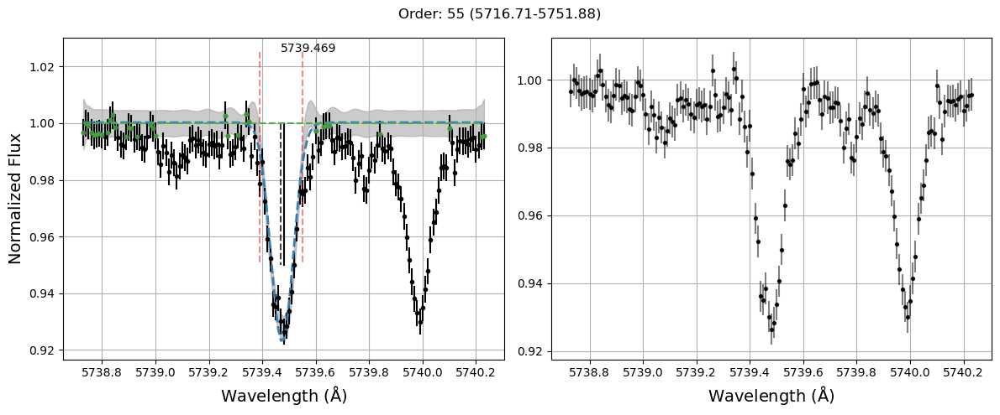

#-----------------------#
line to measure: V I 5737.059 - Line found: 5737.07
EW: 11.54 ± 0.27 simps-int: 11.54 ± 0.27


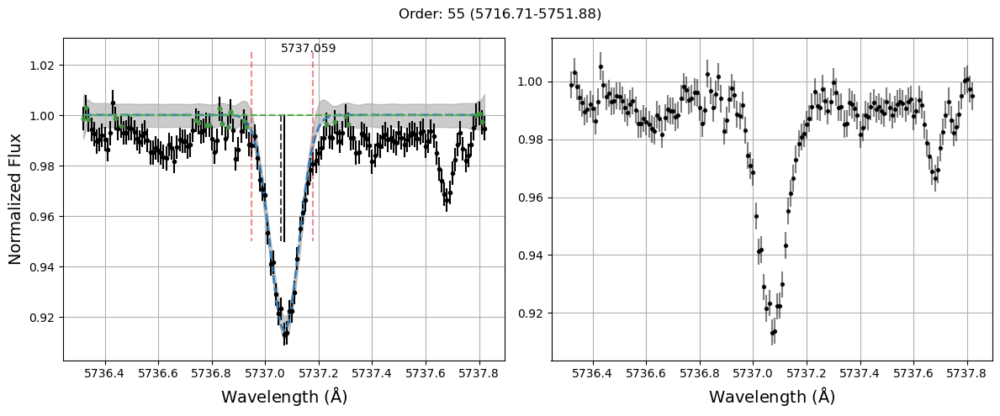

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: V I 5727.048 - Line found: 5727.05
EW: 39.98 ± 0.26 simps-int: 39.98 ± 0.26


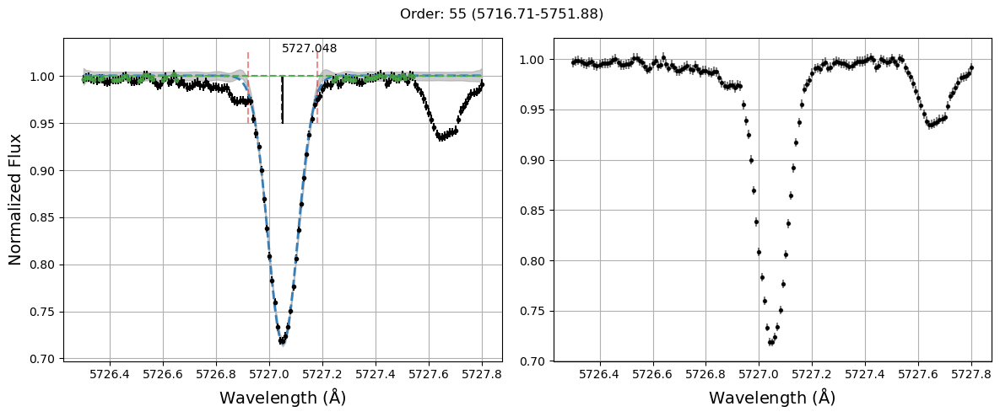

#-----------------------#
line to measure: Ni I 5748.346 - Line found: 5748.360000000001
EW: 28.46 ± 0.25 simps-int: 28.46 ± 0.25


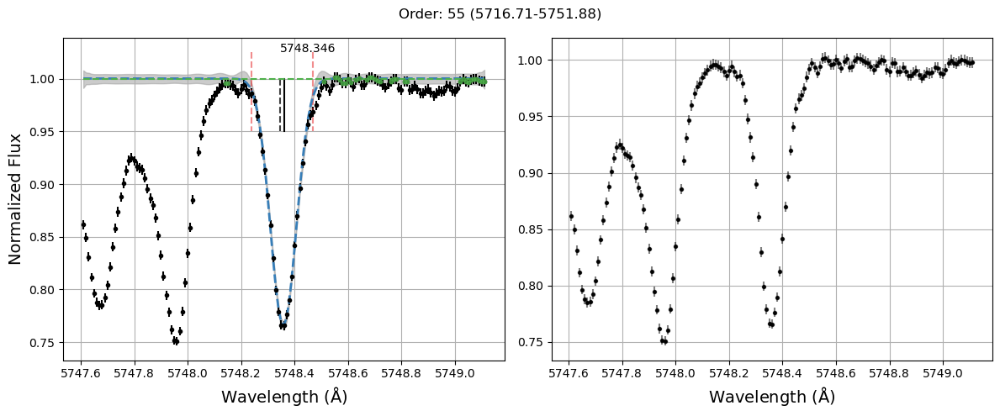

#-----------------------#
line to measure: Si I 5772.149 - Line found: 5772.150000000001
EW: 53.24 ± 0.29 simps-int: 53.23 ± 0.29


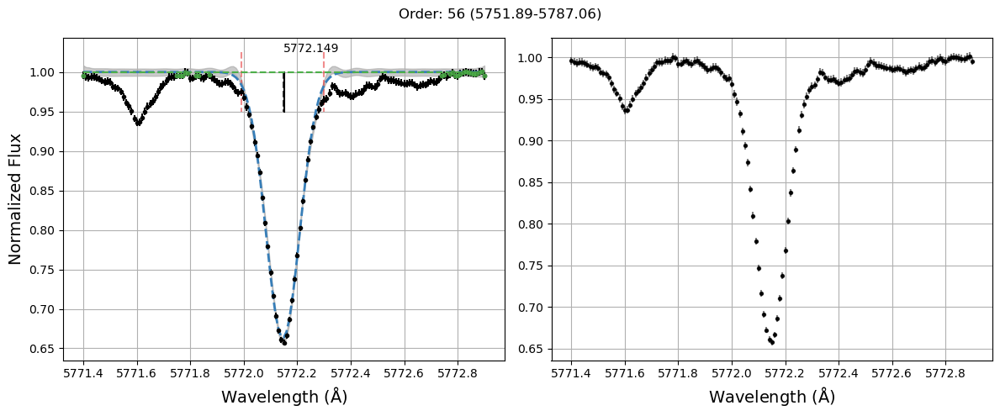

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Cr I 5783.85 - Line found: 5783.87
EW: 44.72 ± 0.27 simps-int: 44.71 ± 0.27


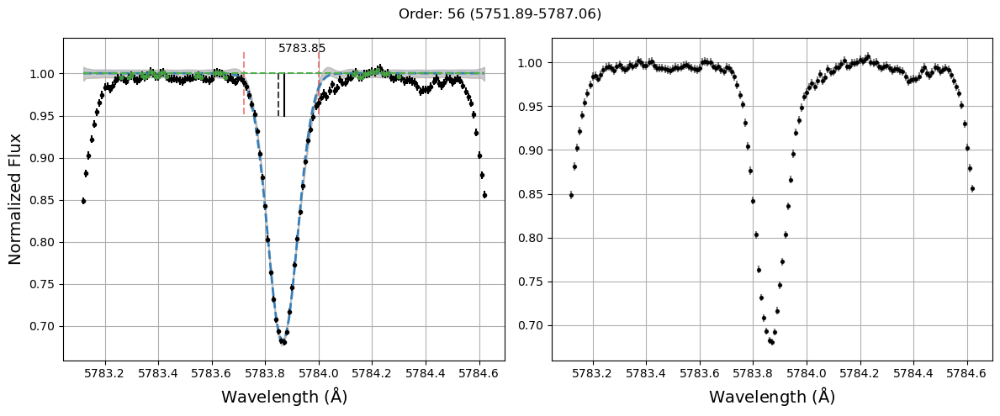

#-----------------------#
line to measure: Cr I 5783.063 - Line found: 5783.07
EW: 32.23 ± 0.27 simps-int: 32.22 ± 0.27


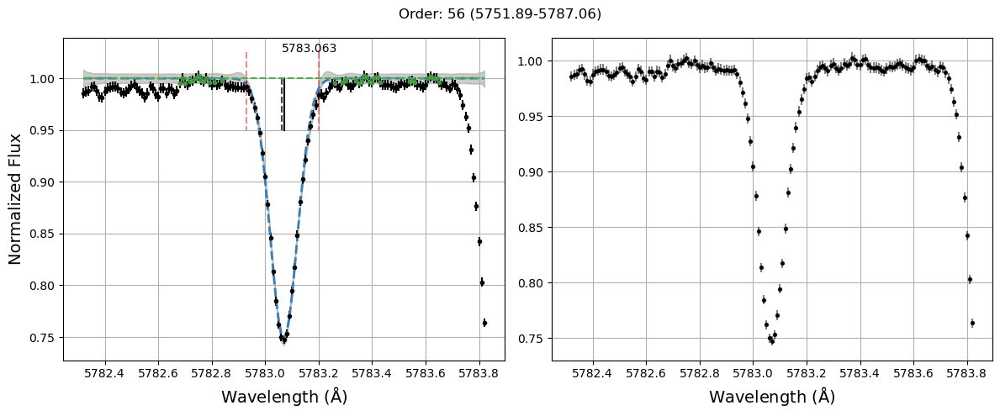

#-----------------------#
line to measure: Ni I 5754.655 - Line found: 5754.66
EW: 77.08 ± 0.27 simps-int: 77.07 ± 0.27


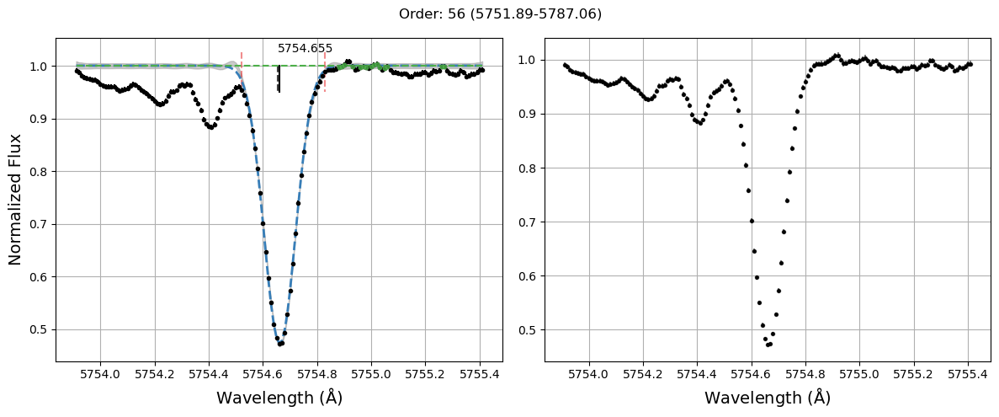

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 5760.828 - Line found: 5760.84
EW: 35.75 ± 0.25 simps-int: 35.75 ± 0.25


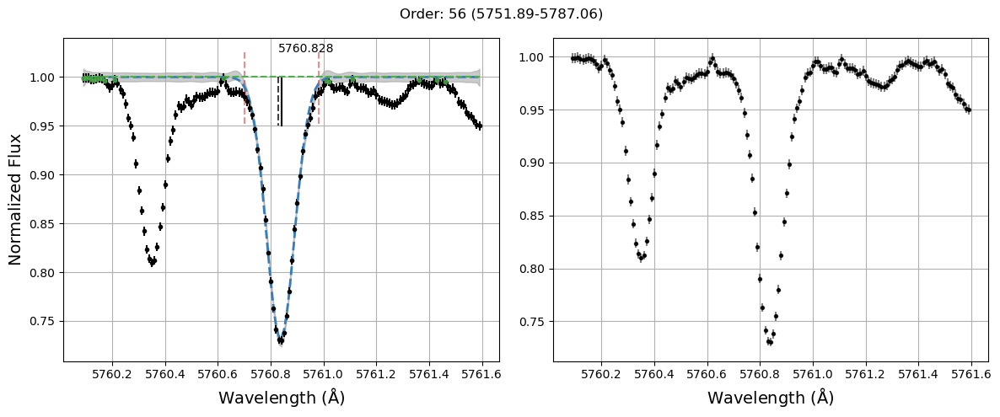

#-----------------------#
line to measure: Cu I 5782.127 - Line found: 5782.14
EW: 80.21 ± 0.29 simps-int: 80.2 ± 0.29


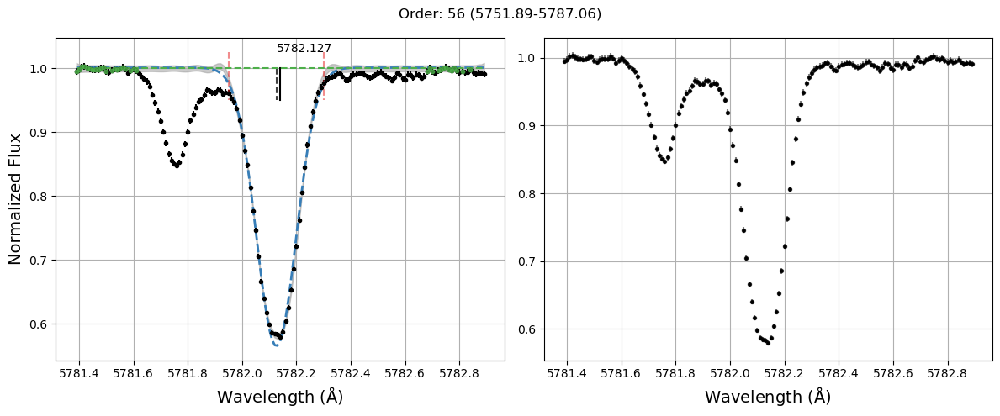

#-----------------------#
line to measure: Cr I 5787.918 - Line found: 5787.92
EW: 46.63 ± 0.26 simps-int: 46.63 ± 0.26


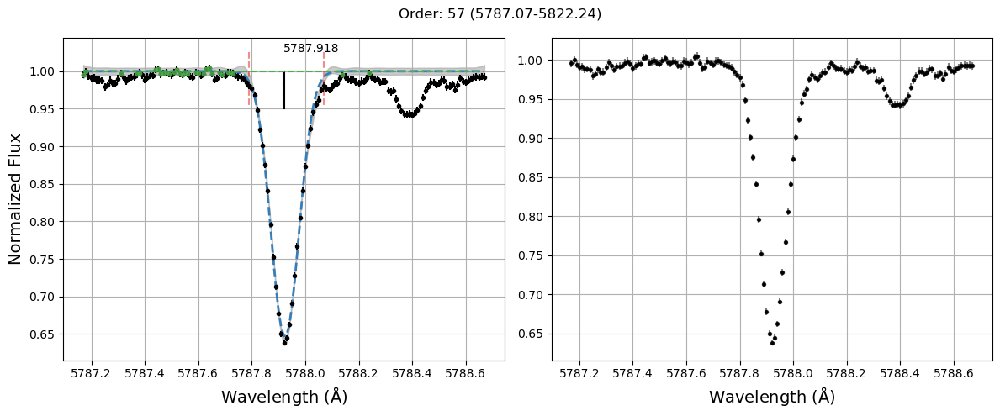

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 5805.213 - Line found: 5805.2300000000005
EW: 42.05 ± 0.93 simps-int: 41.96 ± 2.91


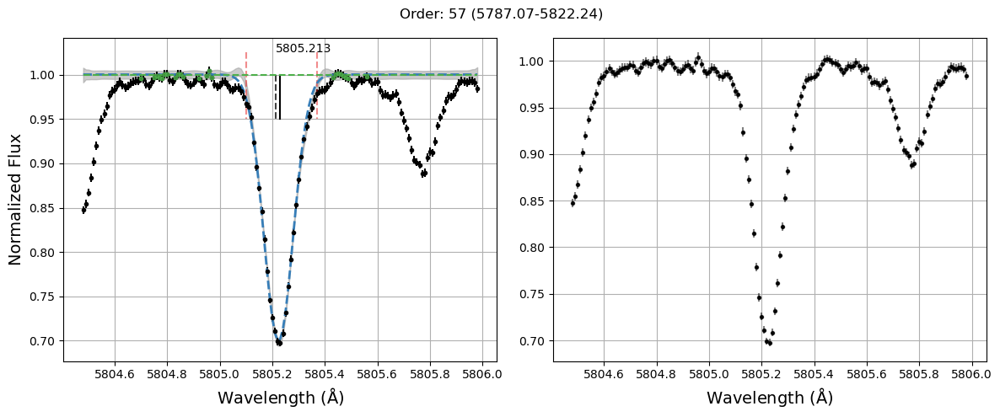

#-----------------------#
line to measure: Ni I 5846.986 - Line found: 5847.0
EW: 23.98 ± 0.24 simps-int: 23.98 ± 0.24


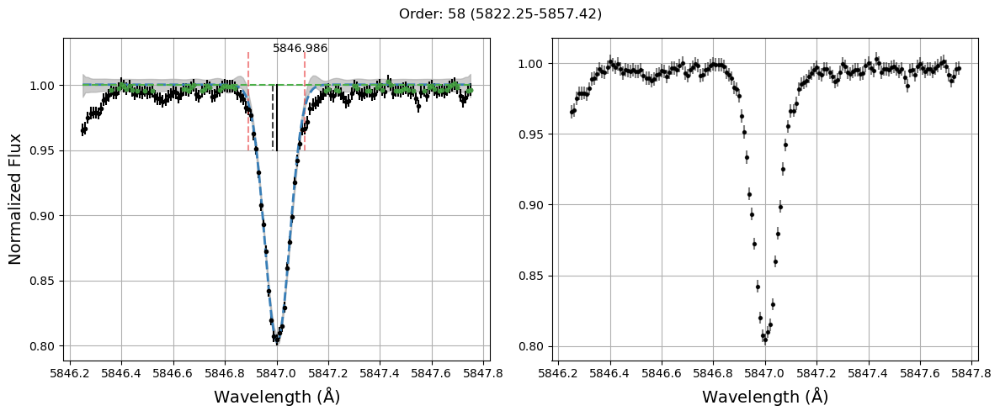

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ca I 5867.562 - Line found: 5867.57
EW: 25.18 ± 0.28 simps-int: 25.18 ± 0.28


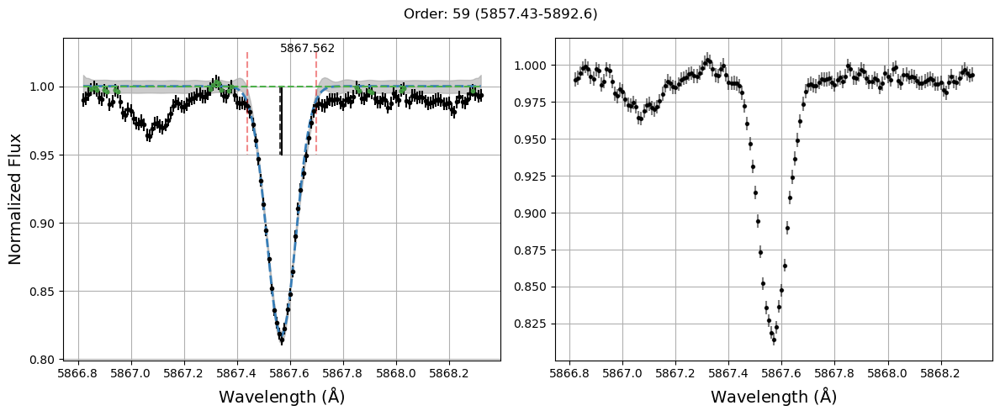

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ti I 5866.451 - Line found: 5866.46
EW: 49.02 ± 0.28 simps-int: 49.02 ± 0.28


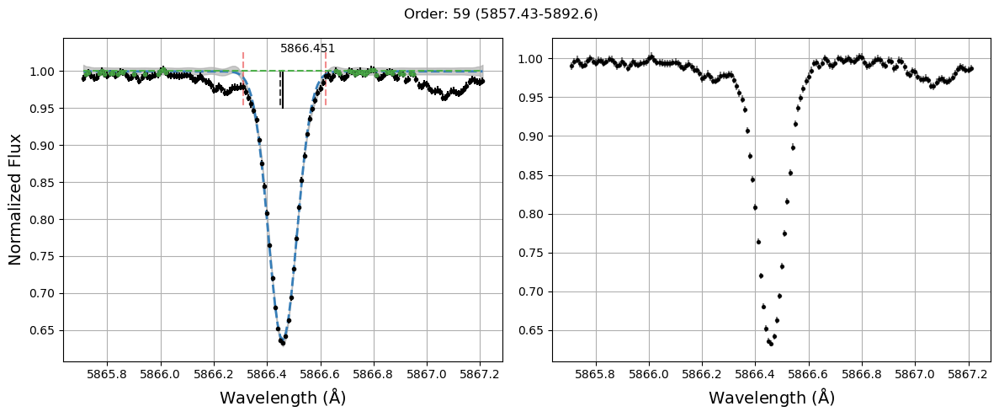

#-----------------------#
line to measure: Ti I 6091.171 - Line found: 6091.18
EW: 15.39 ± 0.28 simps-int: 15.39 ± 0.28


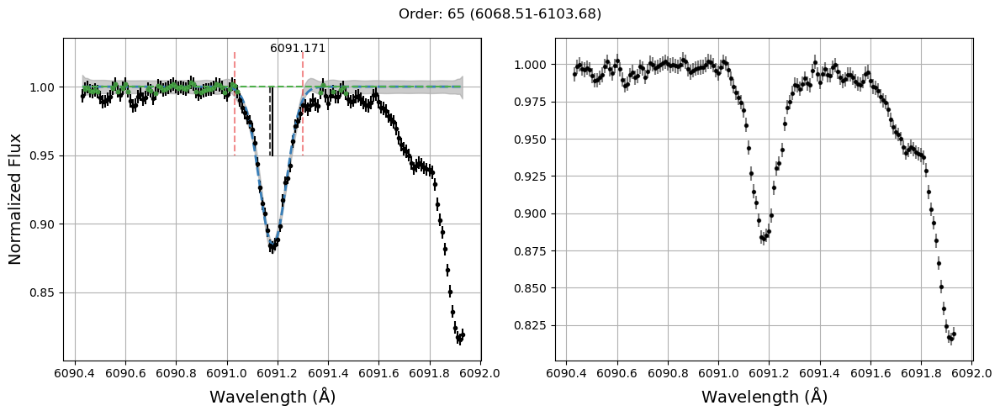

#-----------------------#
line to measure: Ti I 6098.658 - Line found: 6098.65
EW: 6.06 ± 0.26 simps-int: 6.06 ± 0.26


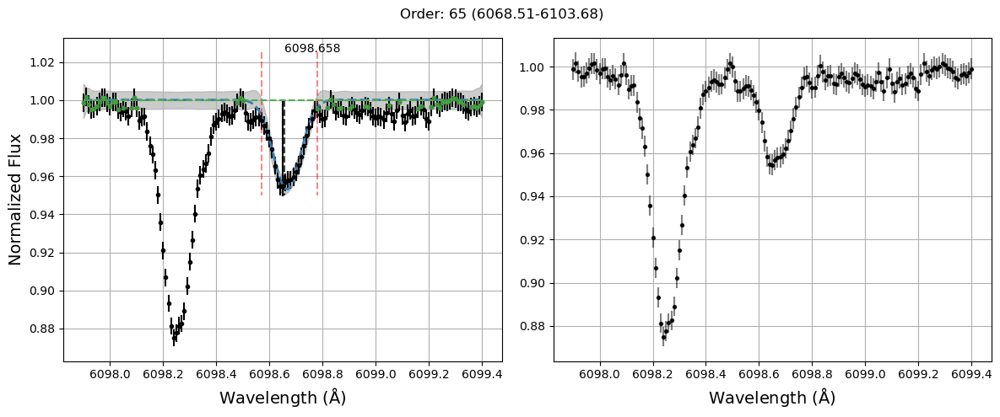

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: V I 6081.441 - Line found: 6081.4400000000005
EW: 15.39 ± 0.27 simps-int: 15.38 ± 0.27


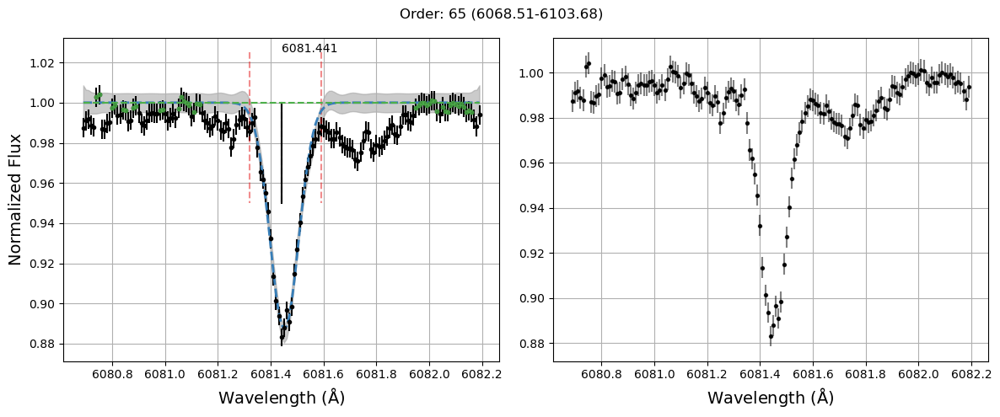

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: V I 6090.214 - Line found: 6090.22
EW: 34.38 ± 0.28 simps-int: 34.38 ± 0.28


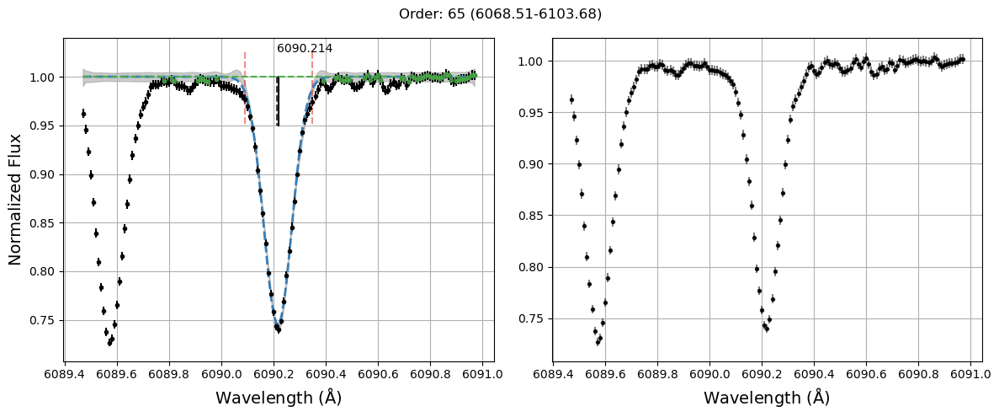

#-----------------------#
line to measure: Si I 6125.021 - Line found: 6125.02
EW: 33.18 ± 0.34 simps-int: 33.18 ± 0.34


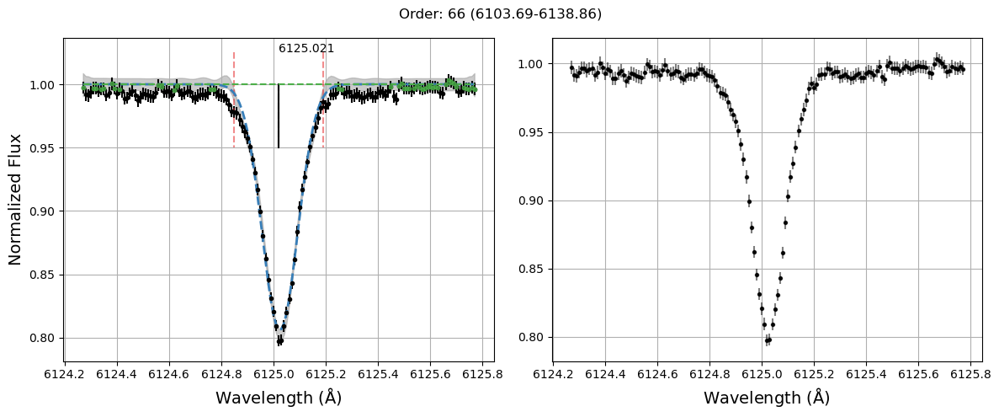

#-----------------------#
line to measure: V I 6111.645 - Line found: 6111.66
EW: 9.44 ± 0.22 simps-int: 9.44 ± 0.22


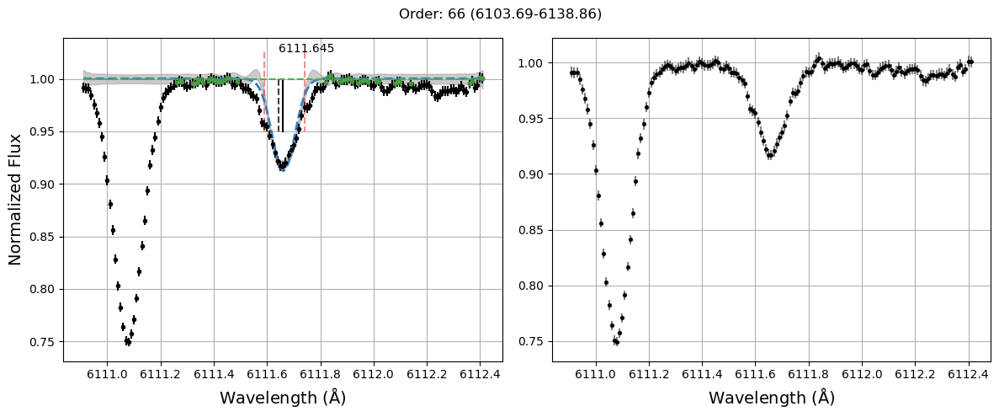

#-----------------------#
line to measure: Ni I 6108.107 - Line found: 6108.120000000001
EW: 66.57 ± 0.28 simps-int: 66.56 ± 0.28


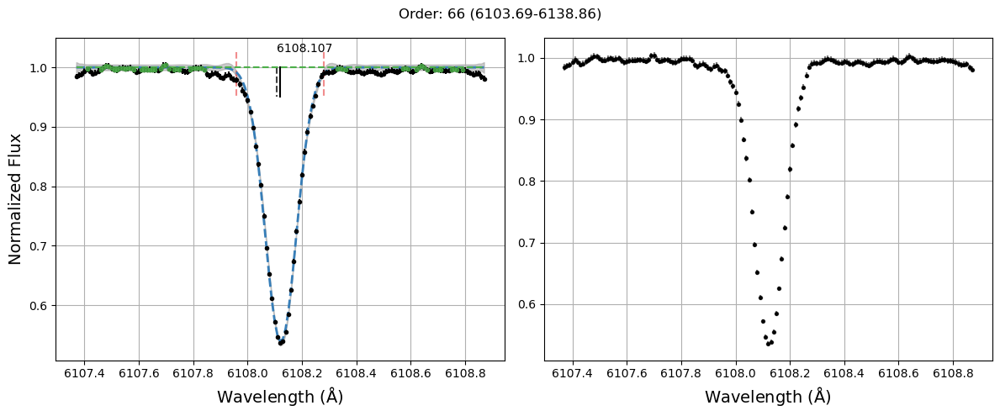

#-----------------------#
line to measure: Ni I 6128.963 - Line found: 6128.98
EW: 26.74 ± 0.26 simps-int: 26.74 ± 0.26


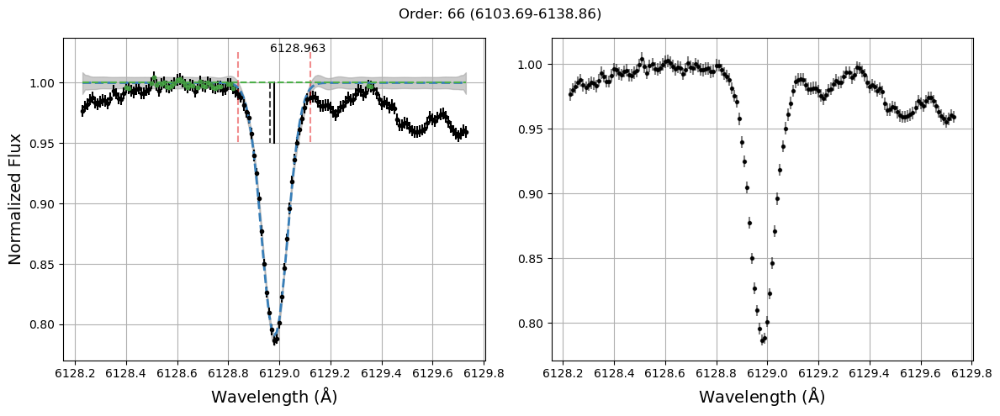

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6111.066 - Line found: 6111.08
EW: 35.09 ± 0.28 simps-int: 35.09 ± 0.28


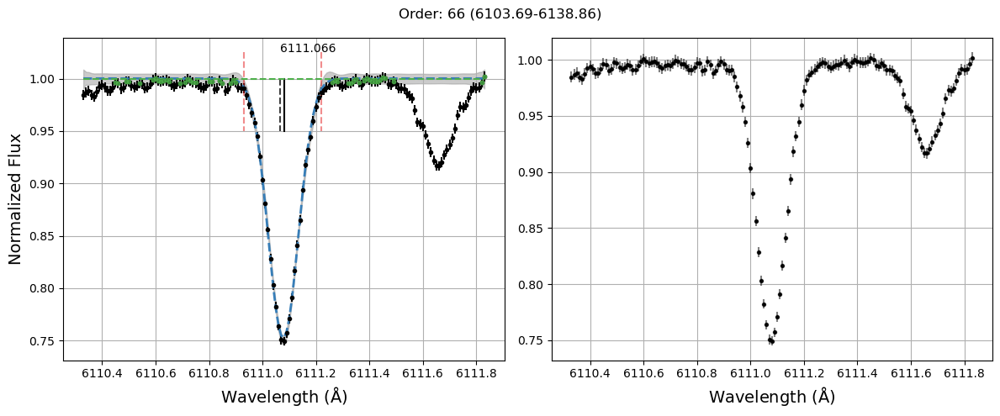

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6133.963 - Line found: 6133.96
EW: 6.16 ± 0.28 simps-int: 6.13 ± 0.57


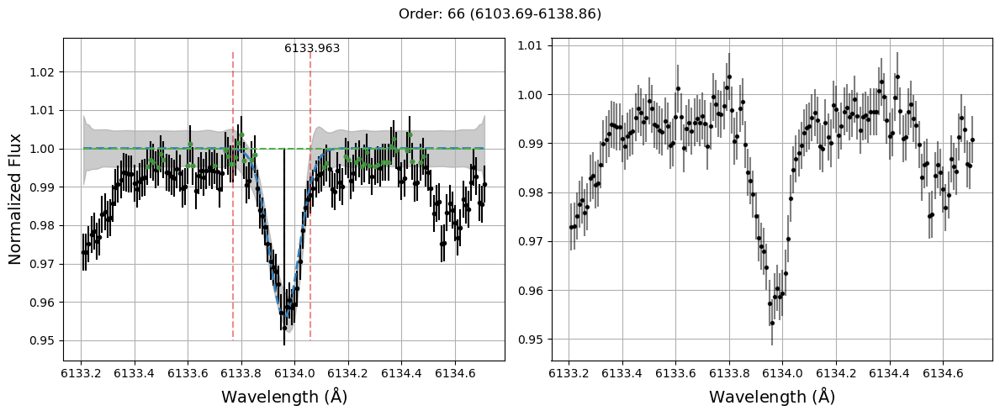

#-----------------------#
line to measure: Ni I 6130.13 - Line found: 6130.14
EW: 22.4 ± 0.26 simps-int: 22.4 ± 0.26


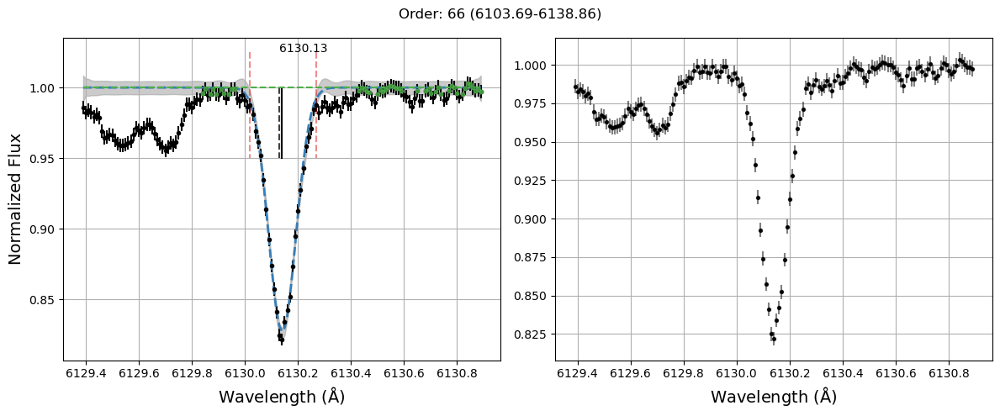

#-----------------------#
line to measure: Na I 6154.226 - Line found: 6154.24
EW: 36.95 ± 0.27 simps-int: 36.95 ± 0.27


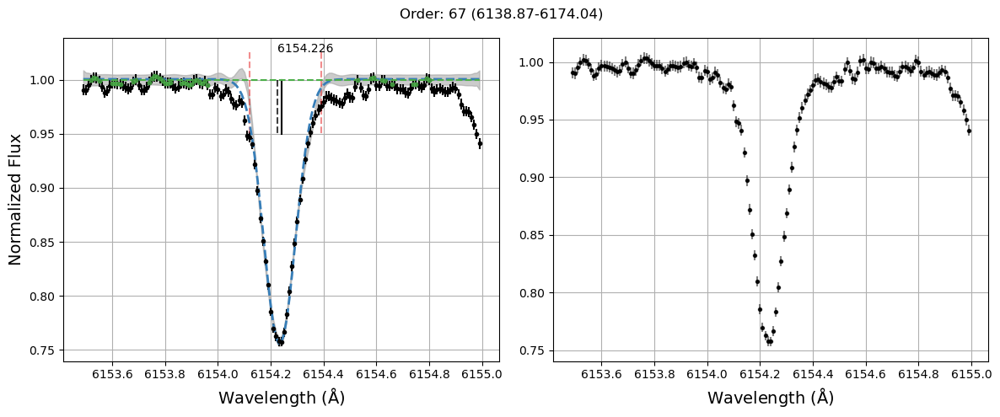

#-----------------------#
line to measure: Na I 6160.747 - Line found: 6160.76
EW: 55.38 ± 0.3 simps-int: 55.38 ± 0.3


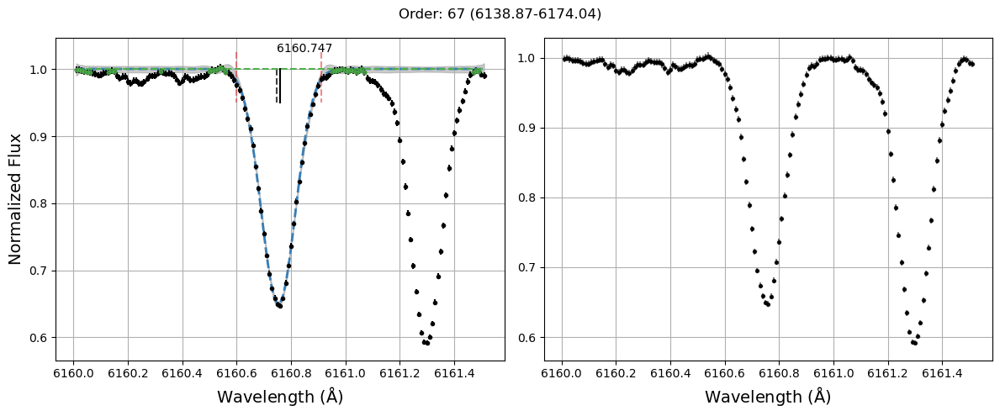

#-----------------------#
line to measure: Si I 6145.016 - Line found: 6145.02
EW: 39.5 ± 0.31 simps-int: 39.5 ± 0.31


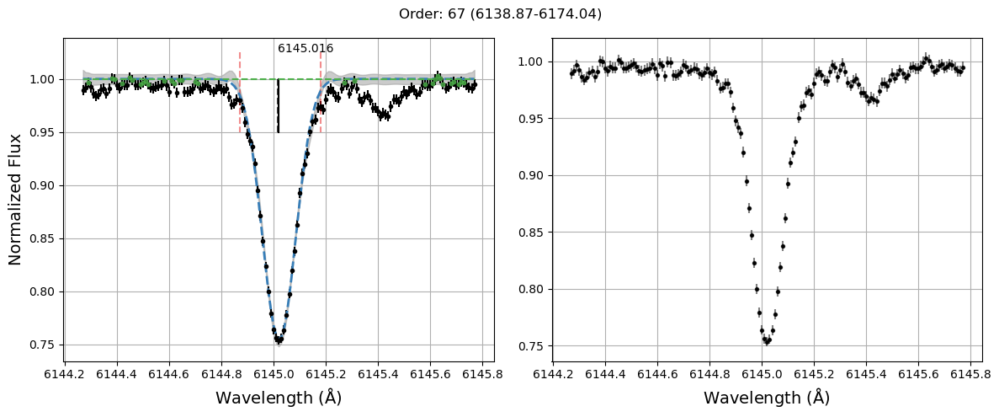

#-----------------------#
line to measure: Si I 6142.483 - Line found: 6142.5
EW: 33.57 ± 0.28 simps-int: 33.57 ± 0.28


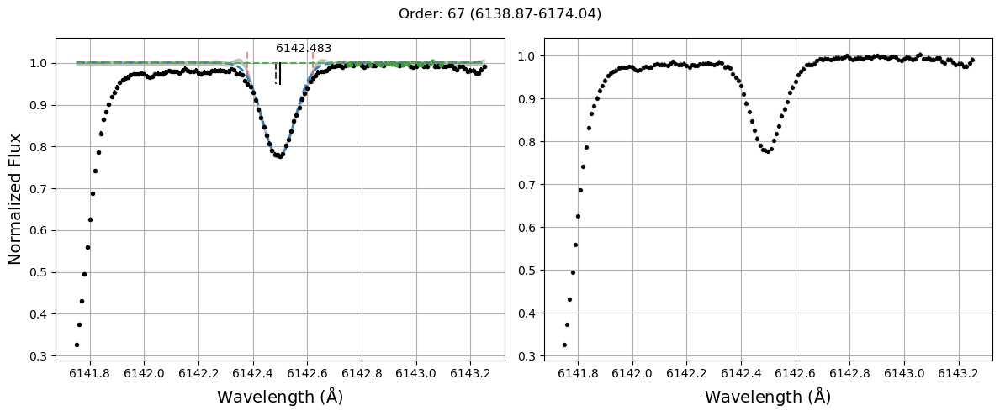

#-----------------------#
line to measure: Ca I 6166.439 - Line found: 6166.4400000000005
EW: 71.42 ± 0.28 simps-int: 71.41 ± 0.28


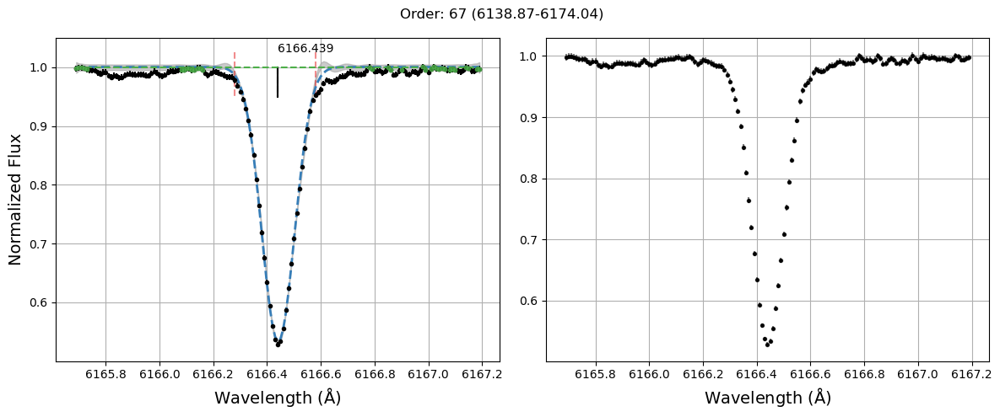

#-----------------------#
line to measure: Ca I 6169.042 - Line found: 6169.05
EW: 92.02 ± 0.28 simps-int: 92.01 ± 0.28


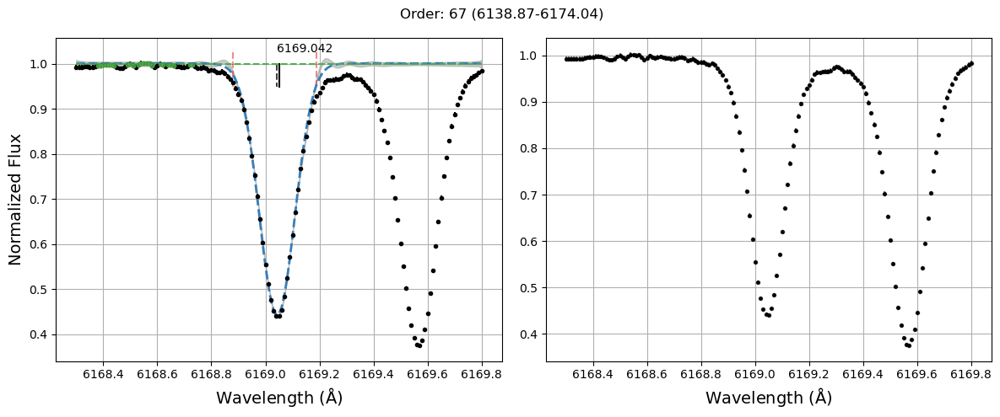

#-----------------------#
line to measure: Ca I 6161.297 - Line found: 6161.3
EW: 60.58 ± 0.28 simps-int: 60.58 ± 0.28


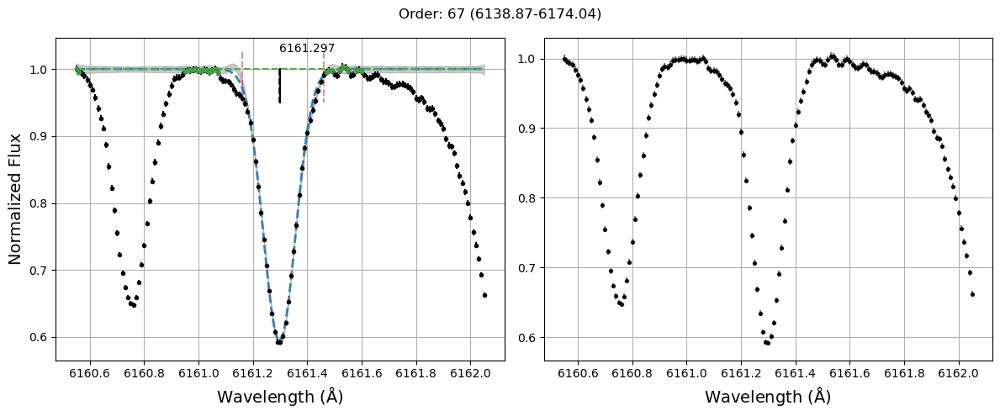

#-----------------------#
line to measure: Ca I 6169.563 - Line found: 6169.57
EW: 110.83 ± 0.3 simps-int: 110.82 ± 0.3


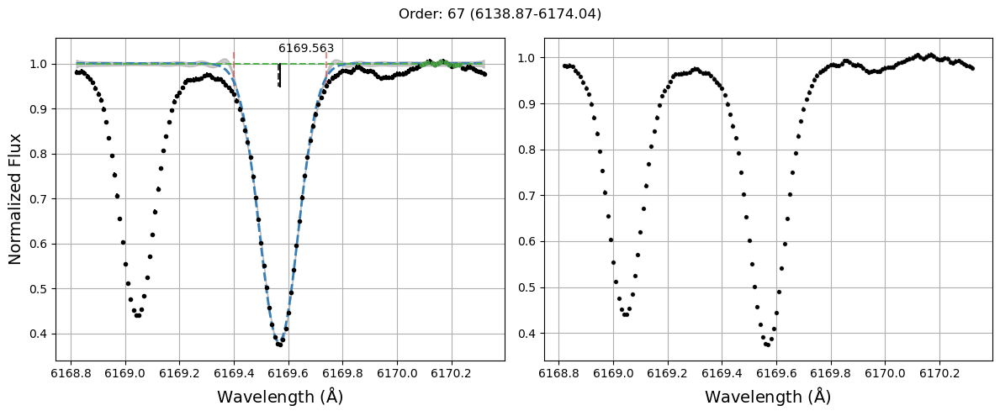

#-----------------------#
line to measure: Ni I 6177.236 - Line found: 6177.25
EW: 14.27 ± 0.24 simps-int: 14.27 ± 0.24


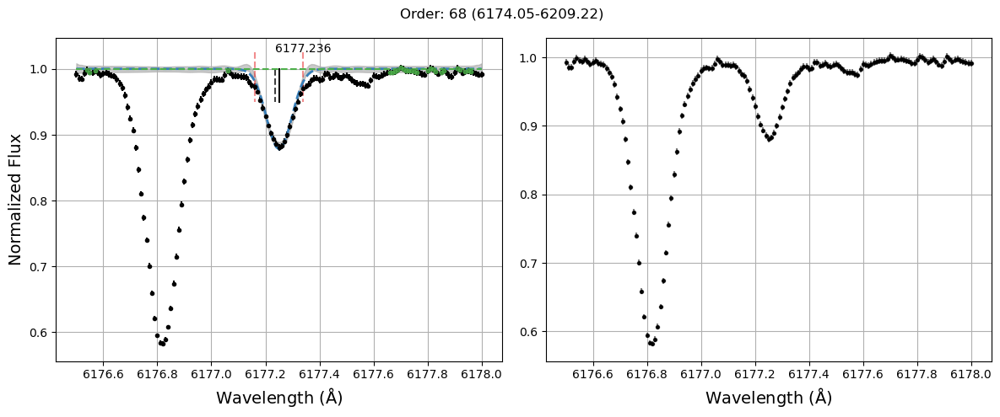

#-----------------------#
line to measure: Ni I 6176.807 - Line found: 6176.82
EW: 64.64 ± 0.3 simps-int: 64.64 ± 0.3


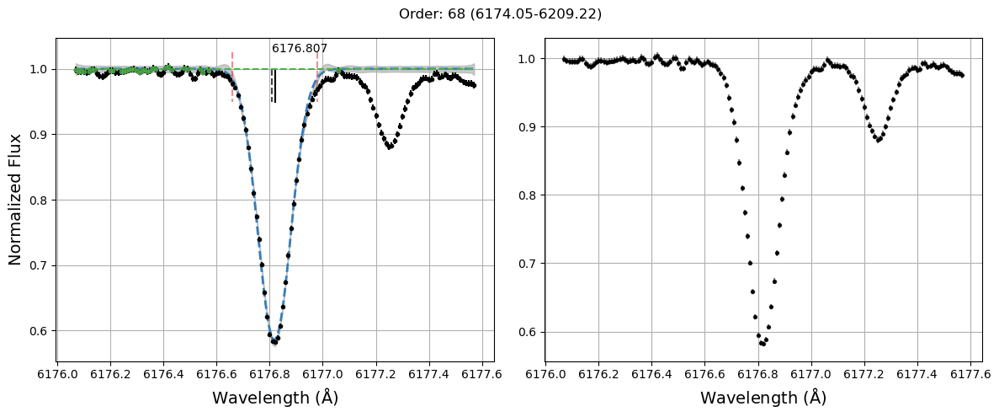

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6204.6 - Line found: 6204.610000000001
EW: 23.16 ± 0.27 simps-int: 23.16 ± 0.27


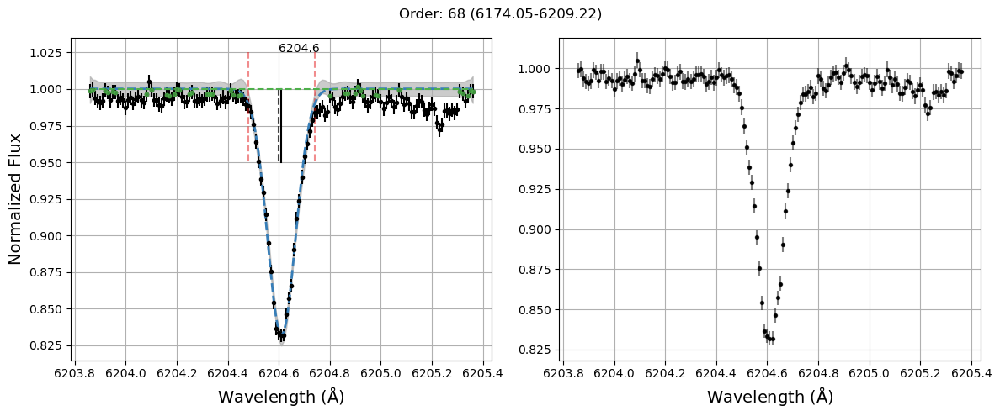

#-----------------------#
line to measure: Ni I 6175.36 - Line found: 6175.370000000001
EW: 50.54 ± 0.27 simps-int: 50.54 ± 0.27


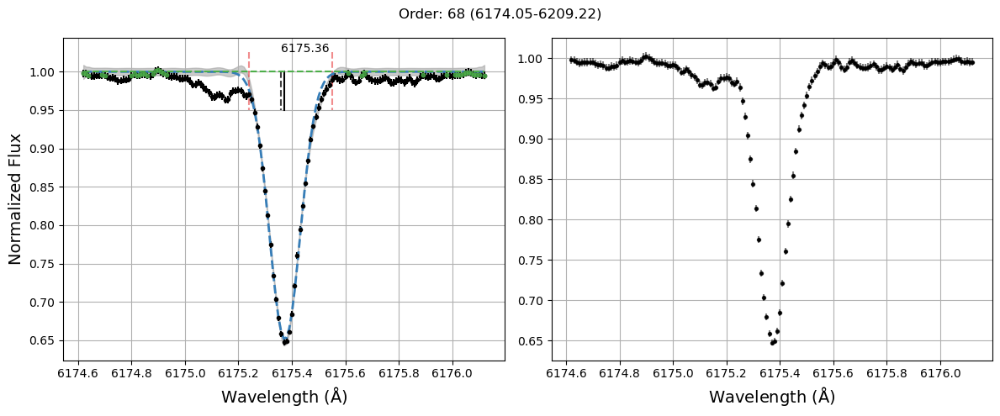

#-----------------------#
line to measure: Ni I 6186.709 - Line found: 6186.72
EW: 32.06 ± 0.27 simps-int: 32.06 ± 0.27


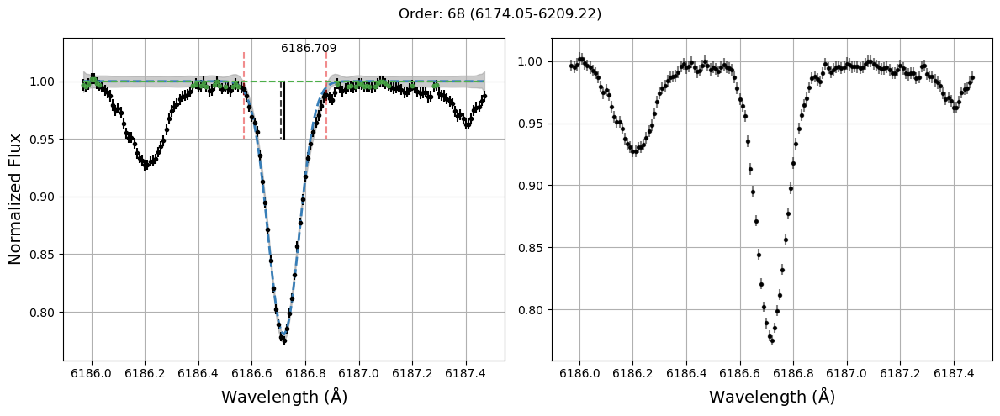

#-----------------------#
SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not b

line to measure: Si I 6243.815 - Line found: 6243.82
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


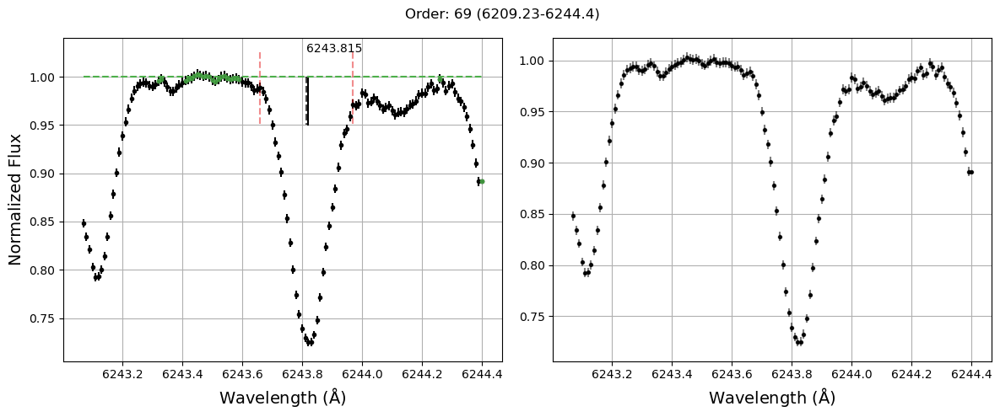

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: V I 6224.529 - Line found: 6224.51
EW: 4.3 ± 0.2 simps-int: 4.3 ± 0.2


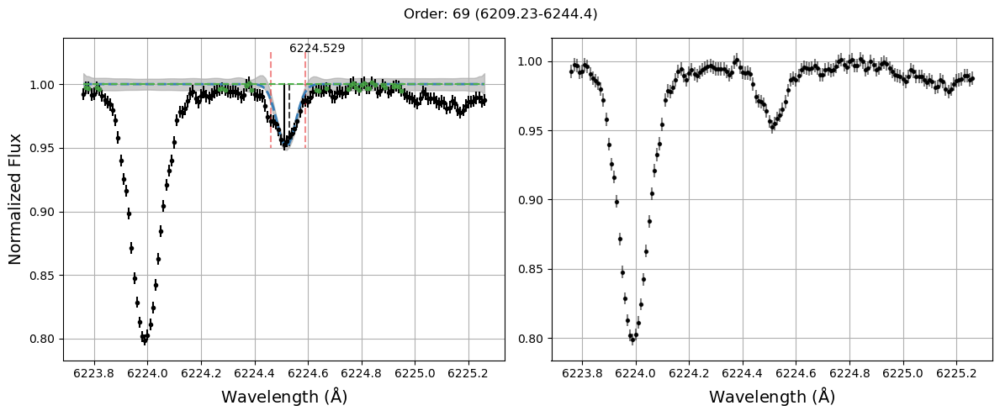

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: V I 6243.105 - Line found: 6243.110000000001
EW: 27.76 ± 0.28 simps-int: 27.76 ± 0.28


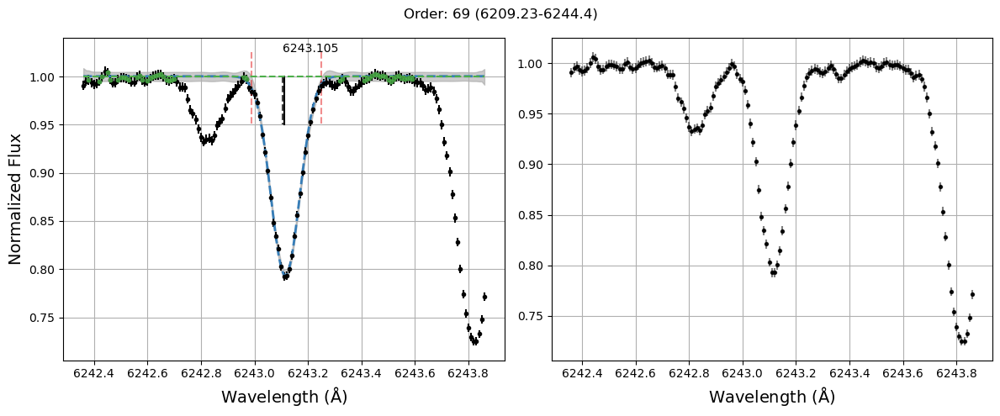

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6223.981 - Line found: 6223.99
EW: 28.48 ± 0.31 simps-int: 28.48 ± 0.31


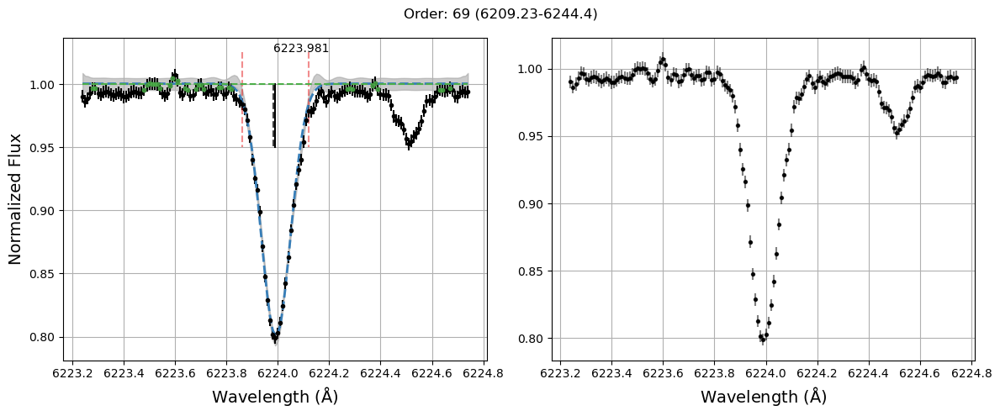

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6230.09 - Line found: 6230.09
EW: 20.55 ± 0.25 simps-int: 20.55 ± 0.25


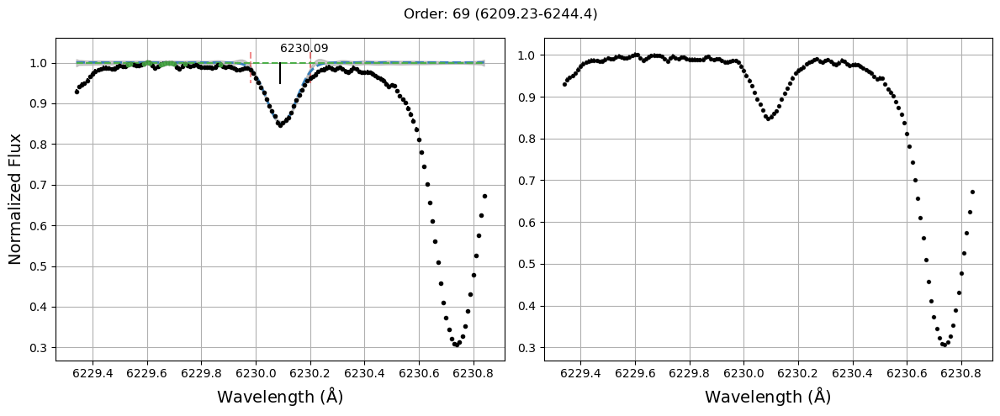

#-----------------------#
line  6244.466  very close to edge or dy selection value too small
will attempt to remeasure, if not possible, add line to exclude lines list in .measure_all_ew() function


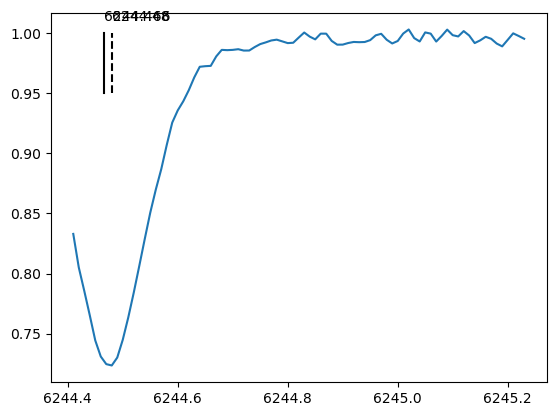

SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:529: RuntimeWarning: Mean of empty slice.
  best_bf = np.array([a_values[np.w

line to measure: Si I 6244.466 - Line found: 6244.48
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


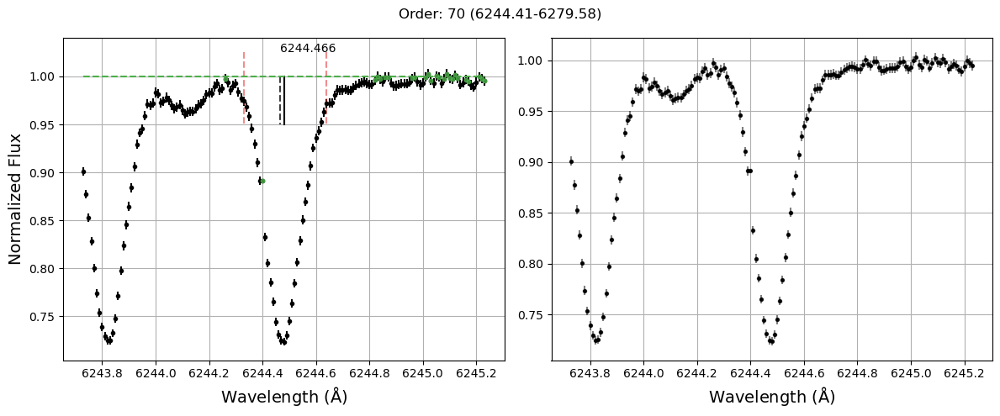

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Sc II 6245.637 - Line found: 6245.620000000001
EW: 35.35 ± 0.28 simps-int: 35.34 ± 0.28


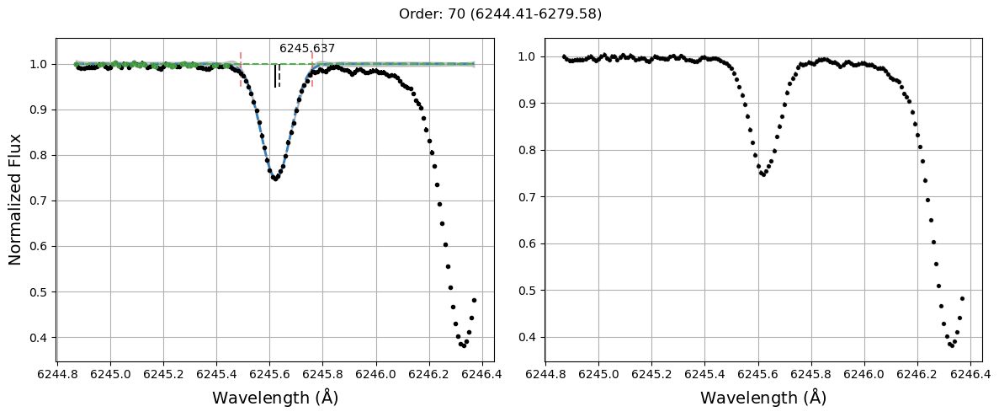

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:168: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ti I 6261.098 - Line found: 6261.110000000001
EW: 50.81 ± 1.06 simps-int: 50.7 ± 3.55


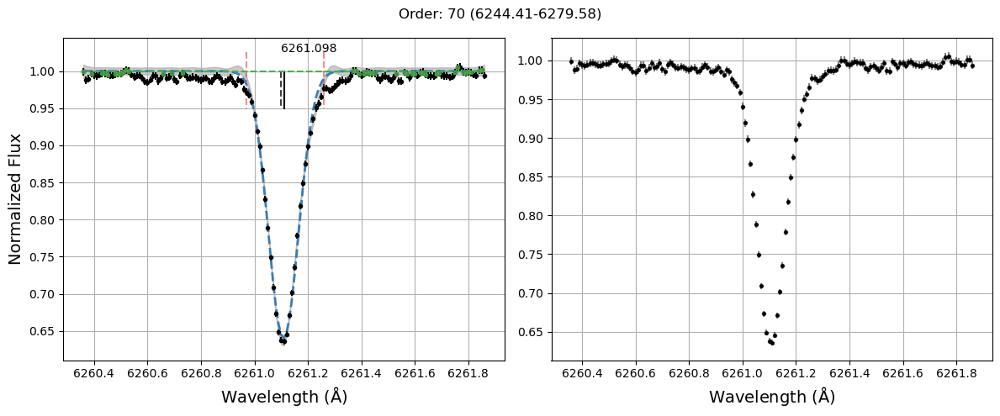

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ti I 6258.102 - Line found: 6258.110000000001
EW: 52.49 ± 0.27 simps-int: 52.49 ± 0.27


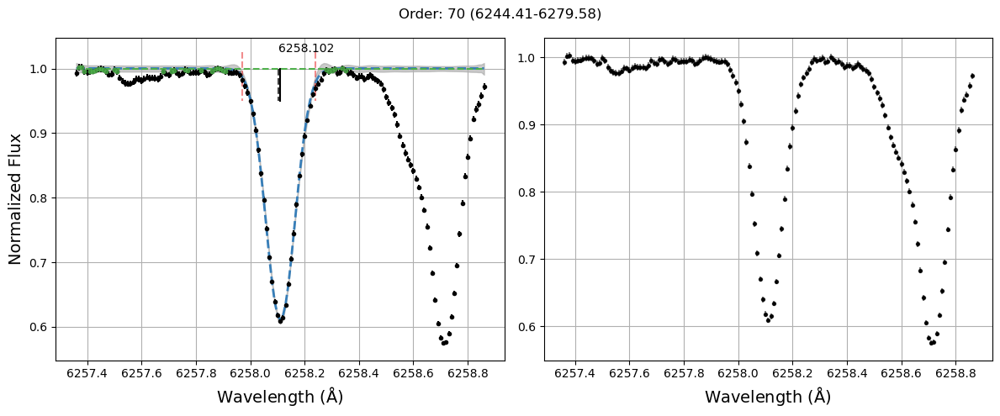

#-----------------------#
line to measure: V I 6251.827 - Line found: 6251.83
EW: 13.0 ± 0.23 simps-int: 13.0 ± 0.23


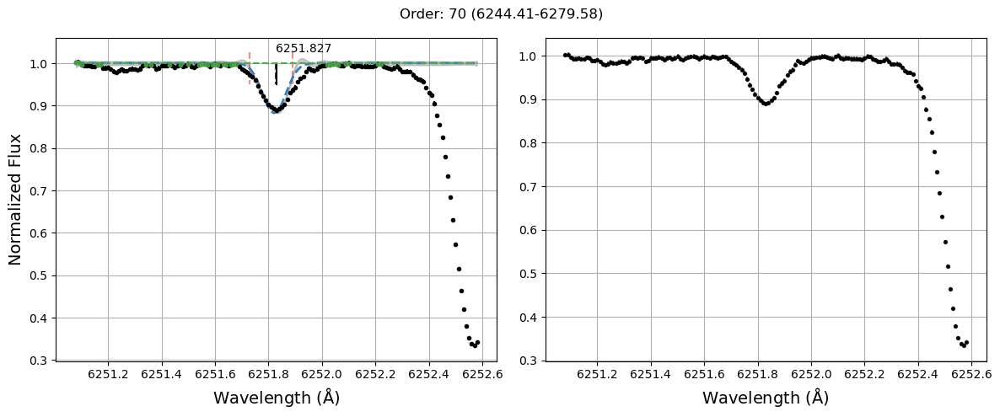

#-----------------------#
line to measure: O I 6300.304 - Line found: 6300.34
EW: 4.48 ± 0.25 simps-int: 4.48 ± 0.25


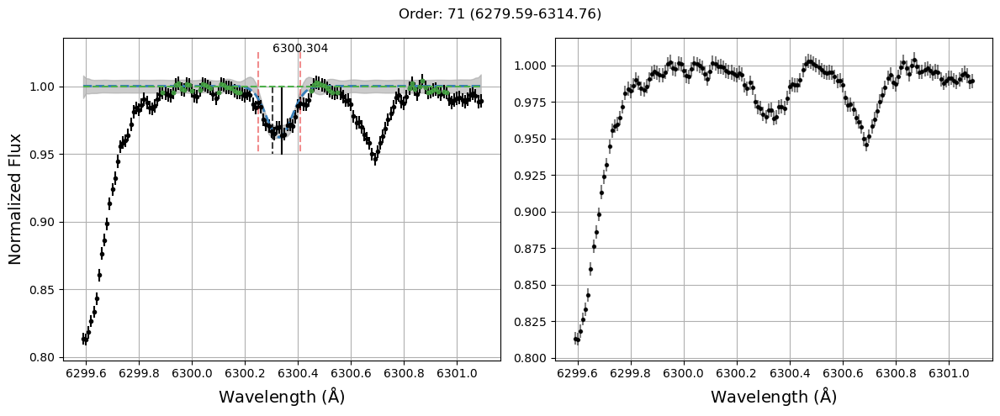

#-----------------------#
line to measure: V I 6285.15 - Line found: 6285.16
EW: 11.26 ± 0.29 simps-int: 11.26 ± 0.29


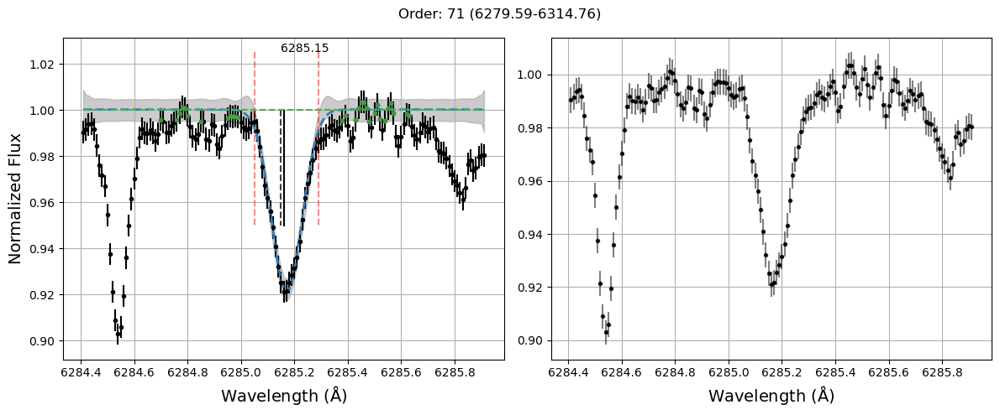

#-----------------------#
line to measure: Sc II 6320.851 - Line found: 6320.85
EW: 9.03 ± 0.28 simps-int: 9.02 ± 0.28


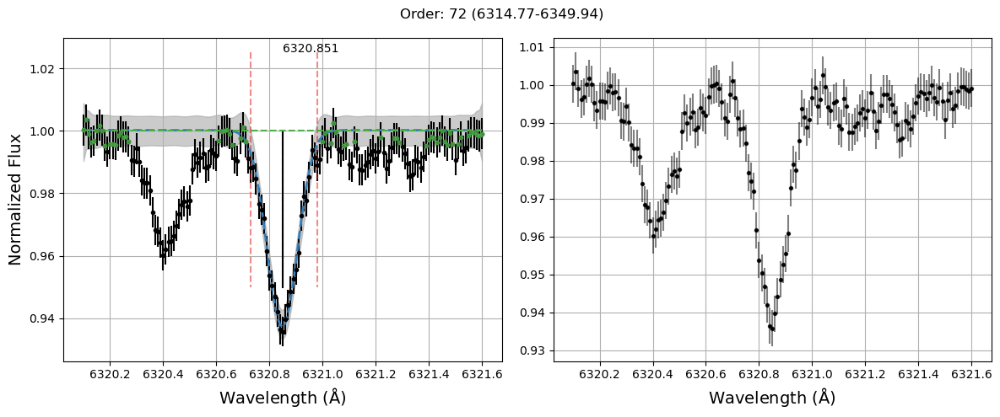

#-----------------------#
line to measure: Cr I 6330.091 - Line found: 6330.1
EW: 28.59 ± 0.27 simps-int: 28.59 ± 0.27


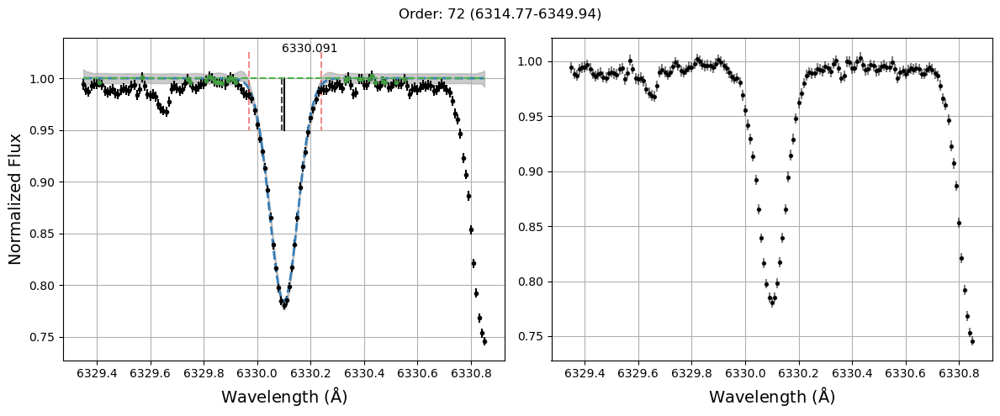

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6327.593 - Line found: 6327.610000000001
EW: 39.93 ± 0.27 simps-int: 39.92 ± 0.27


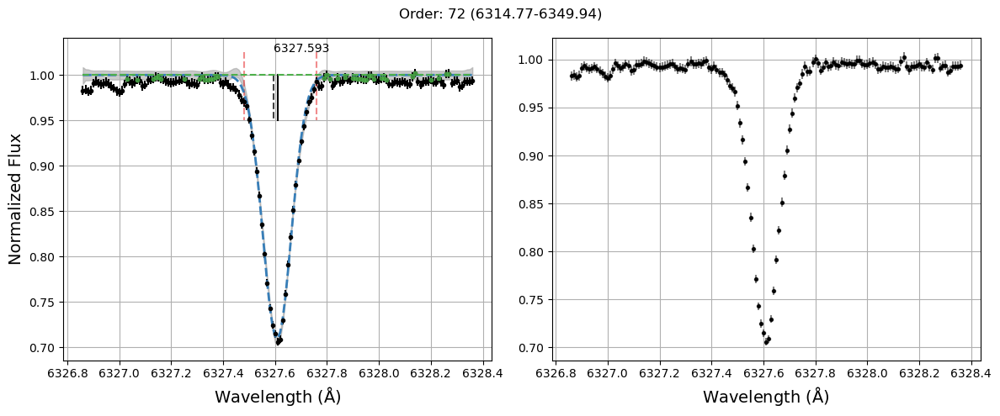

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Ni I 6370.341 - Line found: 6370.35
EW: 13.98 ± 0.3 simps-int: 13.98 ± 0.3


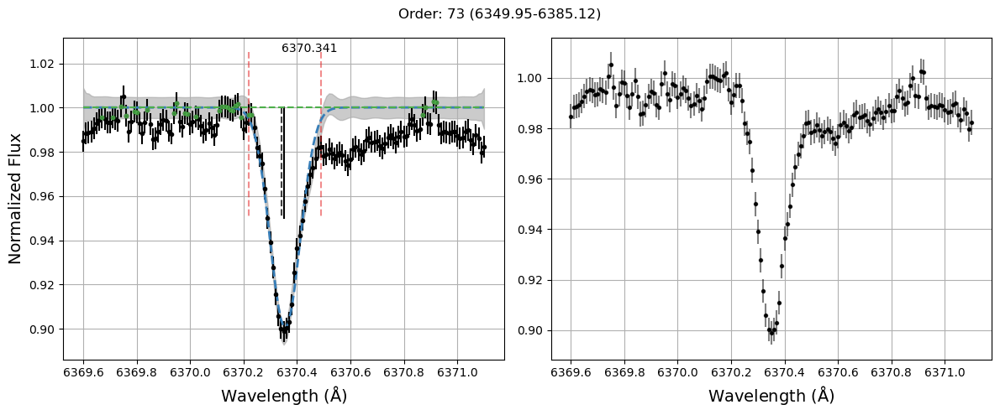

#-----------------------#
line to measure: Ni I 6378.247 - Line found: 6378.26
EW: 34.04 ± 0.31 simps-int: 34.03 ± 0.31


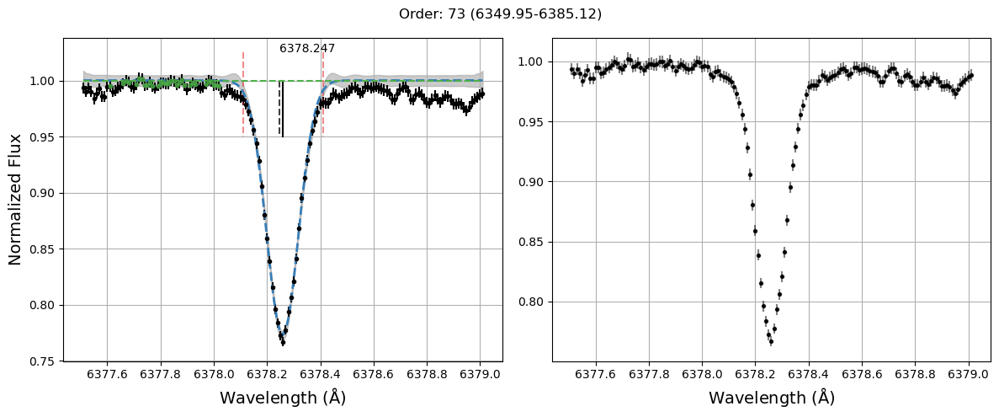

#-----------------------#
line to measure: Si I 6414.98 - Line found: 6414.99
EW: 47.4 ± 0.35 simps-int: 47.4 ± 0.35


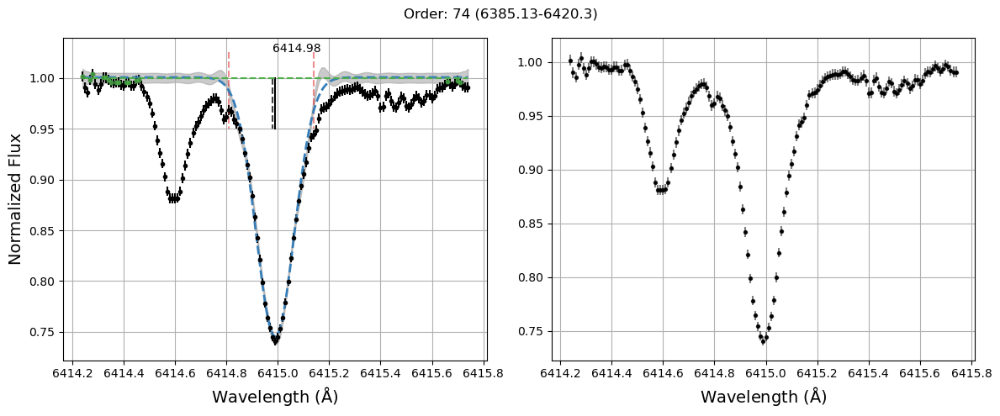

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: C I 6587.61 - Line found: 6587.64
EW: 10.07 ± 0.3 simps-int: 10.07 ± 0.3


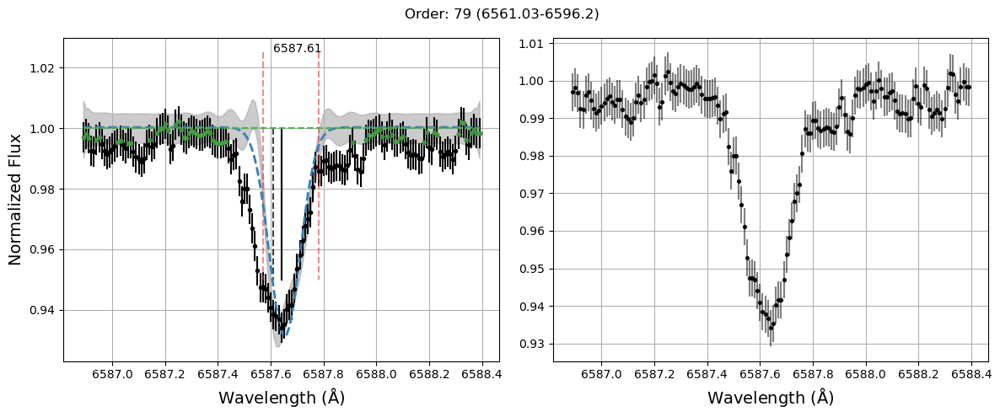

#-----------------------#
line to measure: Ca I 6572.779 - Line found: 6572.790000000001
EW: 33.06 ± 0.31 simps-int: 33.06 ± 0.31


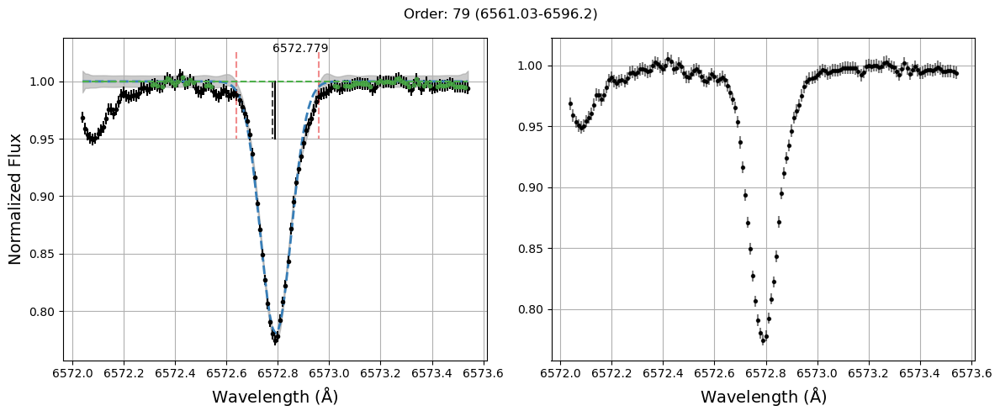

#-----------------------#
SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:529: RuntimeWarning: Mean of empty slice.
  best_bf = np.array([a_values[np.w

line to measure: Co I 6595.864 - Line found: 6595.88
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


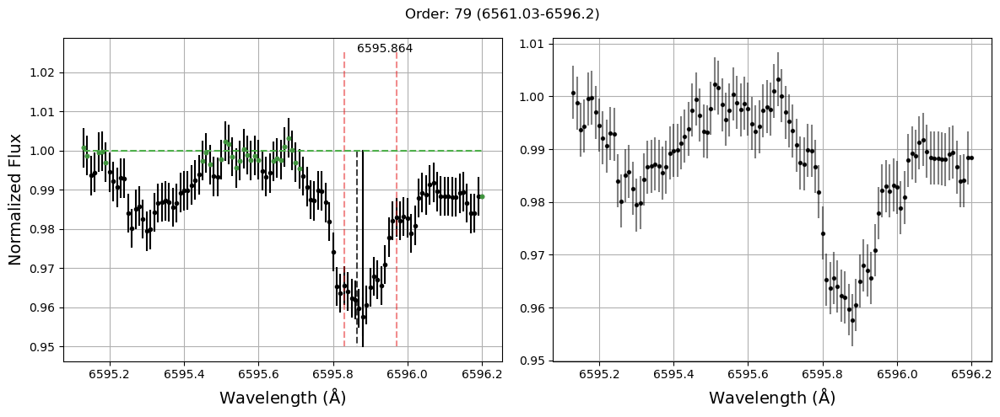

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Sc II 6604.601 - Line found: 6604.6
EW: 36.99 ± 0.29 simps-int: 36.99 ± 0.29


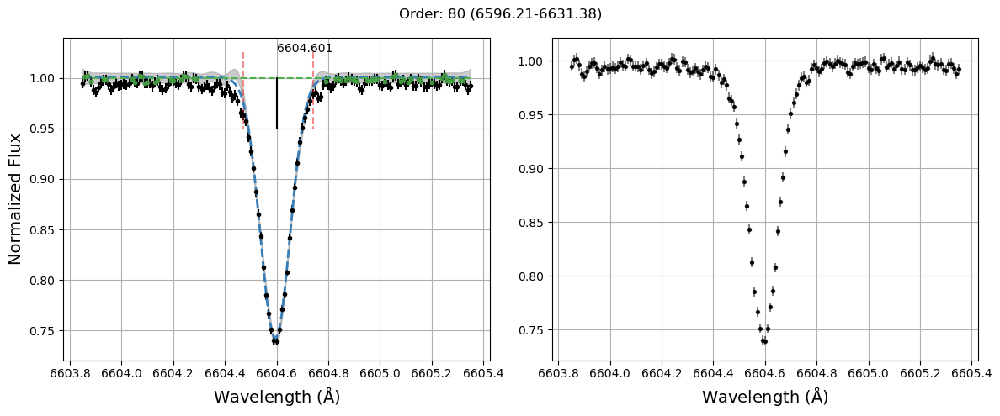

#-----------------------#
line to measure: Ni I 6598.593 - Line found: 6598.610000000001
EW: 26.2 ± 0.29 simps-int: 26.2 ± 0.29


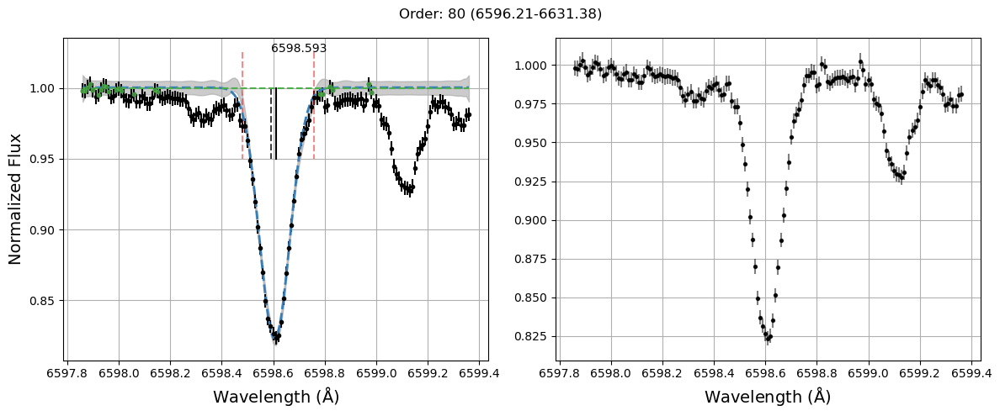

#-----------------------#
line to measure: Co I 6632.433 - Line found: 6632.46
EW: 8.72 ± 0.35 simps-int: 8.7 ± 0.66


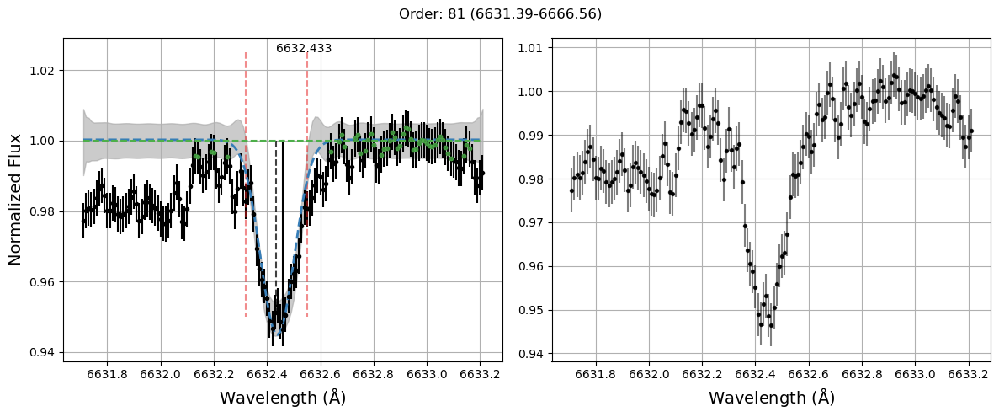

#-----------------------#
line to measure: Ni I 6643.629 - Line found: 6643.64
EW: 94.98 ± 0.31 simps-int: 94.97 ± 0.31


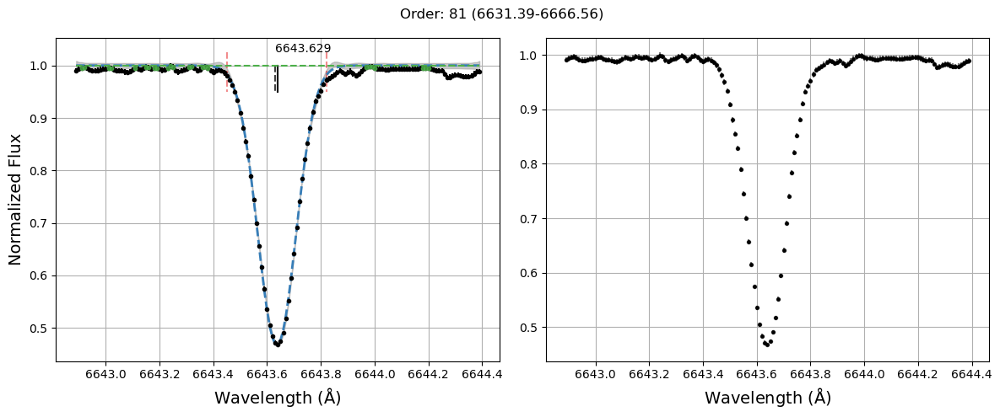

#-----------------------#
line to measure: Ni I 6635.118 - Line found: 6635.13
EW: 25.64 ± 0.32 simps-int: 25.63 ± 0.32


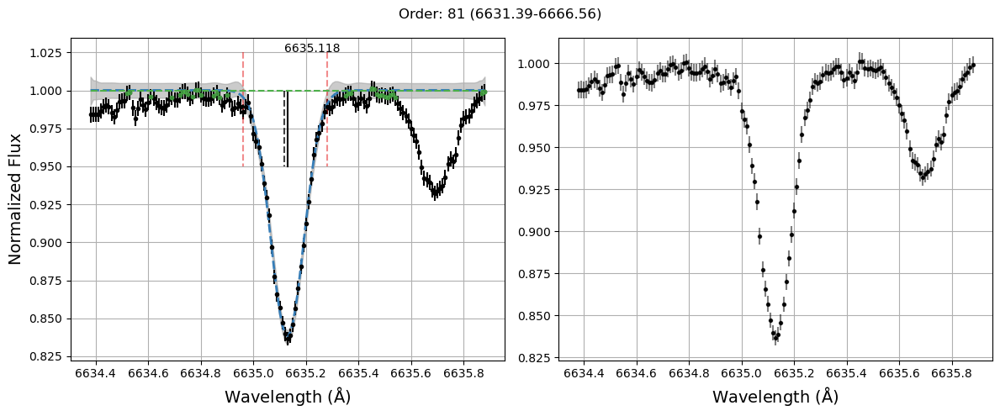

#-----------------------#
line to measure: Al I 6696.023 - Line found: 6696.030000000001
EW: 37.69 ± 0.32 simps-int: 37.69 ± 0.32


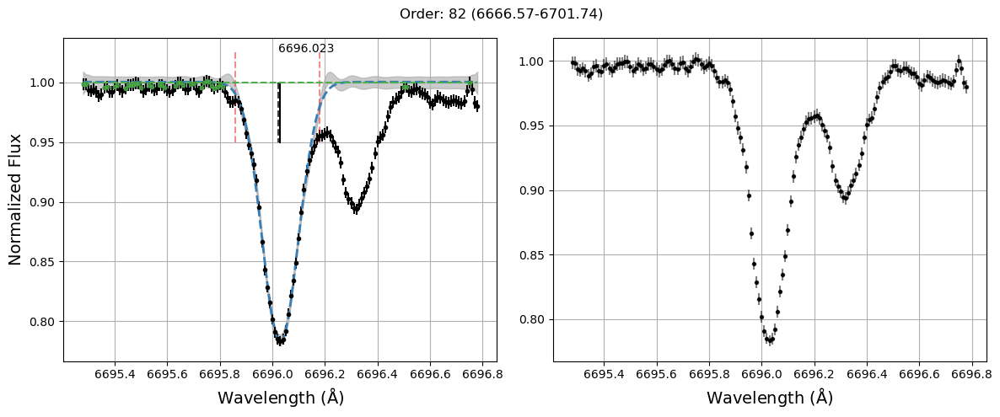

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Al I 6698.673 - Line found: 6698.68
EW: 21.88 ± 0.33 simps-int: 21.88 ± 0.33


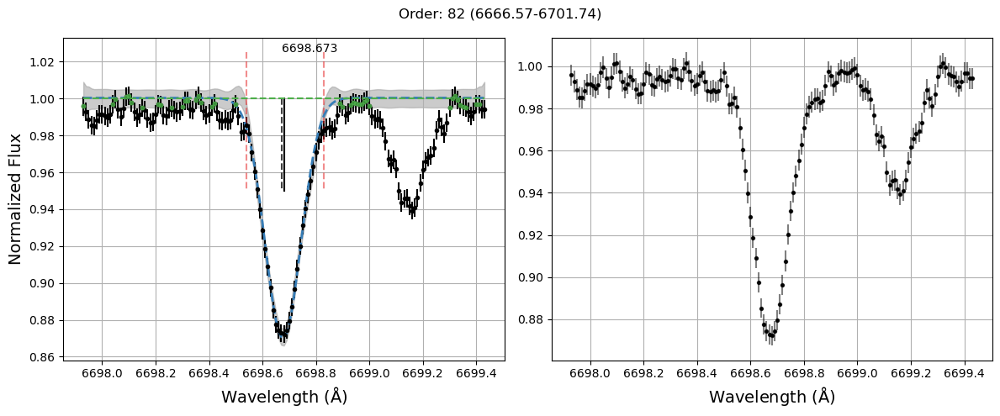

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Si I 6741.628 - Line found: 6741.63
EW: 13.71 ± 0.3 simps-int: 13.71 ± 0.3


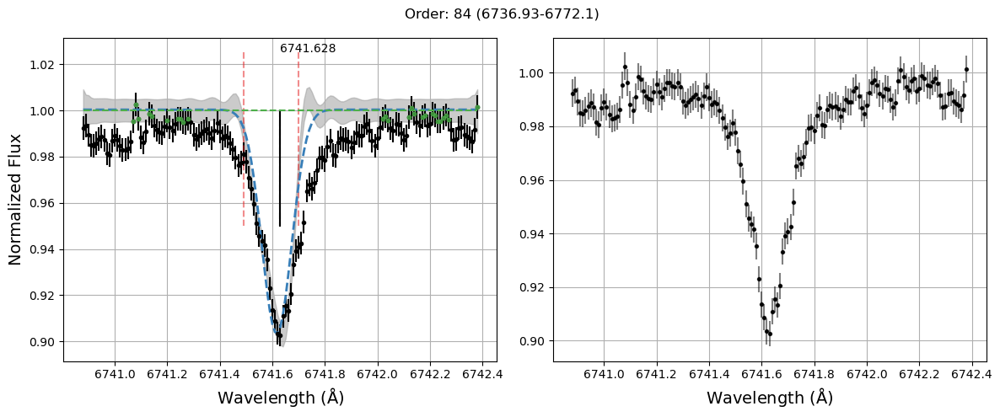

#-----------------------#
line to measure: S I 6757.171 - Line found: 6757.200000000001
EW: 9.88 ± 0.29 simps-int: 9.88 ± 0.29


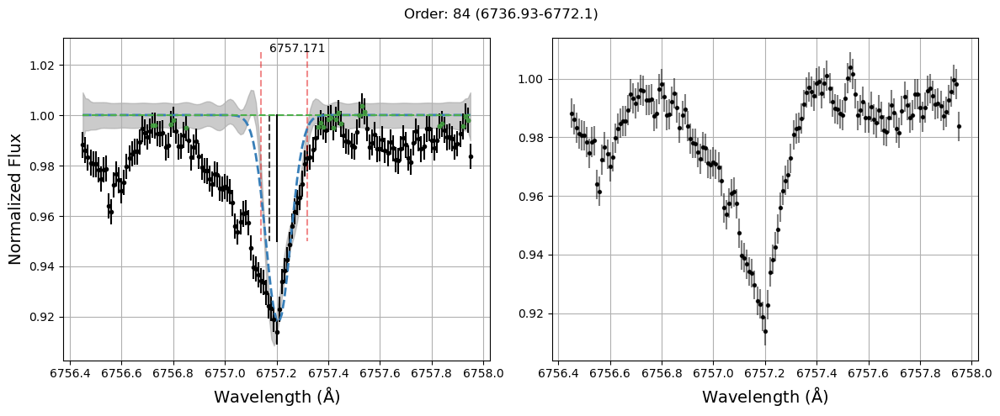

#-----------------------#
line to measure: Ni I 6767.768 - Line found: 6767.790000000001
EW: 80.53 ± 0.32 simps-int: 80.53 ± 0.32


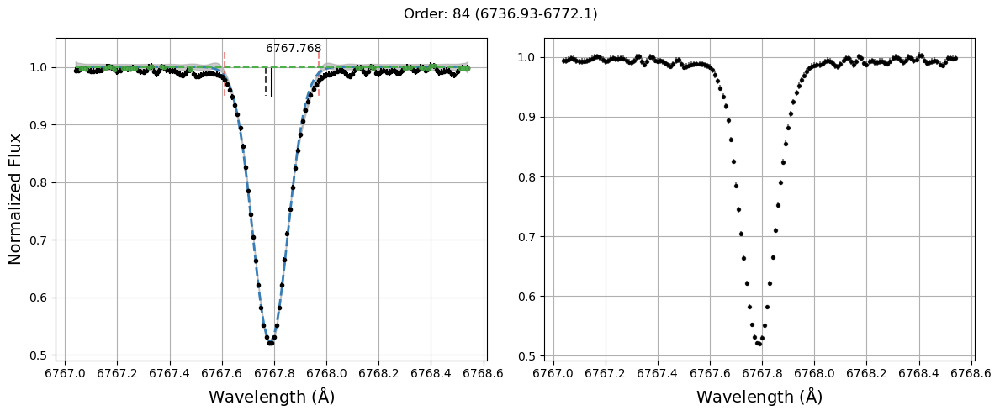

#-----------------------#
line to measure: Mg I 6841.19 - Line found: 6841.280000000001
EW: 29.73 ± 0.29 simps-int: 29.73 ± 0.29


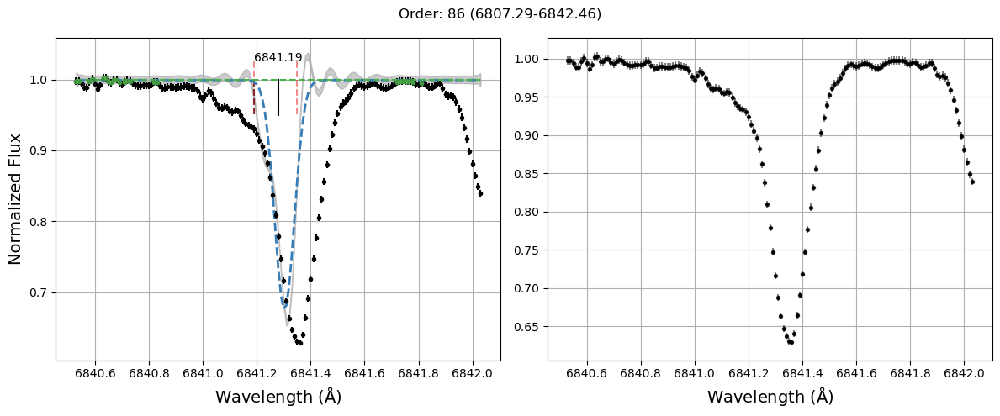

#-----------------------#
line to measure: Co I 6814.942 - Line found: 6814.9400000000005
EW: 21.06 ± 0.37 simps-int: 21.05 ± 0.37


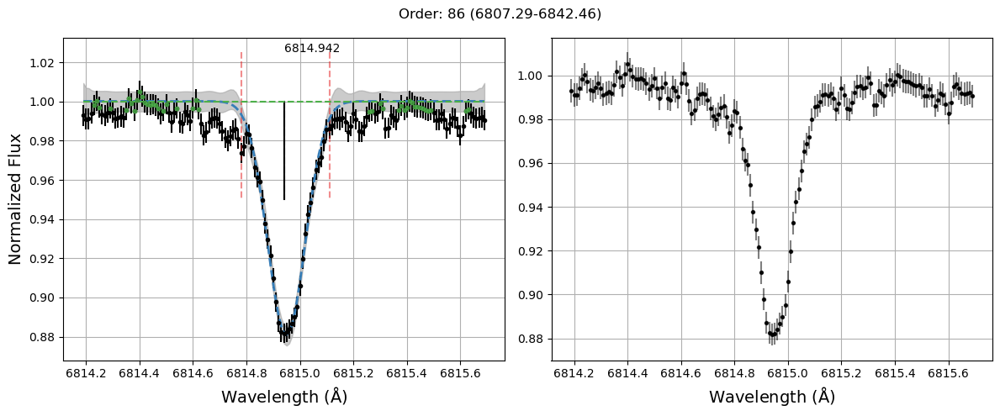

#-----------------------#
SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not b

line to measure: Ni I 6842.035 - Line found: 6842.030000000001
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


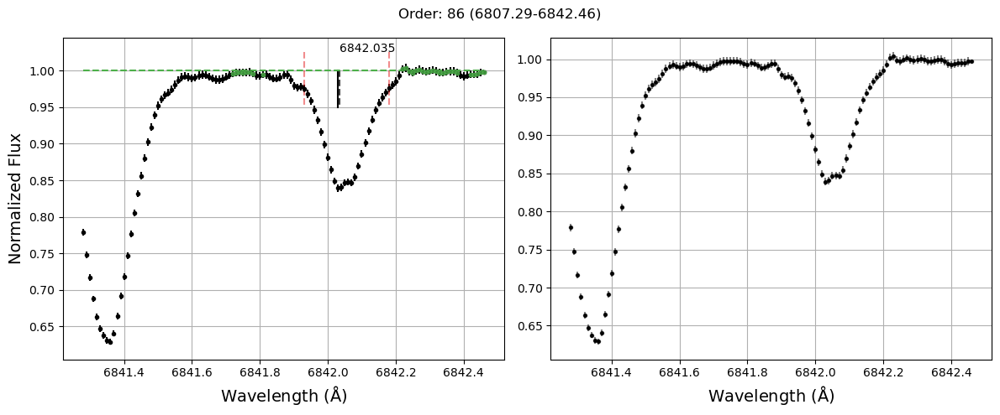

#-----------------------#
line to measure: Si I 6848.58 - Line found: 6848.57
EW: 15.02 ± 0.29 simps-int: 15.02 ± 0.29


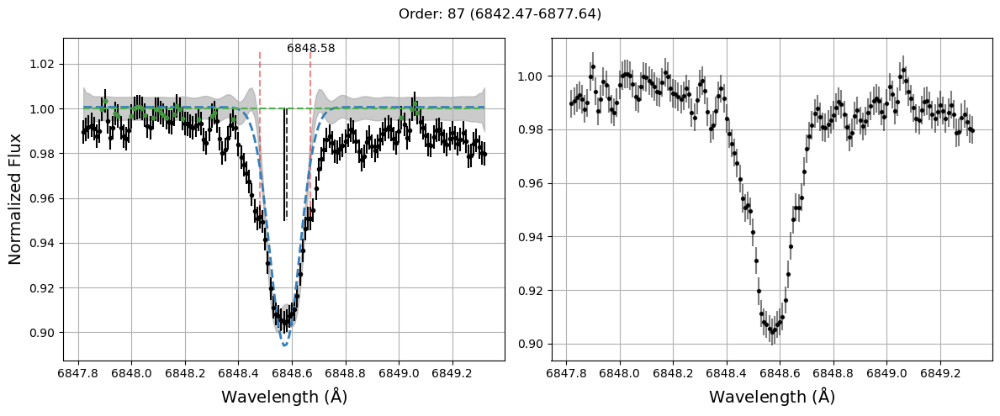

#-----------------------#


In [50]:
plot_lines = Test.lines

exclude_lines = np.array([]) #this line was too close to an edge and broke the code
                                     #We measure it individually below with a smaller window size and rerun the
                                     #code here and skip this line so it won't break again (this can also be fixed)
                                     #by changing to number of split orders or size of orders
Test.measure_all_ew(plot_lines = plot_lines)

In [51]:
Test.check_for_flags()

5052.167 might have a bad fit 0.026837096272316462
5380.337 might have a bad fit 0.009654323036850647
6587.61 might have a bad fit 0.00303292224921576
5682.633 might have a bad fit 0.03305281148240026
6154.226 might have a bad fit 0.005086824303207596
5711.088 might have a bad fit 0.008287202479932658
4730.029 might have a bad fit 0.009891118635883041
6841.19 might have a bad fit 0.1315193504753392
5708.4 might have a bad fit 0.009854694829283842
6244.466 might be too shallow 0.0
6243.815 might be too shallow 0.0
6142.483 might have a bad fit 0.004532817822552766
6848.58 might have a bad fit 0.004694639319443934
6414.98 might have a bad fit 0.0046163408173334145
6741.628 might have a bad fit 0.00481561285607773
6757.171 might have a bad fit 0.004465629194791543
6166.439 might have a bad fit 0.003617031500654425
6169.042 might have a bad fit 0.00751976232932316
6169.563 might have a bad fit 0.009638199073170484
5039.957 might have a bad fit 0.004965052403085809
5210.385 might have a bad

/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:669: RuntimeWarning: invalid value encountered in double_scalars
  if self.lines_ew_err[i]/self.lines_ew[i] >= .1:


line  6244.466  very close to edge or dy selection value too small
will attempt to remeasure, if not possible, add line to exclude lines list in .measure_all_ew() function


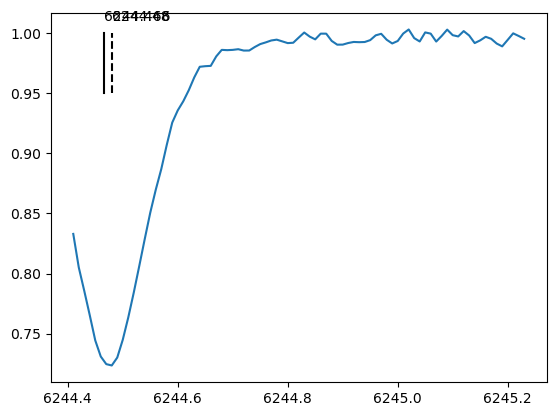

SVD did not converge, setting samples to 0
If line is close to an edge, try remeasuring line with a smaller window size


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:483: RuntimeWarning: divide by zero encountered in true_divide
  upper_cont_bounds = measure_y_array+ ex_params[0] + 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:484: RuntimeWarning: divide by zero encountered in true_divide
  lower_cont_bounds = measure_y_array+ ex_params[0] - 2*temp_err_array/temp_pred_array
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:488: RuntimeWarning: divide by zero encountered in true_divide
  m,C=Pred_GP(SEKernel,[1,100],measure_x_array,flat_wing,2*temp_err_array/temp_pred_array, xtest)
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:189: RuntimeWarning: invalid value encountered in multiply
  K += np.identity(xobs.shape[0]) * eobs**2
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:529: RuntimeWarning: Mean of empty slice.
  best_bf = np.array([a_values[np.w

line to measure: Si I 6244.466 - Line found: 6244.48
EW: 0.0 ± 0.0 simps-int: 0.0 ± 0.0


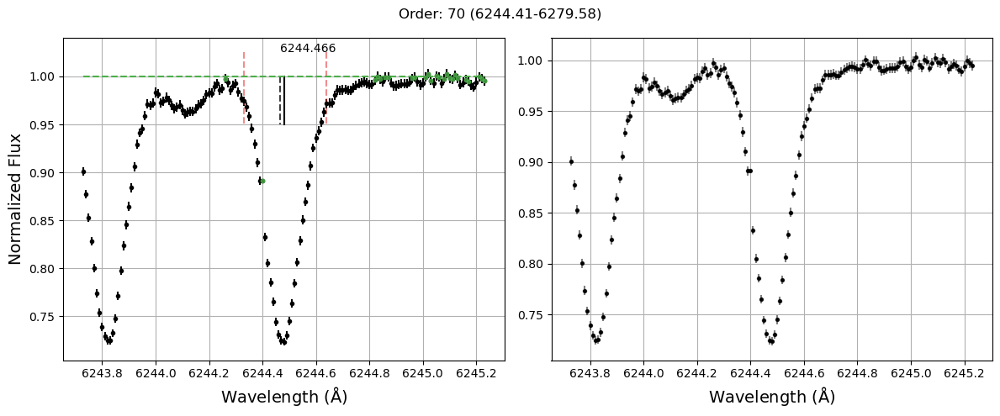

#-----------------------#


In [52]:
Test.measure_line_ew(6244.466)

/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: C I 5380.337 - Line found: 5380.32
EW: 20.69 ± 0.3 simps-int: 20.68 ± 0.3


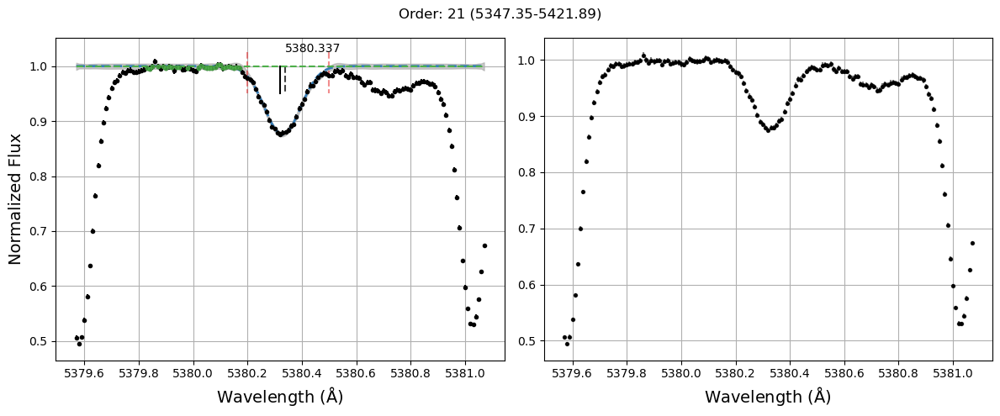

#-----------------------#
extra params: [0, 5380.2, 5380.5, 0]


In [31]:
Sun.measure_line_ew(5380.337, ex_params=[0,5380.2, 5380.5,0])

line to measure: Na I 5682.633 - Line found: 5682.650000000001
EW: 99.03 ± 0.27 simps-int: 99.03 ± 0.27


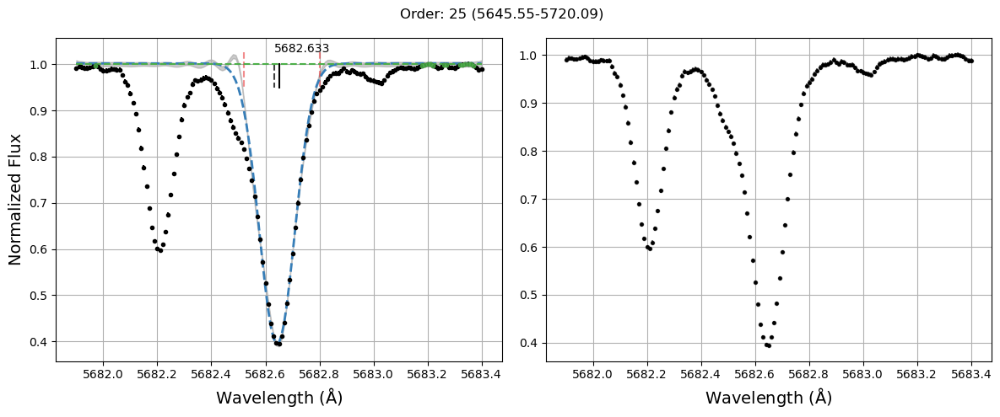

#-----------------------#
extra params: [0, 5682.52, 5682.8, 0]


In [32]:
Sun.measure_line_ew(5682.633, ex_params=[0,5682.52,5682.8,0])

line to measure: Mg I 5711.088 - Line found: 5711.1
EW: 104.66 ± 0.31 simps-int: 104.65 ± 0.31


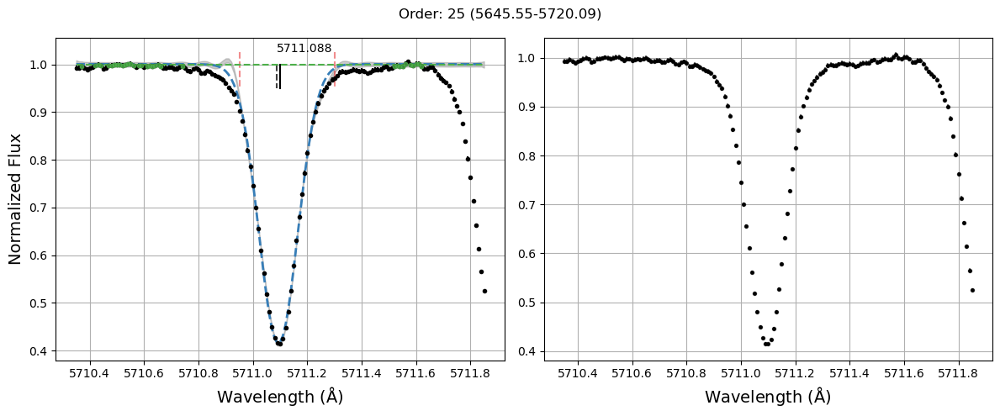

#-----------------------#
extra params: [0, 5710.95, 5711.3, 0]


In [33]:
Sun.measure_line_ew(5711.088, ex_params=[0,5710.95,5711.3,0])

line to measure: Mg I 6841.19 - Line found: 6841.35
EW: 66.64 ± 0.36 simps-int: 66.63 ± 0.36


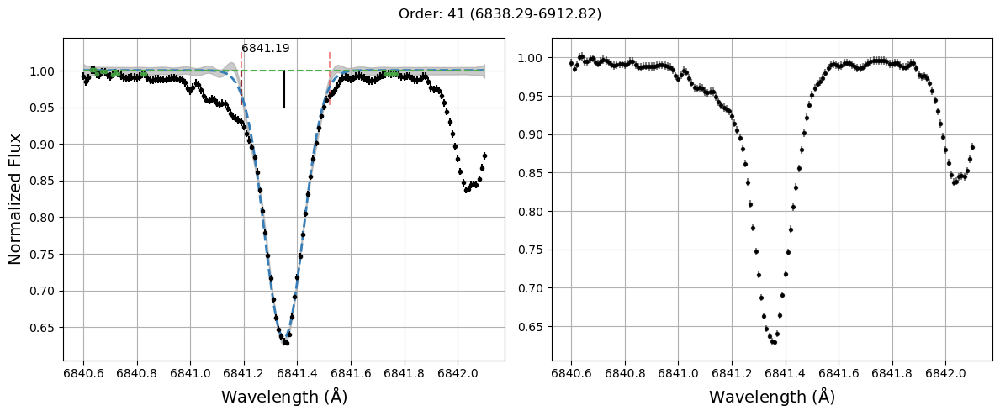

#-----------------------#
extra params: [0, 0, 0, 6841.35]


In [34]:
Sun.measure_line_ew(6841.19, ex_params=[0,0,0,6841.35])

line to measure: Ca I 6161.297 - Line found: 6161.3
EW: 63.23 ± 0.27 simps-int: 63.23 ± 0.27


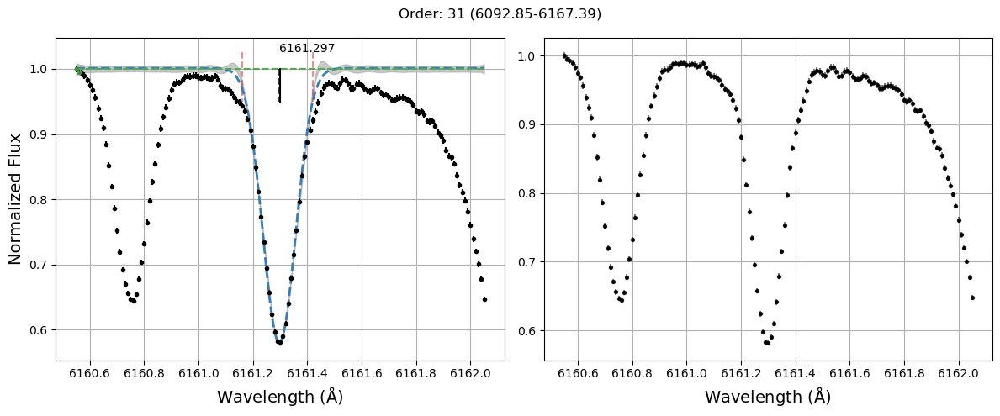

#-----------------------#
extra params: [0, 0, 6161.42, 0]


In [35]:
Sun.measure_line_ew(6161.297, ex_params=[0,0,6161.42,0])

line to measure: Ti I 5210.385 - Line found: 5210.39
EW: 88.51 ± 0.24 simps-int: 88.51 ± 0.24


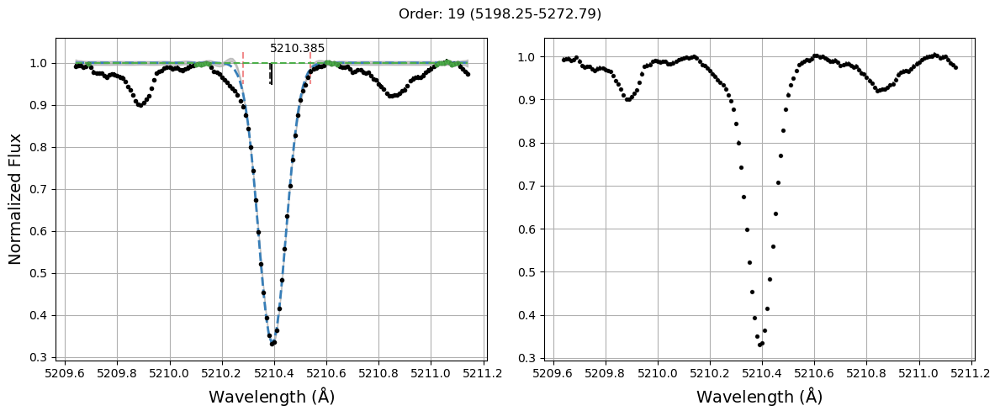

#-----------------------#
extra params: [0, 5210.28, 0, 0]


In [36]:
Sun.measure_line_ew(5210.385, ex_params=[0,5210.28,0,0])

line to measure: Ti I 5064.653 - Line found: 5064.66
EW: 87.17 ± 0.22 simps-int: 87.16 ± 0.22


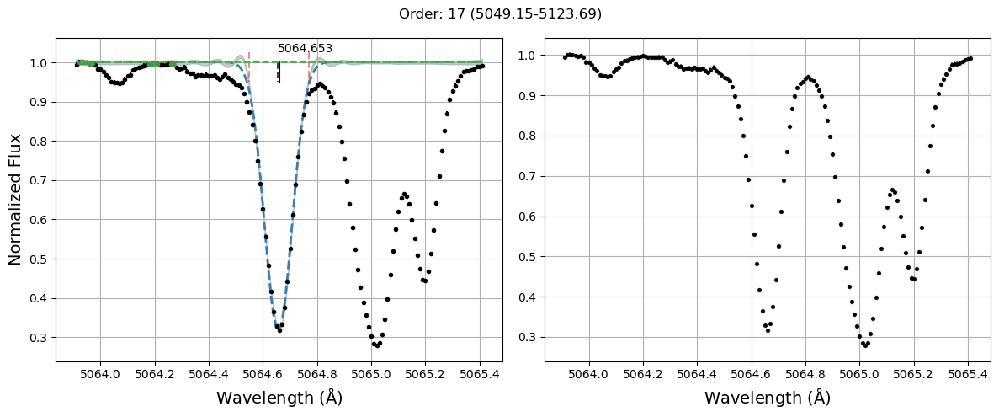

#-----------------------#
extra params: [0, 5064.55, 0, 0]


In [37]:
Sun.measure_line_ew(5064.653, ex_params=[0,5064.55,0,0])

line to measure: Ti II 5154.068 - Line found: 5154.07
EW: 69.47 ± 0.22 simps-int: 69.46 ± 0.22


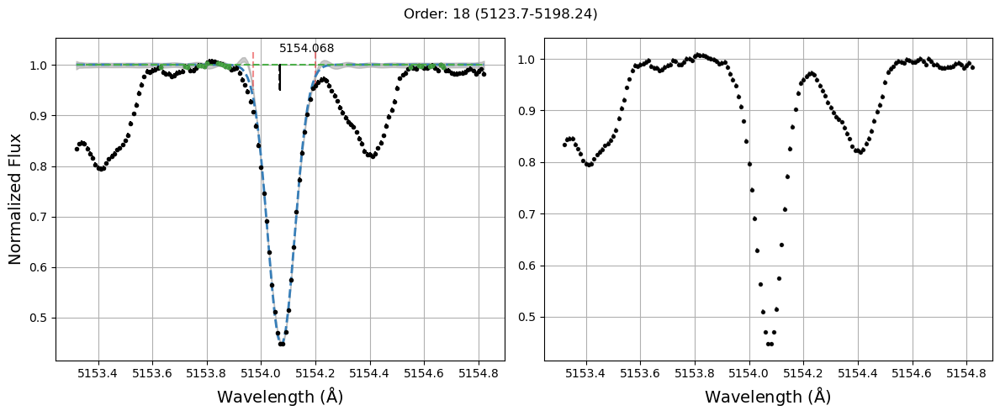

#-----------------------#
extra params: [0, 5153.97, 0, 0]


In [38]:
Sun.measure_line_ew(5154.068, ex_params=[0,5153.97,0,0])

line to measure: Cu I 5782.127 - Line found: 5782.14
EW: 80.03 ± 0.31 simps-int: 80.03 ± 0.31


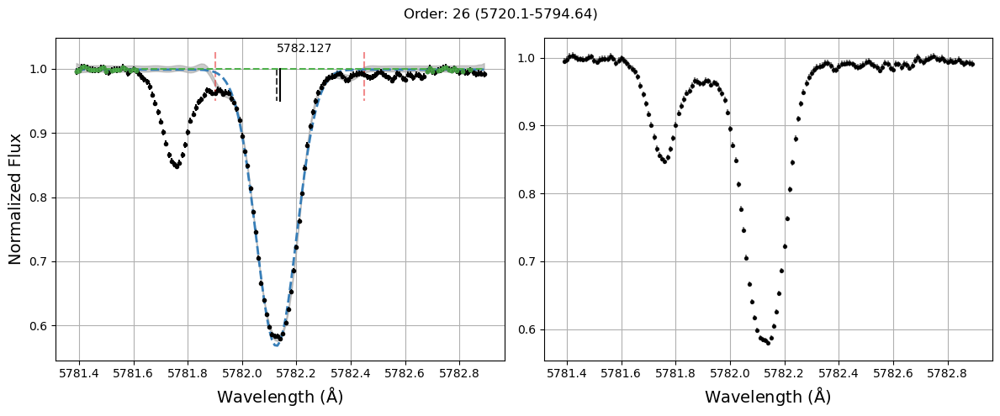

#-----------------------#
extra params: [0, 5781.9, 5782.45, 0]


In [39]:
Sun.measure_line_ew(5782.127, ex_params=[0,5781.9,5782.45,0])

line to measure: Zn I 4722.153 - Line found: 4722.16
EW: 69.76 ± 0.25 simps-int: 69.76 ± 0.25


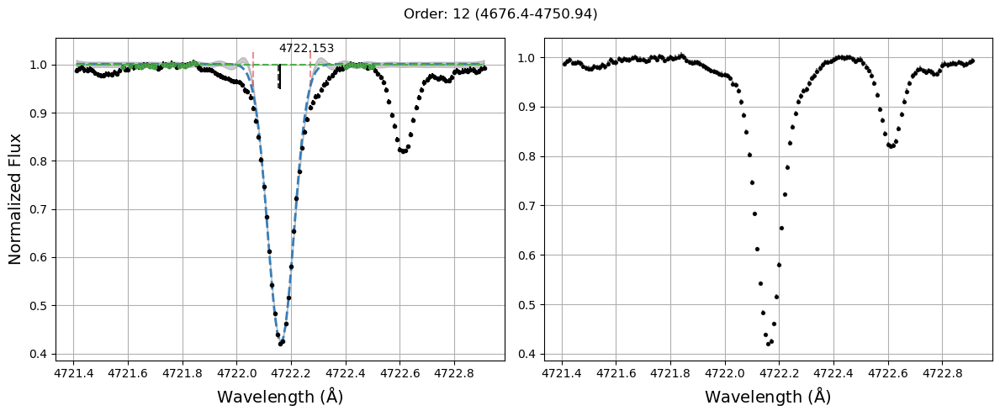

#-----------------------#
extra params: [0, 4722.06, 4722.27, 0]


In [40]:
Sun.measure_line_ew(4722.153, ex_params=[0,4722.06,4722.27,0])

In [ ]:
#5052.167
#5336.786
#5380.337
5739.469
6091.171
6081.441
6125.021
6133.963
6130.13
6224.529
6251.827
6370.341
6587.61
6595.864
6741.628
6757.171
#6841.19
6848.58

line to measure: Ti I 5739.469 - Line found: 5739.4800000000005
EW: 8.09 ± 0.23 simps-int: 8.09 ± 0.23


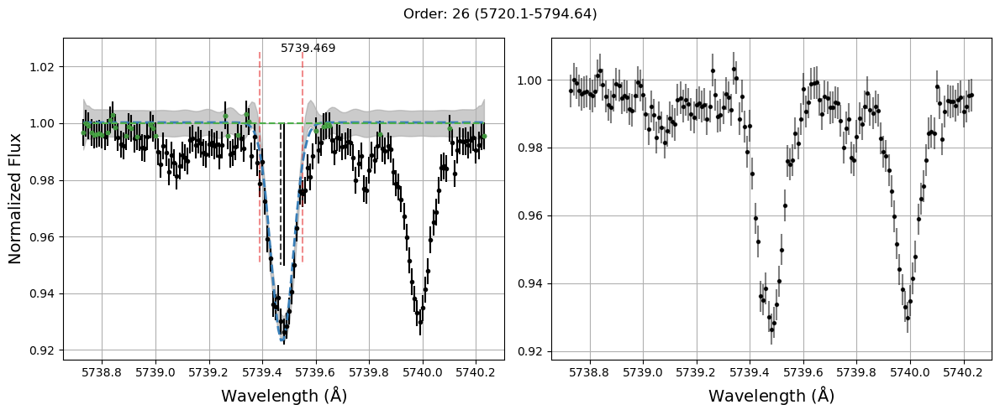

#-----------------------#
extra params: [0, 0, 5739.55, 0]


In [41]:
Sun.measure_line_ew(5739.469, ex_params=[0,0,5739.55,0])

line to measure: Ti I 6091.171 - Line found: 6091.18
EW: 14.94 ± 0.25 simps-int: 14.93 ± 0.25


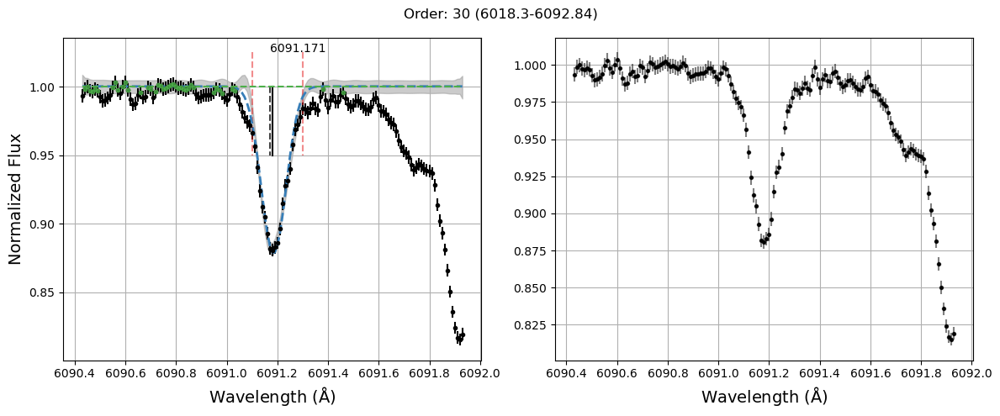

#-----------------------#
extra params: [0, 6091.1, 0, 0]


In [42]:
Sun.measure_line_ew(6091.171, ex_params=[0,6091.1,0,0])

line to measure: V I 6081.441 - Line found: 6081.4400000000005
EW: 15.41 ± 0.28 simps-int: 15.41 ± 0.28


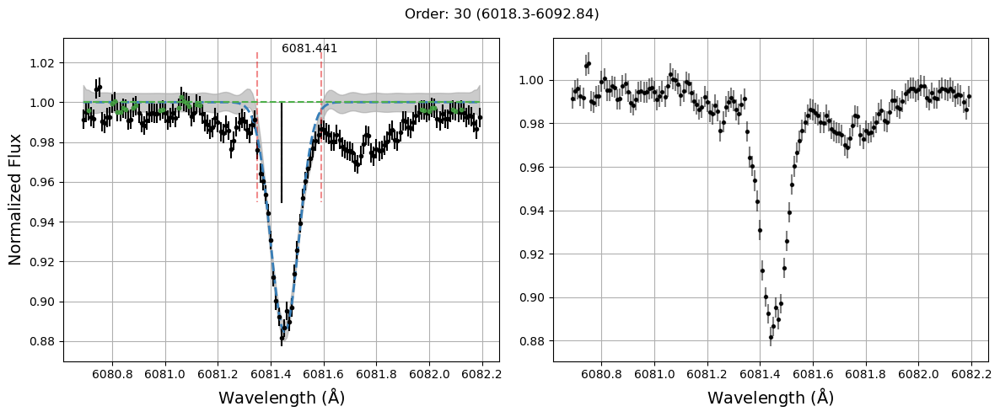

#-----------------------#
extra params: [0, 6081.35, 0, 0]


In [43]:
Sun.measure_line_ew(6081.441, ex_params=[0,6081.35,0,0])

line to measure: Si I 6125.021 - Line found: 6125.02
EW: 31.35 ± 0.31 simps-int: 31.35 ± 0.31


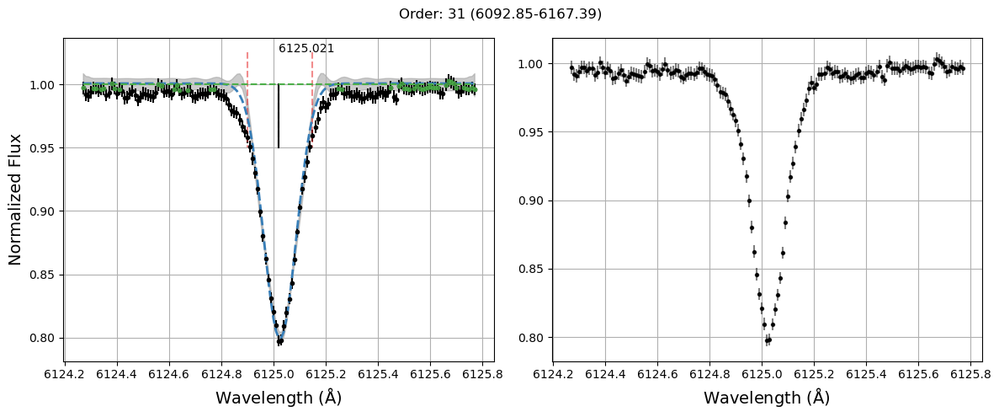

#-----------------------#
extra params: [0, 6124.9, 6125.15, 0]


In [44]:
Sun.measure_line_ew(6125.021, ex_params=[0,6124.9,6125.15,0])

line to measure: Ni I 6133.963 - Line found: 6133.96
EW: 5.3 ± 0.24 simps-int: 5.3 ± 0.24


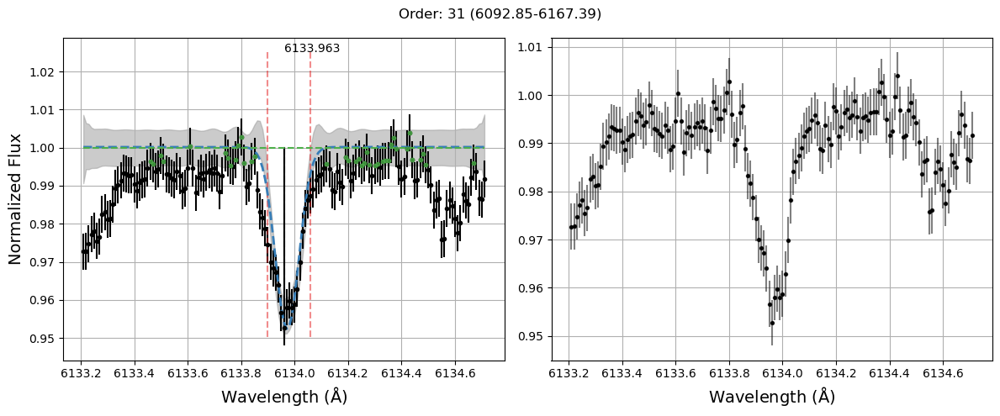

#-----------------------#
extra params: [0, 6133.9, 0, 0]


In [45]:
Sun.measure_line_ew(6133.963, ex_params=[0,6133.9,0,0])

line to measure: Ni I 6130.13 - Line found: 6130.14
EW: 21.93 ± 0.25 simps-int: 21.93 ± 0.25


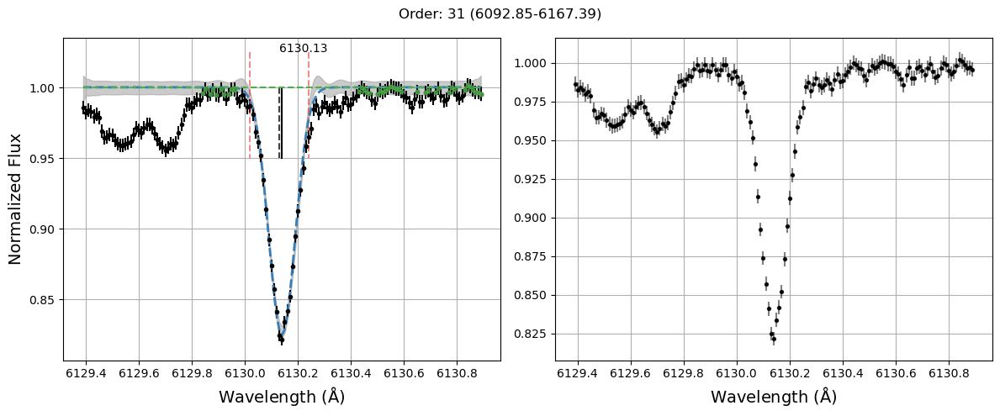

#-----------------------#
extra params: [0, 0, 6130.24, 0]


In [46]:
Sun.measure_line_ew(6130.13, ex_params=[0,0,6130.24,0])

line to measure: V I 6224.529 - Line found: 6224.51
EW: 5.7 ± 0.27 simps-int: 5.7 ± 0.27


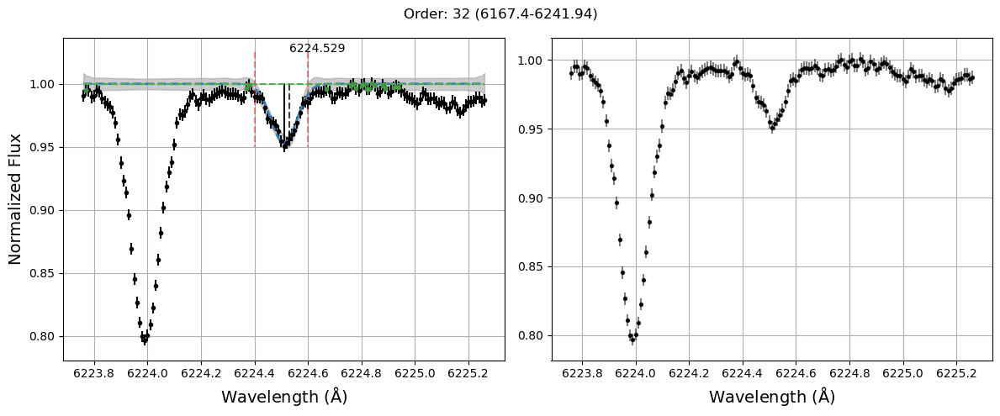

#-----------------------#
extra params: [0, 6224.4, 6224.6, 0]


In [47]:
Sun.measure_line_ew(6224.529, ex_params=[0,6224.4,6224.6,0])

/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: V I 6251.827 - Line found: 6251.83
EW: 15.14 ± 0.28 simps-int: 15.14 ± 0.28


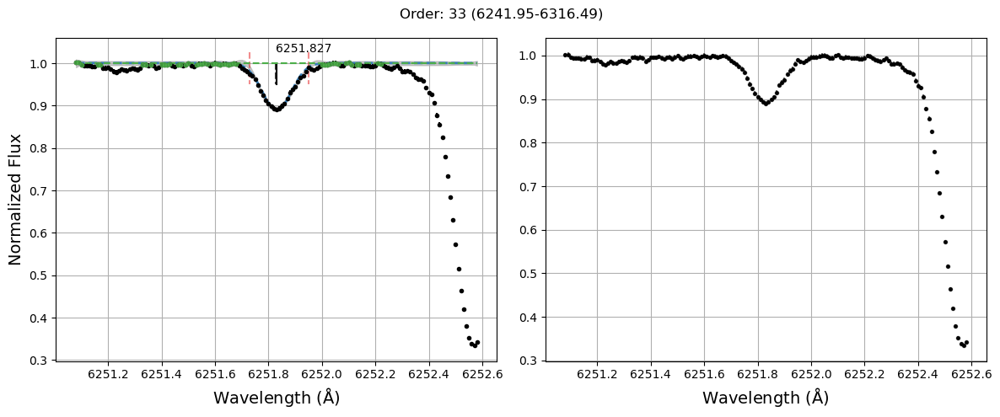

#-----------------------#
extra params: [0, 0, 6251.95, 0]


In [48]:
Sun.measure_line_ew(6251.827, ex_params=[0,0,6251.95,0])

line to measure: Ni I 6370.341 - Line found: 6370.35
EW: 13.5 ± 0.27 simps-int: 13.5 ± 0.27


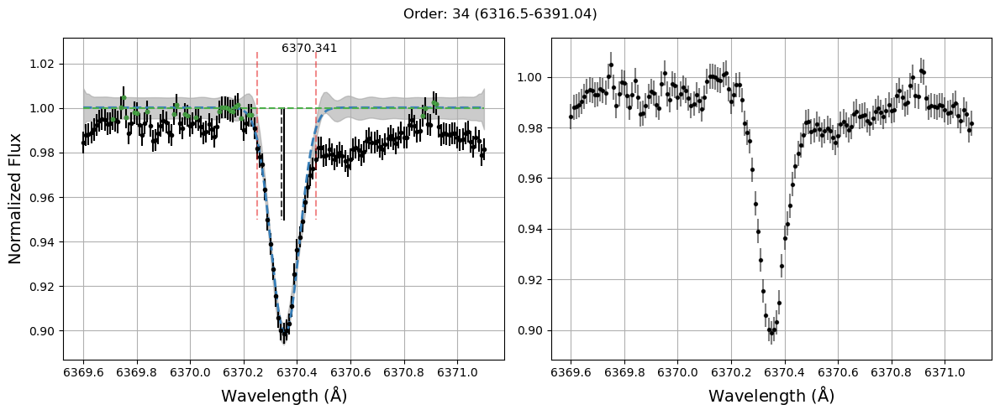

#-----------------------#
extra params: [0, 6370.25, 6370.47, 0]


In [49]:
Sun.measure_line_ew(6370.341, ex_params=[0,6370.25,6370.47,0])

/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: C I 6587.61 - Line found: 6587.64
EW: 13.89 ± 0.36 simps-int: 13.89 ± 0.36


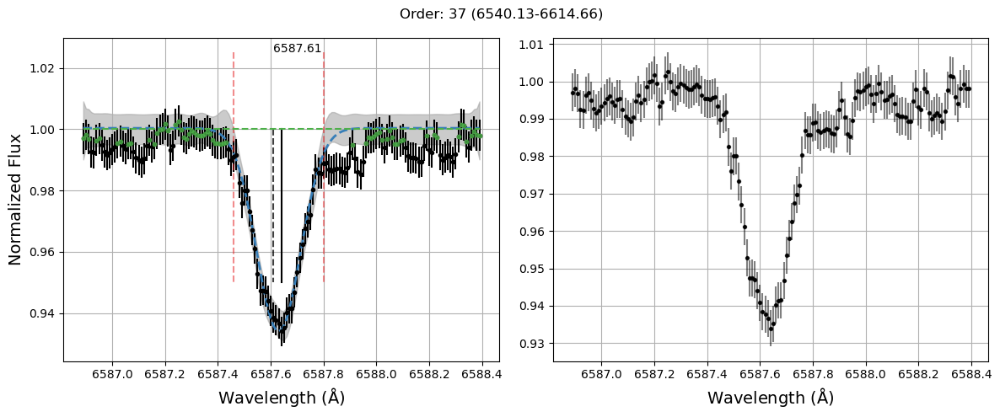

#-----------------------#
extra params: [0, 6587.46, 6587.8, 0]


In [50]:
Sun.measure_line_ew(6587.61, ex_params=[0,6587.46,6587.8,0])

/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Co I 6595.864 - Line found: 6595.88
EW: 7.08 ± 0.43 simps-int: 7.05 ± 0.73


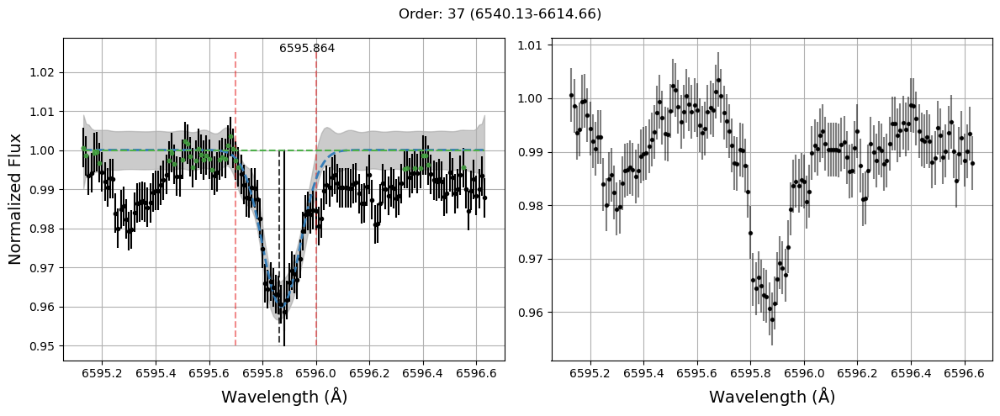

#-----------------------#
extra params: [0, 6595.7, 6596, 0]


In [51]:
Sun.measure_line_ew(6595.864, ex_params=[0,6595.7,6596,0])

/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Si I 6741.628 - Line found: 6741.63
EW: 13.79 ± 0.3 simps-int: 13.79 ± 0.3


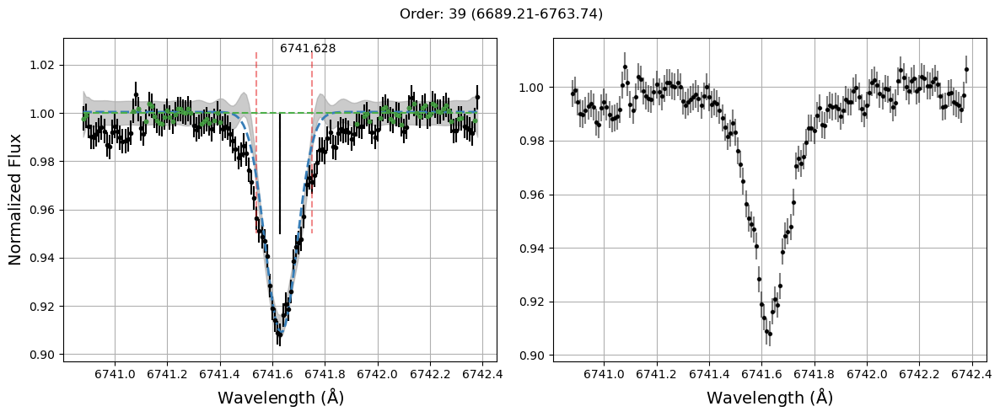

#-----------------------#
extra params: [0.005, 6741.54, 6741.75, 0]


In [52]:
Sun.measure_line_ew(6741.628, ex_params=[0.005,6741.54,6741.75,0])

line to measure: S I 6757.171 - Line found: 6757.200000000001
EW: 12.83 ± 0.41 simps-int: 12.8 ± 0.98


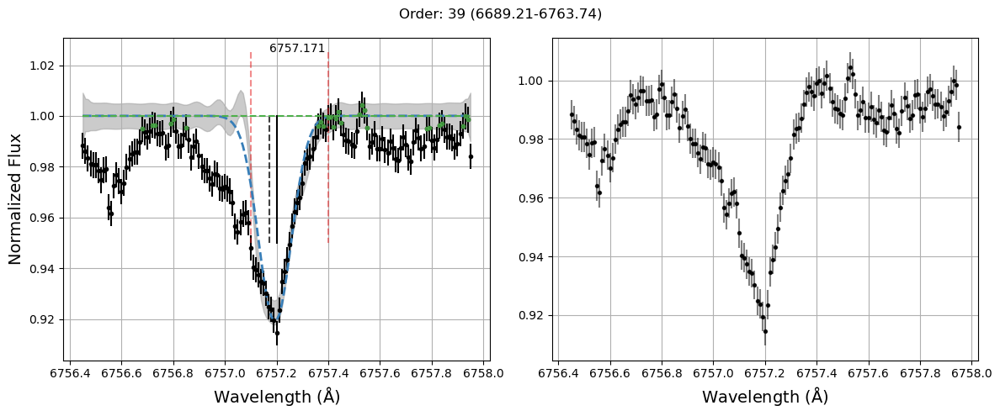

#-----------------------#
extra params: [0, 6757.1, 6757.4, 0]


In [53]:
Sun.measure_line_ew(6757.171, ex_params=[0,6757.1,6757.4,0])

line to measure: Si I 6848.58 - Line found: 6848.57
EW: 18.55 ± 0.38 simps-int: 18.55 ± 0.38


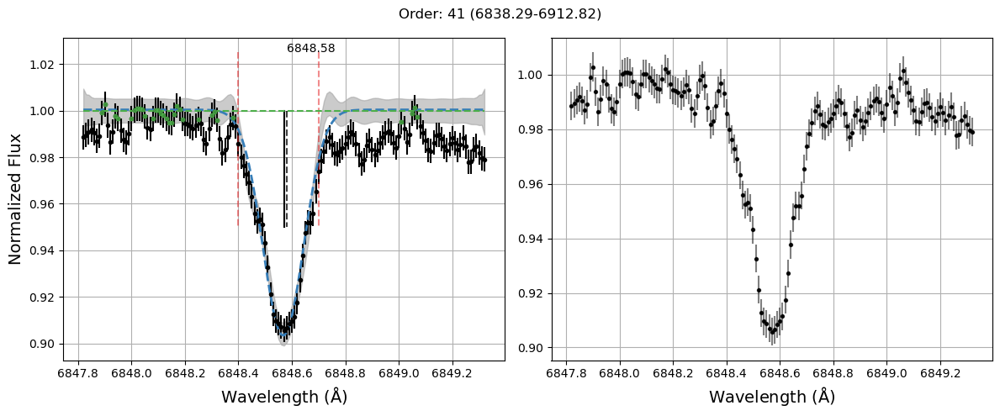

#-----------------------#
extra params: [0, 6848.4, 6848.7, 0]


In [54]:
Sun.measure_line_ew(6848.58, ex_params=[0,6848.4,6848.7,0])

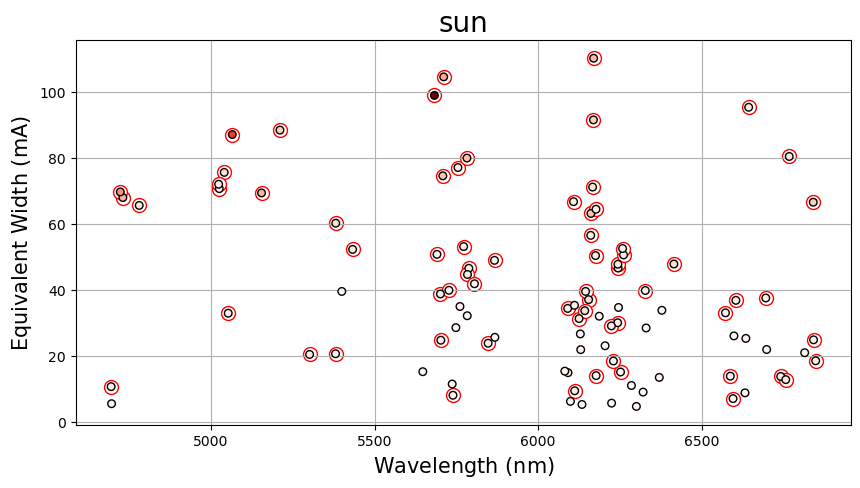

In [55]:
plot_line_info(Sun, "sun")

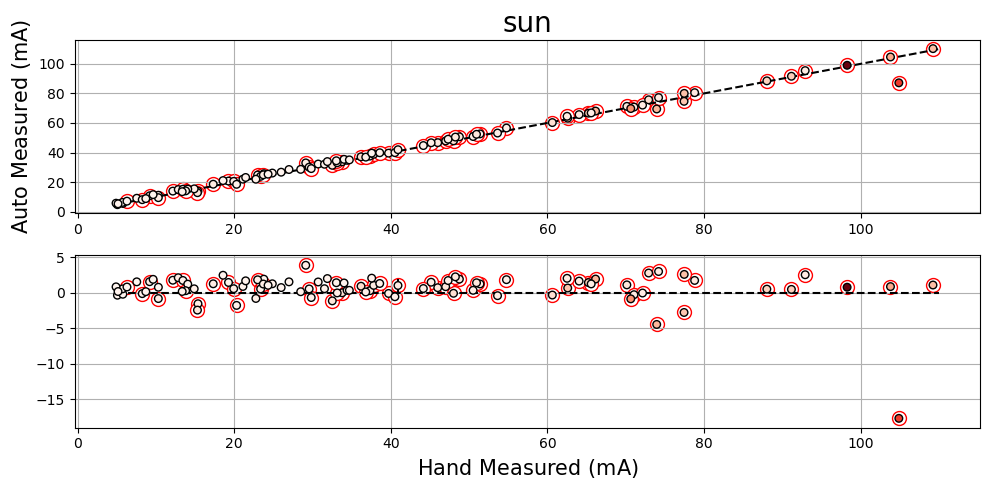

In [56]:
plot_comparison_res(Sun, ews, 'sun', xy = [5,110])

In [190]:
Sun.lines[np.where(Sun.lines_ew > 80)]

array([5682.633, 5711.088, 6169.042, 6169.563, 5210.385, 5064.653,
       6643.629, 6767.768, 5782.127])

line to measure: Ti I 5064.653 - Line found: 5064.66
EW: 89.64 ± 0.22 simps-int: 89.63 ± 0.22


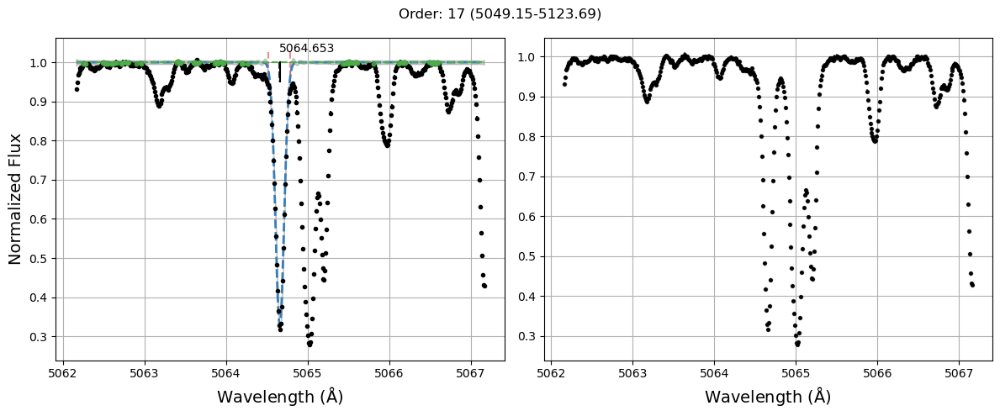

#-----------------------#


In [57]:
Sun.measure_line_ew(5064.653, ex_params=[0,0,0,0], window_size=5.0)

In [206]:
Sun.make_ew_doc('HARPS_ele_ew.txt', doc_title='Sun, XSpect Test, Jan 7 2022')

array([], dtype=float64)

In [221]:
[1.36]*len(Sun.wavelength)

[1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36,
 1.36]

In [16]:
Sun.gain = np.array([1.36]*len(Sun.wavelength))

<Figure size 640x480 with 0 Axes>

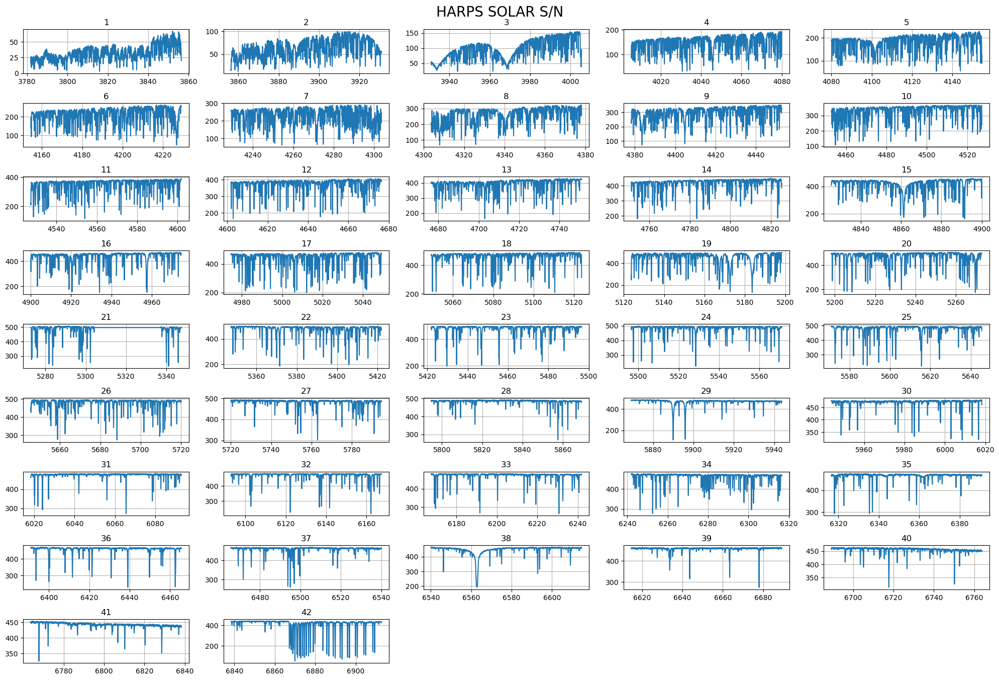

In [58]:
Sun.S_N(rows=10,cols=5)

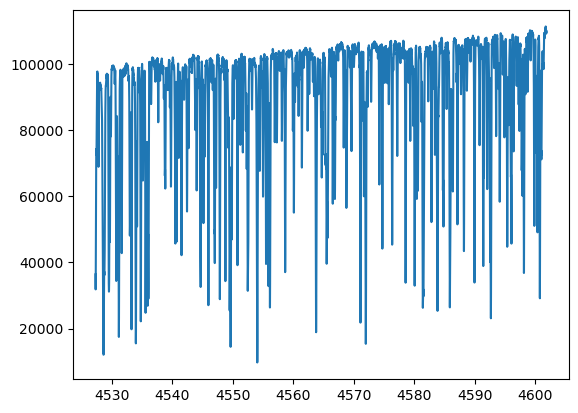

In [60]:
order = 10
plt.plot(Sun.wavelength[order], Sun.flux[order])
plt.show()